# F21MP- User Evaluation Analysis Using Artificial Neural Network

## 1. Data Exploration and Visualization #
Initial steps to inspect, visualize and analyse the different attributes in the dataset

In [1]:
# import libraries
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

### Read The Dataset

In [2]:
# Read the data set from 'app_store_reviews_dataset.JSON'
df = pd.read_json('ios_application_reviews_dataset_in_english.json')

### Inspect Data

In [3]:
# inspect dataset
df.head(5)

,rating,review_date,app_name,tags,country,title,app_id,content,version,link,_id,user_name
0,5,2021-03-04T00:00:00Z,virgin-pulse,,us,Needed Motivation,793322895,There are days that I would want to go home af...,3.168.0,https://apps.apple.com/us/app/virgin-pulse/id7...,6e6b1fa2-eee3-576f-943e-0220a0a208cc,Beginner Guitar Gal
1,5,2021-03-19T00:00:00Z,shein-shopping-womens-clothing-fashion,Love it,us,Love It,878577184,Absolutely love this site. Not only do they ha...,7.5.0,https://apps.apple.com/us/app/shein-shopping-w...,b692d5ca-415b-5aac-b372-4fcc067bf338,TB79!!
2,2,2021-03-15T00:00:00Z,brainly-homework-help-problem-solver,"Ads, Spending",us,Very helpful but...,745089947,It’s very helpful for a certain amount of time...,4.19.8,https://apps.apple.com/us/app/brainly-homework...,77560088-03c2-5235-9982-914dfc003d00,Ixnay_mi
3,5,2021-03-05T00:00:00Z,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device,gb,Good app,722120997,"Always used this app for years, works better t...",13.3,https://apps.apple.com/gb/app/mymail-email-for...,a0ed0672-d137-555f-984a-18ce90f150f2,Cowpops
4,3,2021-02-16T00:00:00Z,gin-rummy-plus-multiplayer-online-card-game,Ads,us,Too many pop ups,1068095192,"It’s a good, fun game overall but too many pop...",7.12.1,https://apps.apple.com/us/app/gin-rummy-plus-m...,05f33440-4b34-5d50-9189-974c9517bfcc,Mgbostonmass056732


In [4]:
# inspect dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 469962 entries, 0 to 469961
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   rating       469962 non-null  int64 
 1   review_date  469962 non-null  object
 2   app_name     469962 non-null  object
 3   tags         469962 non-null  object
 4   country      469962 non-null  object
 5   title        469962 non-null  object
 6   app_id       469962 non-null  int64 
 7   content      469962 non-null  object
 8   version      398179 non-null  object
 9   link         469962 non-null  object
 10  _id          469962 non-null  object
 11  user_name    469962 non-null  object
dtypes: int64(2), object(10)
memory usage: 43.0+ MB


In [5]:
df.describe()

,rating,app_id
count,469962.000000,4.699620e+05
mean,3.627612,7.734379e+08
std,1.699354,3.990327e+08
min,1.000000,2.819403e+08
25%,2.000000,4.068891e+08
50%,5.000000,7.119239e+08
75%,5.000000,1.111710e+09
max,5.000000,1.516222e+09


The data set used in this project is from crawlfeeds.com, which consists of **469,962** reviews of mobile app in apple store.
The fields include the following,<br>
* **rating**: Rating of the product on the scale of 1 to 5<br>
* **review_date**:  Time of the review<br>
* **app_name**: The app name which the review is for<br>
* **tags**: The tags associated to the review posted in the apple store<br>
* **country**: The country where the app is being used/reviewed<br>
* **title**: Review title<br>
* **app_id**: App identifier<br>
* **content**: The review text that contains the user feedback<br>
* **version**: The app version which the review is given for<br>
* **link**: Link to the app in the store<br>
* **_id**: User ID<br>
* **user_name**: The username of the reviewer<br>

### Sample Review

In [6]:
df['title'][5]

'Shein'

In [7]:
df['content'][5]

'Super great quality and u can get everything on here like shoes bags clothes stuff to homo makeup pets clothes and toys!!! And much more!!!'

### Basic Statistics

In [8]:
# Number of unique apps in the dataset
print('Number of unique apps:', len(df['app_name'].unique()))

Number of unique apps: 2265


In [9]:
# Number of unique countries in the dataset
print('Number of unique country:', len(df['country'].unique()))

Number of unique country: 102


In [10]:
# Number of unique usernames related to the users in the dataset
print('Number of unique user_name:', len(df['user_name'].unique()))

Number of unique user_name: 447658


In [11]:
# Distribution of the reviews rating in the dataset
print('Rating Distribution:\n',df.rating.value_counts())

Rating Distribution:
 5    254015
1    114141
4     42427
3     32158
2     27221
Name: rating, dtype: int64


In [12]:
# List of the countires of app users in the dataset
df.country.unique()

array(['us', 'gb', 'dk', 'qa', 'my', 'de', 'au', 'ca', 'vn', 'ng', 'ph',
       'sa', 'mx', 'id', 'nl', 'gr', 'ua', 'fr', 'tw', 'tr', 'nz', 'in',
       'be', 'hu', 'ae', 'ar', 'sg', 'se', 'fi', 'sk', 'kr', 'th', 'lt',
       'kh', 'no', 'by', 'ch', 'pl', 'hk', 'ru', 'ro', 'kw', 'ke', 'ie',
       'za', 'ge', 'at', 'br', 'om', 'it', 'do', 'eg', 'cl', 'gh', 'pk',
       'cn', 'es', 'si', 'il', 'bg', 'jp', 'sv', 'cz', 'lb', 'ye', 'az',
       'bh', 'lv', 'pt', 'mt', 'tn', 'ee', 'mz', 'pe', 'uz', 'pa', 'co',
       'mm', 'lk', 'cr', 'lu', 'iq', 'hr', 'cy', 'gt', 'rs', 'dz', 'kz',
       'ec', 'bb', 'bo', 'mo', 'ao', 'ma', 'py', 'uy', 'ni', 've', 'af',
       'bm', 'mg', 'ly'], dtype=object)

In [13]:
# Unique number of the users countries in the dataset
df.country.value_counts()

us    297513
gb     41216
ca     26383
au     14433
in     13534
       ...  
ni        18
bm        11
af        10
mg         5
ly         2
Name: country, Length: 102, dtype: int64

In [14]:
# Count of the reviews associated to each app in the dataset
df.app_name.value_counts()

bible                                            32719
among-us                                         22444
robux-spin-wheel-for-roblox                      22032
musical-ly-your-video-social-network             17684
facebook                                         16107
                                                 ...  
fashion-city-world-of-fashion                        1
nfpa-70-national-electrical-code-2017-edition        1
listen-gesture-music-player                          1
sg-live-toto                                         1
erg-2016                                             1
Name: app_name, Length: 2265, dtype: int64

### Check for repeated entries

In [15]:
# Grouping the data by User _id and app_id to check for repeaded entries
df.groupby(by=['_id', 'app_id']).count().sort_values(by=['content'], ascending = False).head(5)

,,rating,review_date,app_name,tags,country,title,content,version,link,user_name
_id,app_id,,,,,,,,,,
ed3bd4b1-4518-545d-ab2f-ba86fa8758c7,284882215,2,2,2,2,2,2,2,2,2,2
b993dd23-22f7-5a19-9cf6-e5bd17e19845,284882215,2,2,2,2,2,2,2,2,2,2
abe94867-c28a-5f1a-806a-a00bd21787aa,586447913,2,2,2,2,2,2,2,2,2,2
f9a37d3d-f4bd-5ac8-a8ad-9bd355fcc7ee,577586159,2,2,2,2,2,2,2,2,2,2
e9bb2118-0002-5d14-838c-4b3f5707710a,284882215,2,2,2,2,2,2,2,2,2,2


In [16]:
# Number of repetition
((df.groupby(by = ['_id', 'app_id']).count().sort_values(by = ['content'], ascending = False)>1) == True).sum()

rating         11686
review_date    11686
app_name       11686
tags           11686
country        11686
title          11686
content        11686
version        10726
link           11686
user_name      11686
dtype: int64

In [17]:
# droping dubplicate entries of User for smae App by the same user
df_dub = df.drop_duplicates(subset = ['_id', 'app_id'], keep = 'first', inplace = False)

In [18]:
df_dub.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 458276 entries, 0 to 469961
Data columns (total 12 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   rating       458276 non-null  int64 
 1   review_date  458276 non-null  object
 2   app_name     458276 non-null  object
 3   tags         458276 non-null  object
 4   country      458276 non-null  object
 5   title        458276 non-null  object
 6   app_id       458276 non-null  int64 
 7   content      458276 non-null  object
 8   version      387435 non-null  object
 9   link         458276 non-null  object
 10  _id          458276 non-null  object
 11  user_name    458276 non-null  object
dtypes: int64(2), object(10)
memory usage: 45.5+ MB


In [19]:
# Drop the link, app_id, version, _id, user_name, and country features as it should not be considered as a valuable features in the dataset
df_drop= df_dub.drop(['link', 'app_id', 'version', '_id', 'user_name', 'country'], axis=1)

In [20]:
df_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 458276 entries, 0 to 469961
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   rating       458276 non-null  int64 
 1   review_date  458276 non-null  object
 2   app_name     458276 non-null  object
 3   tags         458276 non-null  object
 4   title        458276 non-null  object
 5   content      458276 non-null  object
dtypes: int64(1), object(5)
memory usage: 24.5+ MB


In [21]:
print("Size before removing duplicate review: ", df.shape)
print("Size after: ", df_drop.shape)

Size before removing duplicate review:  (469962, 12)
Size after:  (458276, 6)


In [22]:
df_drop.head(5)

,rating,review_date,app_name,tags,title,content
0,5,2021-03-04T00:00:00Z,virgin-pulse,,Needed Motivation,There are days that I would want to go home af...
1,5,2021-03-19T00:00:00Z,shein-shopping-womens-clothing-fashion,Love it,Love It,Absolutely love this site. Not only do they ha...
2,2,2021-03-15T00:00:00Z,brainly-homework-help-problem-solver,"Ads, Spending",Very helpful but...,It’s very helpful for a certain amount of time...
3,5,2021-03-05T00:00:00Z,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device,Good app,"Always used this app for years, works better t..."
4,3,2021-02-16T00:00:00Z,gin-rummy-plus-multiplayer-online-card-game,Ads,Too many pop ups,"It’s a good, fun game overall but too many pop..."


### Removing NaNs

In [23]:
# Find NaNs entry
df_drop.isnull().sum()

rating         0
review_date    0
app_name       0
tags           0
title          0
content        0
dtype: int64

#### No null values have been identified in the dataset

### Explore categorical variables

In [24]:
categorical = [var for var in df_drop.columns if df[var].dtype=='O']

print('There are {} categorical variables identified \n'.format(len(categorical)))

print('The categorical variables are :\n\n', categorical)

There are 5 categorical variables identified 

The categorical variables are :

 ['review_date', 'app_name', 'tags', 'title', 'content']


In [25]:
df_drop[categorical].head()

,review_date,app_name,tags,title,content
0,2021-03-04T00:00:00Z,virgin-pulse,,Needed Motivation,There are days that I would want to go home af...
1,2021-03-19T00:00:00Z,shein-shopping-womens-clothing-fashion,Love it,Love It,Absolutely love this site. Not only do they ha...
2,2021-03-15T00:00:00Z,brainly-homework-help-problem-solver,"Ads, Spending",Very helpful but...,It’s very helpful for a certain amount of time...
3,2021-03-05T00:00:00Z,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device,Good app,"Always used this app for years, works better t..."
4,2021-02-16T00:00:00Z,gin-rummy-plus-multiplayer-online-card-game,Ads,Too many pop ups,"It’s a good, fun game overall but too many pop..."


### Explore Numerical Variables

In [26]:
# Explore the numerical variables in the given dataset

numerical = [var for var in df_drop.columns if df[var].dtype!='O']

print('There are {} numerical variables identified\n'.format(len(numerical)))

print('The numerical variables are :', numerical)

There are 1 numerical variables identified

The numerical variables are : ['rating']


In [27]:
# Explore the numerical variables

df_drop[numerical].head()

,rating
0,5
1,5
2,2
3,5
4,3


### Combine Text features in Data-frame

In [28]:
df_drop_comb_tx = df_drop

In [29]:
df_drop_comb_tx['overall_review'] = df_drop['tags'] + ' ' + df_drop['title'] + ' ' + df_drop['content']

In [30]:
df_drop_comb_tx['review_length'] = df_drop_comb_tx['overall_review'].apply(lambda col: len(col.split(' ')))

In [31]:
df_drop_comb_tx.head(5)

,rating,review_date,app_name,tags,title,content,overall_review,review_length
0,5,2021-03-04T00:00:00Z,virgin-pulse,,Needed Motivation,There are days that I would want to go home af...,Needed Motivation There are days that I would...,28
1,5,2021-03-19T00:00:00Z,shein-shopping-womens-clothing-fashion,Love it,Love It,Absolutely love this site. Not only do they ha...,Love it Love It Absolutely love this site. Not...,38
2,2,2021-03-15T00:00:00Z,brainly-homework-help-problem-solver,"Ads, Spending",Very helpful but...,It’s very helpful for a certain amount of time...,"Ads, Spending Very helpful but... It’s very he...",65
3,5,2021-03-05T00:00:00Z,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device,Good app,"Always used this app for years, works better t...",Device Good app Always used this app for years...,29
4,3,2021-02-16T00:00:00Z,gin-rummy-plus-multiplayer-online-card-game,Ads,Too many pop ups,"It’s a good, fun game overall but too many pop...","Ads Too many pop ups It’s a good, fun game ove...",16


In [32]:
# Drop the tags, title, and content after merging all of them in the new feature 'overall_review'
df_drop_comb_tx= df_drop_comb_tx.drop(['tags', 'title', 'content'], axis=1)

In [33]:
df_drop_comb_tx.head(5)

,rating,review_date,app_name,overall_review,review_length
0,5,2021-03-04T00:00:00Z,virgin-pulse,Needed Motivation There are days that I would...,28
1,5,2021-03-19T00:00:00Z,shein-shopping-womens-clothing-fashion,Love it Love It Absolutely love this site. Not...,38
2,2,2021-03-15T00:00:00Z,brainly-homework-help-problem-solver,"Ads, Spending Very helpful but... It’s very he...",65
3,5,2021-03-05T00:00:00Z,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device Good app Always used this app for years...,29
4,3,2021-02-16T00:00:00Z,gin-rummy-plus-multiplayer-online-card-game,"Ads Too many pop ups It’s a good, fun game ove...",16


In [34]:
df_drop_comb_tx.shape

(458276, 5)

In [35]:
df_drop_comb_tx['review_date'].astype('str')

0         2021-03-04T00:00:00Z
1         2021-03-19T00:00:00Z
2         2021-03-15T00:00:00Z
3         2021-03-05T00:00:00Z
4         2021-02-16T00:00:00Z
                  ...         
469957    2021-02-24T00:00:00Z
469958    2021-03-20T00:00:00Z
469959    2021-03-10T00:00:00Z
469960    2021-02-22T00:00:00Z
469961    2021-02-09T00:00:00Z
Name: review_date, Length: 458276, dtype: object

In [36]:
rd = df_drop_comb_tx['review_date']

In [37]:
df_drop_comb_tx['review_date']= rd.str.slice(stop=7)

In [38]:
df_drop_comb_tx.head(5)

,rating,review_date,app_name,overall_review,review_length
0,5,2021-03,virgin-pulse,Needed Motivation There are days that I would...,28
1,5,2021-03,shein-shopping-womens-clothing-fashion,Love it Love It Absolutely love this site. Not...,38
2,2,2021-03,brainly-homework-help-problem-solver,"Ads, Spending Very helpful but... It’s very he...",65
3,5,2021-03,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device Good app Always used this app for years...,29
4,3,2021-02,gin-rummy-plus-multiplayer-online-card-game,"Ads Too many pop ups It’s a good, fun game ove...",16


In [39]:
df_drop_comb_tx['review_date'] = pd.to_datetime(df_drop_comb_tx['review_date'], format='%Y-%m')

In [40]:
df_drop_comb_tx_monthly = df_drop_comb_tx.reset_index()
df_drop_comb_tx_monthly['review_date'] = df_drop_comb_tx_monthly['review_date'].apply(lambda x: x.strftime('%Y-%m'))
#df_drop_comb_tx_monthly.set_index('review_date', inplace=True)

In [41]:
df_drop_comb_tx_monthly.head(5)

,index,rating,review_date,app_name,overall_review,review_length
0,0,5,2021-03,virgin-pulse,Needed Motivation There are days that I would...,28
1,1,5,2021-03,shein-shopping-womens-clothing-fashion,Love it Love It Absolutely love this site. Not...,38
2,2,2,2021-03,brainly-homework-help-problem-solver,"Ads, Spending Very helpful but... It’s very he...",65
3,3,5,2021-03,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device Good app Always used this app for years...,29
4,4,3,2021-02,gin-rummy-plus-multiplayer-online-card-game,"Ads Too many pop ups It’s a good, fun game ove...",16


In [42]:
# Drop the review_date after converting it to dattime format in converted_review_date
#df_drop2= df_drop1.drop(['review_date'], axis=1)

In [43]:
df_drop_comb_tx_monthly.head(5)

,index,rating,review_date,app_name,overall_review,review_length
0,0,5,2021-03,virgin-pulse,Needed Motivation There are days that I would...,28
1,1,5,2021-03,shein-shopping-womens-clothing-fashion,Love it Love It Absolutely love this site. Not...,38
2,2,2,2021-03,brainly-homework-help-problem-solver,"Ads, Spending Very helpful but... It’s very he...",65
3,3,5,2021-03,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device Good app Always used this app for years...,29
4,4,3,2021-02,gin-rummy-plus-multiplayer-online-card-game,"Ads Too many pop ups It’s a good, fun game ove...",16


In [44]:
print('Earliest Review: ', df_drop_comb_tx_monthly['review_date'].min())
print('Latest Review: ', df_drop_comb_tx_monthly['review_date'].max())

Earliest Review:  2021-01
Latest Review:  2021-04


In [45]:
df_drop_comb_tx_monthly.head(5)

,index,rating,review_date,app_name,overall_review,review_length
0,0,5,2021-03,virgin-pulse,Needed Motivation There are days that I would...,28
1,1,5,2021-03,shein-shopping-womens-clothing-fashion,Love it Love It Absolutely love this site. Not...,38
2,2,2,2021-03,brainly-homework-help-problem-solver,"Ads, Spending Very helpful but... It’s very he...",65
3,3,5,2021-03,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device Good app Always used this app for years...,29
4,4,3,2021-02,gin-rummy-plus-multiplayer-online-card-game,"Ads Too many pop ups It’s a good, fun game ove...",16


In [46]:
df_drop_comb_tx_monthly= df_drop_comb_tx_monthly.drop(['index'], axis=1)

In [47]:
df_drop_comb_tx_monthly.head(5)

,rating,review_date,app_name,overall_review,review_length
0,5,2021-03,virgin-pulse,Needed Motivation There are days that I would...,28
1,5,2021-03,shein-shopping-womens-clothing-fashion,Love it Love It Absolutely love this site. Not...,38
2,2,2021-03,brainly-homework-help-problem-solver,"Ads, Spending Very helpful but... It’s very he...",65
3,5,2021-03,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device Good app Always used this app for years...,29
4,3,2021-02,gin-rummy-plus-multiplayer-online-card-game,"Ads Too many pop ups It’s a good, fun game ove...",16


In [48]:
# Divide the data by score and group for each month
grp_r1=df_drop_comb_tx_monthly[df_drop_comb_tx_monthly['rating']==1]
grp_r2=df_drop_comb_tx_monthly[df_drop_comb_tx_monthly['rating']==2]
grp_r3=df_drop_comb_tx_monthly[df_drop_comb_tx_monthly['rating']==3]
grp_r4=df_drop_comb_tx_monthly[df_drop_comb_tx_monthly['rating']==4]
grp_r5=df_drop_comb_tx_monthly[df_drop_comb_tx_monthly['rating']==5]

grp_date_1=grp_r1.groupby(by=['review_date']).count();
grp_date_2=grp_r2.groupby(by=['review_date']).count();
grp_date_3=grp_r3.groupby(by=['review_date']).count();
grp_date_4=grp_r4.groupby(by=['review_date']).count();
grp_date_5=grp_r5.groupby(by=['review_date']).count();

grp_date_1.reset_index(inplace=True); #to make it to column
grp_date_2.reset_index(inplace=True);
grp_date_3.reset_index(inplace=True);
grp_date_4.reset_index(inplace=True);
grp_date_5.reset_index(inplace=True);

In [49]:
#import matplotlib as plt
import matplotlib.pyplot as plt 
%matplotlib inline

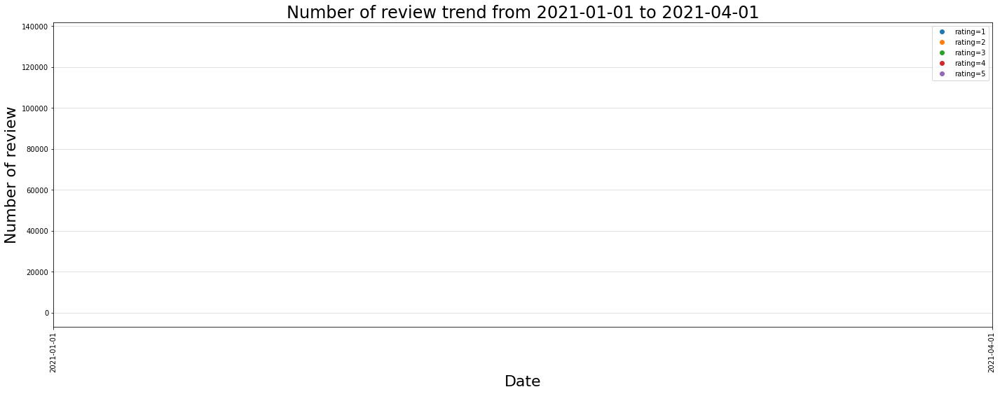

In [50]:
# review count by score for each month from 2021-01-01 to 2021-04-01
plt.figure(figsize=(24,8))

plt.plot_date(x=grp_date_1['review_date'],y=grp_date_1['rating'],label='rating=1');
plt.plot_date(x=grp_date_2['review_date'],y=grp_date_2['rating'],label='rating=2');
plt.plot_date(x=grp_date_3['review_date'],y=grp_date_3['rating'],label='rating=3');
plt.plot_date(x=grp_date_4['review_date'],y=grp_date_4['rating'],label='rating=4');
plt.plot_date(x=grp_date_5['review_date'],y=grp_date_5['rating'],label='rating=5');
plt.xticks(rotation=90);
plt.legend()
plt.grid(linewidth=0.5,alpha=0.75)
plt.xlim('2021-01-01','2021-04-01');
plt.xlabel('Date',fontsize=22)
plt.ylabel('Number of review',fontsize=22)
plt.title('Number of review trend from 2021-01-01 to 2021-04-01',fontsize=24);

In [51]:
df_drop_comb_tx_monthly.head(5)

,rating,review_date,app_name,overall_review,review_length
0,5,2021-03,virgin-pulse,Needed Motivation There are days that I would...,28
1,5,2021-03,shein-shopping-womens-clothing-fashion,Love it Love It Absolutely love this site. Not...,38
2,2,2021-03,brainly-homework-help-problem-solver,"Ads, Spending Very helpful but... It’s very he...",65
3,5,2021-03,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device Good app Always used this app for years...,29
4,3,2021-02,gin-rummy-plus-multiplayer-online-card-game,"Ads Too many pop ups It’s a good, fun game ove...",16


### Exploratory Data Analysis

In [52]:
print('Number of unique rating:', len(df_drop_comb_tx_monthly['rating'].unique()))

Number of unique rating: 5


In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

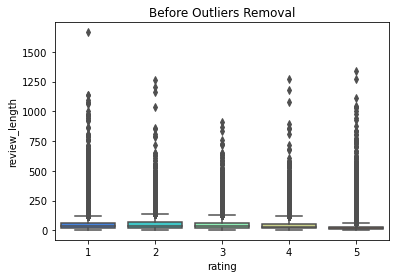

In [54]:
# Plot the review length for each rating
sns.boxplot(x = 'rating', y = 'review_length', data = df_drop_comb_tx_monthly, palette = 'rainbow').set(title='Before Outliers Removal')
plt.show()

In [55]:
# Find the review instance with maximum text size
max(df_drop_comb_tx_monthly['review_length'])

1664

In [56]:
# Identify the index of the maximum review text size
print(df_drop_comb_tx_monthly['overall_review'][df_drop_comb_tx_monthly['review_length'] == 1664])

291098    Audio, Bugs, Hate it, Love it, Waiting Shrek o...
Name: overall_review, dtype: object


In [57]:
# Print the review text for with the maximum text size
df_drop_comb_tx_monthly['overall_review'][293680]

'Inaccurate IXL IS SO BAD IT IS LIKE WHY DOES IT MAKE YOU GO BACK EVERY TIME YOU GET IT WRONG.'

In [58]:
# Find the review instance with minimum text size
min(df_drop_comb_tx_monthly['review_length'])

3

In [59]:
# Identify the index of the maximum review text size
print(df_drop_comb_tx_monthly['overall_review'][df_drop_comb_tx_monthly['review_length'] == 3])

39                                               Like Great
321                             Gryffindor Chickenwing09876
409                                                 Top Top
593                                              Hahah Cool
619                                               Cool Cool
                                ...                        
457838                                            cool cool
457929                                             🔥🔥 Brill
457936                                          Great Works
458039                          Device Adufeolatunji iPhone
458103     改进建议 goodnotes在苹果设备打开深色模式时，笔的thickness看不清，thi...
Name: overall_review, Length: 4585, dtype: object


In [60]:
# Print the review text for with the maximum text size
df_drop_comb_tx_monthly['overall_review'][457838]

' cool cool'

In [61]:
print(df_drop_comb_tx_monthly['overall_review'][df_drop_comb_tx_monthly['rating'] == 1])

12        Bugs Question mark on ehteraz When i change my...
15        Family, Feature Requests Awful Corporation Goo...
16        Ads, Level, Love it Stop the ads!! I love this...
17        Ads, Facebook, Feature Requests Down hill It’s...
18         :/ This App was great but now everything cost...
                                ...                        
458260    Difficult, Hate it Terrible!! My teacher alway...
458262    Device, Feature Requests, Love it, Updates Luc...
458266    Spending Bad Makes you spend money\nDossent gi...
458270    Privacy NOT Useful - waste of time Ok my score...
458271     Holds your money for over 21 days Ebay put a ...
Name: overall_review, Length: 106433, dtype: object


In [62]:
# Rating 1 review example
df_drop_comb_tx_monthly['overall_review'][458260]

'Difficult, Hate it Terrible!! My teacher always has a hard time doing almost anything! If I could rate worse I would!! It’s so hard to sort and find any work!!'

In [63]:
print(df_drop_comb_tx_monthly['overall_review'][df_drop_comb_tx_monthly['rating'] == 3])

4         Ads Too many pop ups It’s a good, fun game ove...
20         I can’t go in It is a fun game. But whenI ent...
44        Bugs, Difficult, Hate it, Love it, Network, Sp...
47        Feature Requests Forwarding msgs Need to be ab...
56                                       Good app It’s nice
                                ...                        
458219    Bugs, Device, Spending Consumes iphone storage...
458222                               Nice The app is great.
458247    Love it, Updates Great until the quick chat. T...
458259     Tiktok Censorship / Tiktok Censura The applic...
458264                                        Review Its ok
Name: overall_review, Length: 31253, dtype: object


In [64]:
# Rating 3 review example
df_drop_comb_tx_monthly['overall_review'][458219]

'Bugs, Device, Spending Consumes iphone storage All downloads are clear in aloha still in iphone storage it show 10.71 Gb documents and data\nRest app is awesome \nJuat help me with this weird bug or issue'

In [65]:
print(df_drop_comb_tx_monthly['overall_review'][df_drop_comb_tx_monthly['rating'] == 5])

0          Needed Motivation There are days that I would...
1         Love it Love It Absolutely love this site. Not...
3         Device Good app Always used this app for years...
5          Shein Super great quality and u can get every...
6         Family, Love it Love learning about our king! ...
                                ...                        
458267    Spending Great payment option Takes seconds to...
458268    Love it Dream Tik tok is soo entertaining I lo...
458269    Feature Requests I LOVE THIS APP So I got tikt...
458273                        Awesome! Great for the brain!
458274               Cool game! Very free to play friendly!
Name: overall_review, Length: 252681, dtype: object


In [66]:
# Rating 5 review example
df_drop_comb_tx_monthly['overall_review'][458267]

'Spending Great payment option Takes seconds to pay that friend that hounds you for the $5 he loaned you yesterday.'

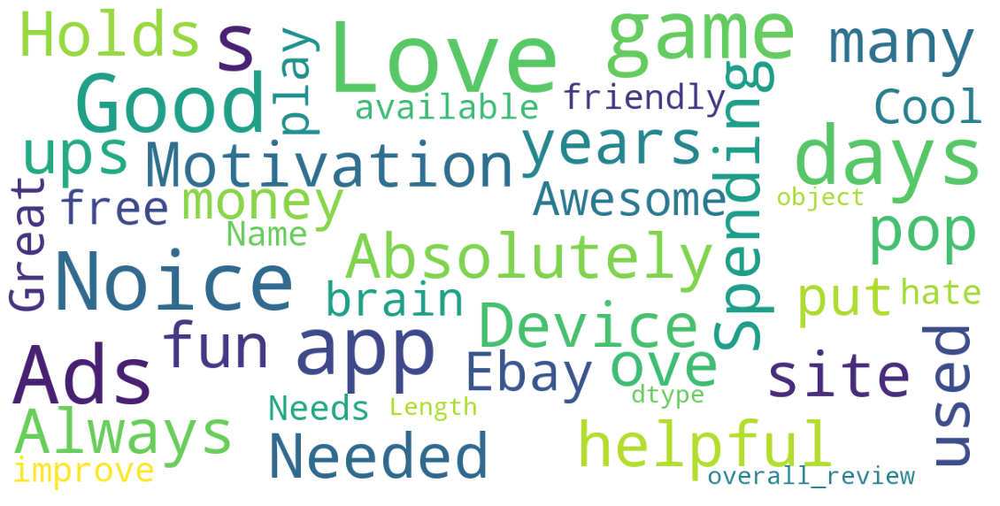

In [67]:
# wordcloud function

from wordcloud import WordCloud
import matplotlib.pyplot as plt

def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 200,
        max_font_size = 40, 
        scale = 3,
        random_state = 42
    ).generate(str(data))

    fig = plt.figure(1, figsize = (20, 20))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top = 2.3)

    plt.imshow(wordcloud)
    plt.show()
    
# print wordcloud
show_wordcloud(df_drop_comb_tx_monthly["overall_review"])

### Remove Outliers with Z-Score

In [68]:
# Find Z-score
from scipy import stats
df_drop_comb_tx_monthly['z_score'] = np.abs(stats.zscore(df_drop_comb_tx_monthly['review_length']))

In [69]:
df_unique_out_drop = df_drop_comb_tx_monthly[df_drop_comb_tx_monthly['z_score']<3]

In [70]:
print("Size before removing outliers: ", df_drop_comb_tx_monthly.shape)
print("Size after: ", df_unique_out_drop.shape)

Size before removing outliers:  (458276, 6)
Size after:  (450234, 6)


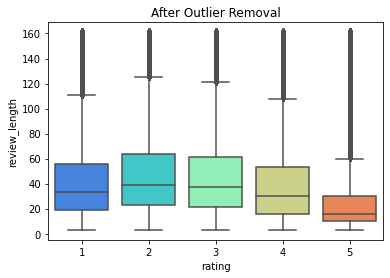

In [71]:
#Plot the rating associated to the review length after dropping the outliers
sns.boxplot(x = 'rating', y = 'review_length', data = df_unique_out_drop, palette = 'rainbow').set(title='After Outlier Removal')
plt.show()

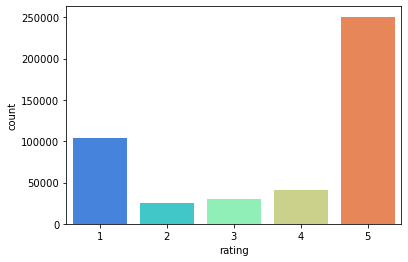

In [72]:
sns.countplot(x='rating', data = df_unique_out_drop, palette = 'rainbow')
plt.show()

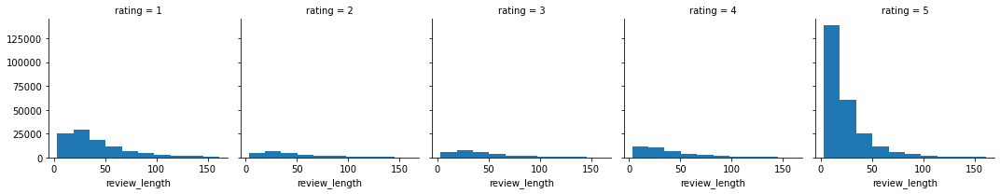

In [73]:
df_FG = sns.FacetGrid(df_unique_out_drop, col = 'rating')
df_FG.map(plt.hist, "review_length")
plt.show()

In [74]:
# Drop the z_score after removing the outliers
df_unique_out_drop= df_unique_out_drop.drop(['z_score'], axis=1)

In [75]:
df_unique_out_drop.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 450234 entries, 0 to 458275
Data columns (total 5 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   rating          450234 non-null  int64 
 1   review_date     450234 non-null  object
 2   app_name        450234 non-null  object
 3   overall_review  450234 non-null  object
 4   review_length   450234 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 20.6+ MB


In [76]:
df_unique_out_drop.astype({'rating': 'int32'}).dtypes

rating             int32
review_date       object
app_name          object
overall_review    object
review_length      int64
dtype: object

In [77]:
df_unique_out_drop.astype({'overall_review': 'string'}).dtypes

rating             int64
review_date       object
app_name          object
overall_review    string
review_length      int64
dtype: object

In [78]:
df_unique_out_drop.head(5)

,rating,review_date,app_name,overall_review,review_length
0,5,2021-03,virgin-pulse,Needed Motivation There are days that I would...,28
1,5,2021-03,shein-shopping-womens-clothing-fashion,Love it Love It Absolutely love this site. Not...,38
2,2,2021-03,brainly-homework-help-problem-solver,"Ads, Spending Very helpful but... It’s very he...",65
3,5,2021-03,mymail-email-for-hotmail-gmail-and-yahoo-mail,Device Good app Always used this app for years...,29
4,3,2021-02,gin-rummy-plus-multiplayer-online-card-game,"Ads Too many pop ups It’s a good, fun game ove...",16


### Dataset  Shuffling 

In [79]:
df_unique_out_drop = df_unique_out_drop.sample(frac = 1)

### Declare the target attribute

In [80]:
X = df_unique_out_drop.drop(['rating'], axis=1)

y = df_unique_out_drop['rating']

### Dataset Splittting into training and testing subests

In [81]:
# split the dataset into X and y, training and testing sets

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

In [82]:
# check the shape of X_train and X_test

X_train.shape, X_test.shape

((337675, 4), (112559, 4))

In [83]:
y_train.shape, y_test.shape

((337675,), (112559,))

## Natural Language Processing

In [84]:
X_train.head(5)

,review_date,app_name,overall_review,review_length
145317,2021-03,highway-rider,Fun and realistic game I have been watching m...,34
159964,2021-02,celebrity-voice-changer-funny-voice-fx-soundbo...,I need him I want Elmo NOW,8
276263,2021-02,wordscapes,"Hate it, Love it Why I rated 4 stars I love Wo...",66
382727,2021-03,botim-video-calls-and-chat,Terrible app It won’t send my anything when i...,18
171670,2021-02,bible,Love it The Bible App Love the Bible App!! It’...,25


### Text Processing and Normalization

In [101]:
import re

In [102]:
text = X_train['overall_review']

In [103]:
# Remove emojies
X_train['overall_review'] = X_train['overall_review'].str.replace('[^A-Za-z0-9]', ' ', flags=re.UNICODE)

In [104]:
# Convert the text to list
text_train_preprocessed = X_train['overall_review'].values.tolist()

In [105]:
#Remove non-english text
text_train_preprocessed_eng = list(filter(lambda ele: re.search("[a-zA-Z\s]+", ele) is not None, text_train_preprocessed))

In [106]:
text_train_preprocessed_eng

[' Seems glitchy aways trying to upsell a new feature I just want to use this without having to screw with it every time ',
 'Hate it  Updates Tveksam app Uppdatera aldrig  Var det d ligt innan    kommer bli  n s mre vid uppdatering   If you want to update this app   never update  Worse and worse for every update  Do they care about spam messages  Do they answer  No ',
 'Device  Love it An oldie but a goodie   desperately needs new icon though The app functionality is amazing  everything needed  nothing that isn t   GUI wise it s maybe a little dated    just a little  certainly not enough to kill it   tbh it s such a solid app it can afford that   But the icon  Induces chills every time I see it on my Home Screen  I can replace it on desktop  but I can t on iOS  I suspect it s a devs in joke  a bit of humour  but for gods sake drop it or give us some in app options to change it   My phone is my personal device  and it rankles to have a sense of humour I really don t share on my Home Sc

In [107]:
print("type of text_train: {}".format(type(text_train_preprocessed_eng)))
print("length of text_train: {}".format(len(text_train_preprocessed_eng)))
print("text_train[1]:\n{}".format(text_train_preprocessed_eng[253726]))

type of text_train: <class 'list'>
length of text_train: 337675
text_train[1]:
 Flagging buyers requesting personal info I get many requests for personal contact information  It s not easy to report this  I d like an easier option 


### Clean Training Data

In [108]:
# Remove html tags
text_train_preprocessed_eng = [doc.replace("<br />", " ") for doc in text_train_preprocessed_eng]

In [109]:
# Case conversion
text_train_preprocessed_eng = [word.lower() for word in text_train_preprocessed_eng]

In [110]:
# Remove numbers
text_train_preprocessed_drop_num = []
for sentence in text_train_preprocessed_eng:
    text_train_preprocessed_drop_num.append(" ".join([re.sub(r'\d+','',word ) for word in sentence.split()]))
                       
print(text_train_preprocessed_drop_num[32])

love it love it i love word games i grew up on scrabble


In [111]:
text_train_preprocessed_drop_num

['seems glitchy aways trying to upsell a new feature i just want to use this without having to screw with it every time',
 'hate it updates tveksam app uppdatera aldrig var det d ligt innan kommer bli n s mre vid uppdatering if you want to update this app never update worse and worse for every update do they care about spam messages do they answer no',
 'device love it an oldie but a goodie desperately needs new icon though the app functionality is amazing everything needed nothing that isn t gui wise it s maybe a little dated just a little certainly not enough to kill it tbh it s such a solid app it can afford that but the icon induces chills every time i see it on my home screen i can replace it on desktop but i can t on ios i suspect it s a devs in joke a bit of humour but for gods sake drop it or give us some in app options to change it my phone is my personal device and it rankles to have a sense of humour i really don t share on my home screen every time i unlock it',
 'please ad

In [112]:
# Remove Punctuations
text_train_preprocessed_drop_punc = []
for sentence in text_train_preprocessed_drop_num:
    text_train_preprocessed_drop_punc.append(" ".join([re.sub(r'[?|!|\'|"|#|*|.|,|)|(|\|/|-|:|&]$',r'',word) for word in sentence.split()]))
                       
print(text_train_preprocessed_drop_punc[24])

amazing game heaps of fun even for a long yo


In [113]:
text_train_preprocessed_drop_punc

['seems glitchy aways trying to upsell a new feature i just want to use this without having to screw with it every time',
 'hate it updates tveksam app uppdatera aldrig var det d ligt innan kommer bli n s mre vid uppdatering if you want to update this app never update worse and worse for every update do they care about spam messages do they answer no',
 'device love it an oldie but a goodie desperately needs new icon though the app functionality is amazing everything needed nothing that isn t gui wise it s maybe a little dated just a little certainly not enough to kill it tbh it s such a solid app it can afford that but the icon induces chills every time i see it on my home screen i can replace it on desktop but i can t on ios i suspect it s a devs in joke a bit of humour but for gods sake drop it or give us some in app options to change it my phone is my personal device and it rankles to have a sense of humour i really don t share on my home screen every time i unlock it',
 'please ad

### Stopwords removal

In [114]:
import nltk
#nltk.download('stopwords')
from nltk.corpus import stopwords

In [115]:
# Remove stop words
text_train_processed_drop_stop = []

stop_words = set(stopwords.words('english'))
for sentence in text_train_preprocessed_drop_punc:
    text_train_processed_drop_stop.append(" ".join([word for word in sentence.split() if not word in stop_words]))
    #clean_train.append(" ".join([word for word in nltk.word_tokenize(sentence) if not word in stop_words]))
                       
print(text_train_processed_drop_stop[24])

amazing game heaps fun even long yo


## Normalization

### Lematization using WordNet Lemmator

In [116]:
import sklearn
from nltk.stem import WordNetLemmatizer
lm = WordNetLemmatizer()

In [117]:
text_train_processed_drop_stop_lm = []

for sentence in text_train_processed_drop_stop:
    text_train_processed_drop_stop_lm.append(" ".join([lm.lemmatize(w) for w in sentence.split()]))

### Lematization using WordNet Lemmator and POS tagging

In [118]:
from nltk.corpus import wordnet

def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)

In [119]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\engba\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [120]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\engba\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [121]:
text_train_processed_drop_stop_lm_pos = []

for sentence in text_train_processed_drop_stop:
    text_train_processed_drop_stop_lm_pos.append(" ".join([lm.lemmatize(w, get_wordnet_pos(w)) for w in sentence.split()]))

### Snowball Stemmer for the lematized text using wordnet

In [122]:
from nltk.stem.snowball import SnowballStemmer
st = SnowballStemmer("english")
print("running: ", st.stem("running"))

running:  run


In [123]:
text_train_processed_drop_stop_lm_st = []
for sentence in text_train_processed_drop_stop_lm:
    text_train_processed_drop_stop_lm_st.append(" ".join([st.stem(i) for i in sentence.split()]))

### Snowball stemmer for the lematized text using wordnet and POS tagging

In [124]:
text_train_processed_drop_stop_lm_pos_st = []
for sentence in text_train_processed_drop_stop_lm_pos:
    text_train_processed_drop_stop_lm_pos_st.append(" ".join([st.stem(i) for i in sentence.split()]))

#### Comparing output from various Lamatization, Stemmer process

In [125]:
print("Original Text:\n \n", text_train_processed_drop_stop[4],'\n')
print("Lemmatized Text using NLTK wordnet:\n \n", text_train_processed_drop_stop_lm[4],'\n')
print("Lemmatized Text using NLTK wordnet with POS tagging:\n \n", text_train_processed_drop_stop_lm_pos[4],'\n')
print("Stemmed Text using Snowball Stemmer and NLTK wordnet:\n \n", text_train_processed_drop_stop_lm_st[4],'\n')
print("Stemmed Text using Snowball Stemmer, NLTK wordnet and POS tagging:\n \n", text_train_processed_drop_stop_lm_pos_st[4])

Original Text:
 
 addicting love best getting addicted reading bible daily far app love daily teachings well 

Lemmatized Text using NLTK wordnet:
 
 addicting love best getting addicted reading bible daily far app love daily teaching well 

Lemmatized Text using NLTK wordnet with POS tagging:
 
 addict love best get addict reading bible daily far app love daily teaching well 

Stemmed Text using Snowball Stemmer and NLTK wordnet:
 
 addict love best get addict read bibl daili far app love daili teach well 

Stemmed Text using Snowball Stemmer, NLTK wordnet and POS tagging:
 
 addict love best get addict read bibl daili far app love daili teach well


#### Saving the different versions of processed lists of words using Pickle

In [126]:
import pickle

In [127]:
sample_list_lm = text_train_processed_drop_stop_lm
sample_list_lm_pos = text_train_processed_drop_stop_lm_pos
sample_list_lm_st = text_train_processed_drop_stop_lm_st
sample_list_lm_pos_st = text_train_processed_drop_stop_lm_pos_st

file_name_lm = "sample_lm.pkl"
file_name_lm_pos = "sample_lm_pos.pkl"
file_name_lm_st = "sample_lm_st.pkl"
file_name_lm_pos_st = "sample_lm_pos_st.pkl"

# Pickle sample_list_lm
open_file_lm = open(file_name_lm, "wb")
pickle.dump(sample_list_lm, open_file_lm)
open_file_lm.close()

# Pickle sample_list_lm_pos
open_file_lm_pos = open(file_name_lm_pos, "wb")
pickle.dump(sample_list_lm_pos, open_file_lm_pos)
open_file_lm_pos.close()

# Pickle sample_list_lm_st
open_file_lm_st = open(file_name_lm_st, "wb")
pickle.dump(sample_list_lm_st, open_file_lm_st)
open_file_lm_st.close()

# Pickle sample_list_lm_pos_st
open_file_lm_pos_st = open(file_name_lm_pos_st, "wb")
pickle.dump(sample_list_lm_pos_st, open_file_lm_pos_st)
open_file_lm_pos_st.close()

# Pickle sample_list_lm
open_file_lm = open(file_name_lm, "rb")
loaded_list_lm = pickle.load(open_file_lm)
open_file_lm.close()

# Pickle sample_list_lm_pos
open_file_lm_pos = open(file_name_lm_pos, "rb")
loaded_list_lm_pos = pickle.load(open_file_lm_pos)
open_file_lm_pos.close()

# Pickle sample_list_lm_st
open_file_lm_st = open(file_name_lm_st, "rb")
loaded_list_lm_st = pickle.load(open_file_lm_st)
open_file_lm_st.close()

# Pickle sample_list_lm_pos_st
open_file_lm_pos_st = open(file_name_lm_pos_st, "rb")
loaded_list_lm_pos_st = pickle.load(open_file_lm_pos_st)
open_file_lm_pos_st.close()

saved_processed_text_lm = pickle.load(open(file_name_lm, 'rb'))
saved_processed_text_lm_pos = pickle.load(open(file_name_lm_pos, 'rb'))
saved_processed_text_lm_st = pickle.load(open(file_name_lm_st, 'rb'))
saved_processed_text_lm_pos_st = pickle.load(open(file_name_lm_pos_st, 'rb'))


#print(loaded_list_lm)

#### Reading Pickle file to save time

In [128]:
#Some read and write checks
print(len(saved_processed_text_lm))
print(saved_processed_text_lm[4])
print(len(saved_processed_text_lm_pos))
print(saved_processed_text_lm_pos[4])
print(len(saved_processed_text_lm_st))
print(saved_processed_text_lm_st[4])
print(len(saved_processed_text_lm_pos_st))
print(saved_processed_text_lm_pos_st[4])

337675
addicting love best getting addicted reading bible daily far app love daily teaching well
337675
addict love best get addict reading bible daily far app love daily teaching well
337675
addict love best get addict read bibl daili far app love daili teach well
337675
addict love best get addict read bibl daili far app love daili teach well


## Vector space Model and feature representation

In [173]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [174]:
# helper function to print summary of vect
def print_summary_vect(vect, fea_names):
    print('Vocabulary: ',len(vect.vocabulary_))
    print('='*100,'\nNumber of features: {}'.format(len(fea_names)))
    print('='*100,'\nFirst 20 features:\n{}'.format(fea_names[:20]))
    print('='*100,'\nFeatures 20010 to 20030:\n{}'.format(fea_names[20010:20030]))
    print('='*100,'\nEvery 2000th feature:\n{}'.format(fea_names[::2000]))

In [175]:
# helper function to print
def print_summary_X_train(xtrain):
    print("Type of count vectorizer ",type(xtrain))
    print("Shape of out text BOW vectorizer ",xtrain.get_shape())
    print("Number of unique words ", xtrain.get_shape()[1])

### Bag of Words for saved_processed_text_lm

In [176]:
count_vect_lm = CountVectorizer(min_df=10).fit(saved_processed_text_lm)
X_train_count_lm = count_vect_lm.transform(saved_processed_text_lm)
print_summary_X_train(X_train_count_lm)

feature_names_lm = count_vect_lm.get_feature_names()
print_summary_vect(count_vect_lm, feature_names_lm)

Type of count vectorizer  <class 'scipy.sparse._csr.csr_matrix'>
Shape of out text BOW vectorizer  (337675, 11831)
Number of unique words  11831
Vocabulary:  11831
Number of features: 11831
First 20 features:
['aa', 'aaa', 'aap', 'aaron', 'ab', 'abandon', 'abandoned', 'abbreviation', 'abby', 'abc', 'abd', 'abdul', 'aber', 'abhorrent', 'abide', 'ability', 'abit', 'able', 'abomination', 'abortion']
Features 20010 to 20030:
[]
Every 2000th feature:
['aa', 'comprehend', 'focus', 'lite', 'programme', 'stressed']


In [177]:
dense_vec = X_train_count_lm[:5].todense()
dense_list = dense_vec.tolist()
tfidf_data = pd.DataFrame(dense_list, columns=feature_names_lm)
tfidf_data

,aa,aaa,aap,aaron,ab,abandon,abandoned,abbreviation,abby,abc,...,zone,zoo,zoom,zoomed,zooming,zoopla,zuck,zuckerberg,zuckerburg,zynga
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Bag of Words for saved_processed_text_lm_pos_st

In [178]:
count_vect_lm_pos_st = CountVectorizer(min_df=10).fit(saved_processed_text_lm_pos_st)
X_train_count_lm_pos_st = count_vect_lm_pos_st.transform(saved_processed_text_lm_pos_st)
print_summary_X_train(X_train_count_lm_pos_st)

feature_names_lm_pos_st = count_vect_lm_pos_st.get_feature_names()
print_summary_vect(count_vect_lm_pos_st, feature_names_lm_pos_st)

Type of count vectorizer  <class 'scipy.sparse._csr.csr_matrix'>
Shape of out text BOW vectorizer  (282182, 8190)
Number of unique words  8190
Vocabulary:  8190
Number of features: 8190
First 20 features:
['aa', 'aaa', 'aap', 'aaron', 'ab', 'abandon', 'abbi', 'abbrevi', 'abc', 'abd', 'abdul', 'aber', 'abid', 'abil', 'abit', 'abl', 'abomin', 'abort', 'abound', 'abroad']
Features 20010 to 20030:
[]
Every 2000th feature:
['aa', 'doabl', 'legaci', 'risk', 'wind']


In [179]:
dense_vec_lm_pos_st = X_train_count_lm_pos_st[:5].todense()
dense_list_lm_pos_st = dense_vec_lm_pos_st.tolist()
tfidf_data_lm_pos_st = pd.DataFrame(dense_list_lm_pos_st, columns=feature_names_lm_pos_st)
tfidf_data_lm_pos_st

,aa,aaa,aap,aaron,ab,abandon,abbi,abbrevi,abc,abd,...,zoe,zombi,zone,zoo,zoom,zoopla,zuck,zuckerberg,zuckerburg,zynga
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### TF-IDF for saved_processed_text_lm

In [180]:
tf_idf_vect_lm = TfidfVectorizer(min_df=10).fit(saved_processed_text_lm)
X_train_tf_idf_lm = tf_idf_vect_lm.transform(saved_processed_text_lm)
print_summary_X_train(X_train_tf_idf_lm)

feature_names_lm = tf_idf_vect_lm.get_feature_names()
print_summary_vect(tf_idf_vect_lm, feature_names_lm)

Type of count vectorizer  <class 'scipy.sparse._csr.csr_matrix'>
Shape of out text BOW vectorizer  (337675, 11831)
Number of unique words  11831
Vocabulary:  11831
Number of features: 11831
First 20 features:
['aa', 'aaa', 'aap', 'aaron', 'ab', 'abandon', 'abandoned', 'abbreviation', 'abby', 'abc', 'abd', 'abdul', 'aber', 'abhorrent', 'abide', 'ability', 'abit', 'able', 'abomination', 'abortion']
Features 20010 to 20030:
[]
Every 2000th feature:
['aa', 'comprehend', 'focus', 'lite', 'programme', 'stressed']


### TF-IDF for saved_processed_text_lm_pos_st

In [181]:
tf_idf_vect_lm_pos_st = TfidfVectorizer(min_df=10).fit(saved_processed_text_lm_pos_st)
X_train_tf_idf_lm_pos_st = tf_idf_vect_lm_pos_st.transform(saved_processed_text_lm_pos_st)
print_summary_X_train(X_train_tf_idf_lm_pos_st)

feature_names_lm_pos_st = tf_idf_vect_lm_pos_st.get_feature_names()
print_summary_vect(tf_idf_vect_lm_pos_st, feature_names_lm_pos_st)

Type of count vectorizer  <class 'scipy.sparse._csr.csr_matrix'>
Shape of out text BOW vectorizer  (282182, 8190)
Number of unique words  8190
Vocabulary:  8190
Number of features: 8190
First 20 features:
['aa', 'aaa', 'aap', 'aaron', 'ab', 'abandon', 'abbi', 'abbrevi', 'abc', 'abd', 'abdul', 'aber', 'abid', 'abil', 'abit', 'abl', 'abomin', 'abort', 'abound', 'abroad']
Features 20010 to 20030:
[]
Every 2000th feature:
['aa', 'doabl', 'legaci', 'risk', 'wind']


### Bi-Grams for saved_processed_text_lm

In [182]:
count_bigram_vect_lm = CountVectorizer(ngram_range = (1,2), min_df = 10).fit(saved_processed_text_lm)
X_train_bigram_vect_lm = count_bigram_vect_lm.transform(saved_processed_text_lm)
print_summary_X_train(X_train_bigram_vect_lm)

feature_names_lm = count_bigram_vect_lm.get_feature_names()
print_summary_vect(count_bigram_vect_lm, feature_names_lm)

Type of count vectorizer  <class 'scipy.sparse._csr.csr_matrix'>
Shape of out text BOW vectorizer  (337675, 72630)
Number of unique words  72630
Vocabulary:  72630
Number of features: 72630
First 20 features:
['aa', 'aaa', 'aap', 'aaron', 'ab', 'abandon', 'abandoned', 'abandoned game', 'abbreviation', 'abby', 'abc', 'abc mouse', 'abd', 'abdul', 'aber', 'abhorrent', 'abide', 'ability', 'ability able', 'ability add']
Features 20010 to 20030:
['facebook deleted', 'facebook disabled', 'facebook estelle', 'facebook even', 'facebook every', 'facebook facebook', 'facebook fact', 'facebook family', 'facebook feature', 'facebook fix', 'facebook freedom', 'facebook friend', 'facebook fun', 'facebook game', 'facebook get', 'facebook getting', 'facebook give', 'facebook go', 'facebook going', 'facebook good']
Every 2000th feature:
['aa', 'allow buy', 'app amazon', 'assure', 'better making', 'called tech', 'clothes come', 'crave', 'differently', 'english version', 'facebook censor', 'focused', 'gam

### Bi-Grams for saved_processed_text_lm_pos_st

In [183]:
count_bigram_vect_lm_pos_st = CountVectorizer(ngram_range = (1,2), min_df = 10).fit(saved_processed_text_lm_pos_st)
X_train_bigram_vect_lm_pos_st = count_bigram_vect_lm_pos_st.transform(saved_processed_text_lm_pos_st)
print_summary_X_train(X_train_bigram_vect_lm_pos_st)

feature_names_lm_pos_st = count_bigram_vect_lm_pos_st.get_feature_names()
print_summary_vect(count_bigram_vect_lm_pos_st, feature_names_lm_pos_st)

Type of count vectorizer  <class 'scipy.sparse._csr.csr_matrix'>
Shape of out text BOW vectorizer  (282182, 62840)
Number of unique words  62840
Vocabulary:  62840
Number of features: 62840
First 20 features:
['aa', 'aaa', 'aap', 'aaron', 'ab', 'abandon', 'abandon game', 'abbi', 'abbrevi', 'abc', 'abc mous', 'abd', 'abdul', 'aber', 'abid', 'abil', 'abil add', 'abil chang', 'abil choos', 'abil compar']
Features 20010 to 20030:
['fun enough', 'fun entertain', 'fun especi', 'fun even', 'fun event', 'fun ever', 'fun everi', 'fun everyon', 'fun everyth', 'fun except', 'fun excit', 'fun expens', 'fun experi', 'fun fair', 'fun famili', 'fun far', 'fun fast', 'fun favorit', 'fun featur', 'fun feel']
Every 2000th feature:
['aa', 'also cannot', 'app listen', 'bagus', 'bumbl', 'class dojo', 'crash way', 'discount', 'even exit', 'featur want', 'fun differ', 'get th', 'great pass', 'homophob peopl', 'iwatch', 'like bought', 'lot wish', 'matur content', 'name call', 'olivia', 'peopl quit', 'polic', 

### TF-IDF with ngram for saved_processed_text_lm

In [184]:
tf_idf_ngram_vect_lm = TfidfVectorizer(ngram_range=(1,2), min_df=10, max_features = 10000).fit(saved_processed_text_lm)
X_train_tf_ngram_idf_lm = tf_idf_ngram_vect_lm.transform(saved_processed_text_lm)
print_summary_X_train(X_train_tf_ngram_idf_lm)

feature_names_lm = tf_idf_ngram_vect_lm.get_feature_names()
print_summary_vect(tf_idf_ngram_vect_lm, feature_names_lm)

Type of count vectorizer  <class 'scipy.sparse._csr.csr_matrix'>
Shape of out text BOW vectorizer  (337675, 10000)
Number of unique words  10000
Vocabulary:  10000
Number of features: 10000
First 20 features:
['ab', 'abc', 'ability', 'able', 'able access', 'able add', 'able buy', 'able change', 'able connect', 'able find', 'able get', 'able go', 'able keep', 'able listen', 'able log', 'able login', 'able make', 'able open', 'able play', 'able read']
Features 20010 to 20030:
[]
Every 2000th feature:
['ab', 'creating app', 'great content', 'need use', 'sometimes get']


### TF-IDF with ngram for saved_processed_text_lm_pos_st

In [185]:
tf_idf_ngram_vect_lm_pos_st = TfidfVectorizer(ngram_range=(1,2), min_df=10, max_features = 10000).fit(saved_processed_text_lm_pos_st)
X_train_tf_ngram_idf_lm_pos_st = tf_idf_ngram_vect_lm_pos_st.transform(saved_processed_text_lm_pos_st)
print_summary_X_train(X_train_tf_ngram_idf_lm_pos_st)

feature_names_lm_pos_st = tf_idf_ngram_vect_lm_pos_st.get_feature_names()
print_summary_vect(tf_idf_ngram_vect_lm_pos_st, feature_names_lm_pos_st)

Type of count vectorizer  <class 'scipy.sparse._csr.csr_matrix'>
Shape of out text BOW vectorizer  (282182, 10000)
Number of unique words  10000
Vocabulary:  10000
Number of features: 10000
First 20 features:
['ab', 'abandon', 'abc', 'abil', 'abl', 'abl access', 'abl add', 'abl buy', 'abl chang', 'abl connect', 'abl find', 'abl get', 'abl go', 'abl keep', 'abl listen', 'abl log', 'abl login', 'abl make', 'abl open', 'abl play']
Features 20010 to 20030:
[]
Every 2000th feature:
['ab', 'cup', 'great servic', 'never use', 'spend ok']


## Model training, selection and hyperparameter tuning and evaluation

In [186]:
text_test = X_test['overall_review']

In [187]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC

from sklearn.multiclass import OneVsRestClassifier

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
#from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, classification_report, f1_score,accuracy_score,auc,roc_curve,roc_auc_score

from sklearn.feature_extraction.text import TfidfTransformer


from pprint import pprint
from time import time
import logging
import warnings
warnings.filterwarnings('ignore')

### Model 1: Logistic Regression Classifier for saved_processed_text_lm

In [188]:
# Define a pipeline combining a text feature extractor with a LogisticRegression classifier for saved_processed_text_lm
pipeline_lr_lm = Pipeline([
    ('vect', CountVectorizer(min_df=10)),
    ('tfidf', TfidfTransformer()),
    ('clf', LogisticRegression(multi_class = 'ovr', solver = 'liblinear')),])

param_grid_lm = {
    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
    'clf__C': (0.001, 0.01, 0.1, 1),}

if __name__ == "__main__":
    
    grid_search_lr_lm = GridSearchCV(pipeline_lr_lm, param_grid_lm, cv=3, n_jobs=-1, verbose=1)
    
    
    print("Performing grid search...")
    print("pipeline:", [name for name, _ in pipeline_lr_lm.steps])
    print("parameters:")
    pprint(param_grid_lm)
    t0 = time()
    grid_search_lr_lm.fit(saved_processed_text_lm, y_train)
    print("done in %0.3fs" % (time() - t0))
    print()

    print("Best score: %0.3f" % grid_search_lr_lm.best_score_)
    print("Best parameters set:")
    best_parameters_lm = grid_search_lr_lm.best_estimator_.get_params()
    for param_name_lm in sorted(param_grid_lm.keys()):
        print("\t%s: %r" % (param_grid_lm, best_parameters_lm[param_name_lm]))

Performing grid search...
pipeline: ['vect', 'tfidf', 'clf']
parameters:
{'clf__C': (0.001, 0.01, 0.1, 1), 'vect__ngram_range': ((1, 1), (1, 2))}
Fitting 3 folds for each of 8 candidates, totalling 24 fits
done in 111.464s

Best score: 0.746
Best parameters set:
	{'vect__ngram_range': ((1, 1), (1, 2)), 'clf__C': (0.001, 0.01, 0.1, 1)}: 1
	{'vect__ngram_range': ((1, 1), (1, 2)), 'clf__C': (0.001, 0.01, 0.1, 1)}: (1, 2)


In [189]:
predictions_lr_lm = grid_search_lr_lm.best_estimator_.predict(text_test)

print('Confusion Matrix_lm:\n',confusion_matrix(y_test, predictions_lr_lm))
print ('\nClassification Report_lm:\n',classification_report(y_test, predictions_lr_lm))

Confusion Matrix_lm:
 [[21825   138   297   247  3327]
 [ 4130   125   321   242  1425]
 [ 3091   115   557   643  3100]
 [ 1458    56   351  1131  7205]
 [ 2093    24   203   675 59780]]

Classification Report_lm:
               precision    recall  f1-score   support

           1       0.67      0.84      0.75     25834
           2       0.27      0.02      0.04      6243
           3       0.32      0.07      0.12      7506
           4       0.38      0.11      0.17     10201
           5       0.80      0.95      0.87     62775

    accuracy                           0.74    112559
   macro avg       0.49      0.40      0.39    112559
weighted avg       0.67      0.74      0.68    112559



In [190]:
predictions_lr_lm

array([5, 5, 5, ..., 1, 1, 5], dtype=int64)

In [191]:
text_test

224031                                    Luv U already kno
296406                                         Ok No thanks
81332      Comfort May it be my need of his and I bible ...
317290    Spending $8.00 service fee?! That’s a steep se...
182551    Audio, Love it, Updates If you like the musica...
                                ...                        
169550    Level, Love it It’s so cute and fun😊😊😊😊😍😍😍😇😇😇😇...
134153    Feature Requests Eh They need to all be unlock...
426013    Hate it, Updates Confused and annoyed I was ve...
432267    Bugs, Confusing, Hate it I hate apple I am onl...
384209     Cleanup the Dictionary I believe now that it ...
Name: overall_review, Length: 112559, dtype: object

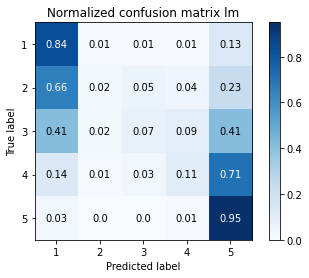

In [193]:
import scikitplot as skplt
import matplotlib.pyplot as plt
skplt.metrics.plot_confusion_matrix(y_test, predictions_lr_lm, normalize=True, title='Normalized confusion matrix lm')
plt.xlim(-0.5, 4.5)
plt.ylim(4.5, -0.5)
plt.show()

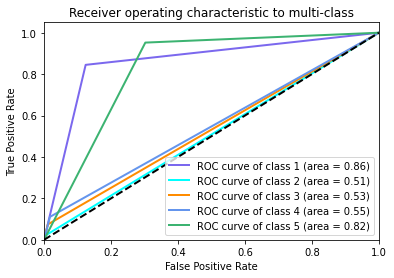

In [194]:
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt


# Binarize the output
y_lr_lm = label_binarize(y_test, classes=[1, 2, 3, 4, 5])
predic_lr_lm = label_binarize(predictions_lr_lm, classes=[1, 2, 3, 4, 5]) 

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes_lm = y_lr_lm.shape[1]
for i in range(n_classes_lm):
    fpr[i], tpr[i], _ = roc_curve(y_lr_lm[:, i], predic_lr_lm[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    
# Plot all ROC curves
plt.figure()
lw=2
colors = cycle(['mediumslateblue', 'aqua', 'darkorange', 'cornflowerblue', 'mediumseagreen'])
for i, color in zip(range(n_classes_lm), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

In [196]:
%matplotlib inline
import mglearn as mglearn
import matplotlib as plt

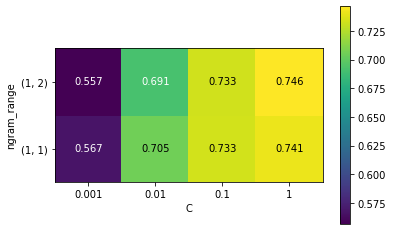

In [197]:
from matplotlib import pyplot as plt
# extract scores from grid_search
scores_lm = grid_search_lr_lm.cv_results_['mean_test_score'].reshape(-1, 2).T
# visualize heat map
heatmap_lm = mglearn.tools.heatmap(
    scores_lm, xlabel="C", ylabel="ngram_range", cmap="viridis", fmt="%.3f",
    xticklabels=param_grid_lm['clf__C'],
    yticklabels=param_grid_lm['vect__ngram_range'])
plt.colorbar(heatmap_lm)

In [198]:
# save the model to disk
import joblib
joblib.dump(grid_search_lr_lm.best_estimator_, 'finalized_model_lr_lm.pkl')

['finalized_model_lr_lm.pkl']

In [199]:
# load the model from disk
grid_search_lr_lm_saved_model = joblib.load('finalized_model_lr_lm.pkl')

In [200]:
# Running test data on saved model
result_lr_lm = grid_search_lr_lm_saved_model.score(text_test, y_test)
print('Accuracy of Logistic Regression _lm final model: %0.2f'%result_lr_lm)

Accuracy of Logistic Regression _lm final model: 0.74


### Model 2: Logistic Regression Classifier for saved_processed_text_lm_pos_st

In [219]:
# Define a pipeline combining a text feature extractor with a LogisticRegression classifier
pipeline_lr_lm_pos_st = Pipeline([
    ('vect', CountVectorizer(min_df=10)),
    ('tfidf', TfidfTransformer()),
    ('clf', LogisticRegression(multi_class = 'ovr', solver = 'liblinear')),])
param_grid_lm_pos_st = {
    'vect__ngram_range': ((1, 1), (1, 2)), 
    'clf__C': (0.001, 0.01, 0.1, 1),}
if __name__ == "__main__":
    grid_search_lr_lm_pos_st = GridSearchCV(pipeline_lr_lm_pos_st, param_grid_lm_pos_st, cv=3, n_jobs=-1, verbose=1)
    print("Performing grid search...")
    print("pipeline:", [name for name, _ in pipeline_lr_lm_pos_st.steps])
    print("parameters:")
    pprint(param_grid_lm_pos_st)
    t0 = time()
    grid_search_lr_lm_pos_st.fit(saved_processed_text_lm_pos_st, y_train)
    print("done in %0.3fs" % (time() - t0))
    print()

    print("Best score: %0.3f" % grid_search_lr_lm_pos_st.best_score_)
    print("Best parameters set:")
    best_parameters_lm_pos_st = grid_search_lr_lm_pos_st.best_estimator_.get_params()
    for param_name_lm_pos_st in sorted(param_grid_lm_pos_st.keys()):
        print("\t%s: %r" % (param_grid_lm_pos_st, best_parameters_lm_pos_st[param_name_lm_pos_st]))

Performing grid search...
pipeline: ['vect', 'tfidf', 'clf']
parameters:
{'clf__C': (0.001, 0.01, 0.1, 1), 'vect__ngram_range': ((1, 1), (1, 2))}
Fitting 3 folds for each of 8 candidates, totalling 24 fits
done in 94.168s

Best score: 0.747
Best parameters set:
	{'vect__ngram_range': ((1, 1), (1, 2)), 'clf__C': (0.001, 0.01, 0.1, 1)}: 1
	{'vect__ngram_range': ((1, 1), (1, 2)), 'clf__C': (0.001, 0.01, 0.1, 1)}: (1, 2)


In [220]:
predictions_lr_lm_pos_st = grid_search_lr_lm_pos_st.best_estimator_.predict(text_test)

print('Confusion Matrix lm_pos_st:\n',confusion_matrix(y_test, predictions_lr_lm_pos_st))
print ('\nClassification Report lm_pos_st:\n',classification_report(y_test, predictions_lr_lm_pos_st))

Confusion Matrix lm_pos_st:
 [[17281    25    85    73  8533]
 [ 2946    16    75    59  3207]
 [ 2190    15   142   133  5023]
 [ 1044     8    89   216  8918]
 [ 1921     4    75   168 60313]]

Classification Report lm_pos_st:
               precision    recall  f1-score   support

           1       0.68      0.66      0.67     25997
           2       0.24      0.00      0.01      6303
           3       0.30      0.02      0.04      7503
           4       0.33      0.02      0.04     10275
           5       0.70      0.97      0.81     62481

    accuracy                           0.69    112559
   macro avg       0.45      0.33      0.31    112559
weighted avg       0.61      0.69      0.61    112559



In [221]:
predictions_lr_lm_pos_st

array([5, 1, 5, ..., 5, 5, 5], dtype=int64)

In [222]:
text_test

109658     Great Solution to send money This app works f...
373477    Inaccurate, Log In Login problem It’s been 3 y...
205030    Difficult, Love it Fading movement across scri...
359021     Add more watch faces Pls add more watch faces...
246764    Waiting Needs touch feedback. New version alwa...
                                ...                        
149727    Audio, Love it, Updates My daily bread Thank y...
276795    Bugs, Love it Met Calvert I think e bay is gre...
37592     Feature Requests, Love it Wonderful Bible It i...
73737                                   Amazing Really good
324443     Gr3at app but they added payment This app is ...
Name: overall_review, Length: 112559, dtype: object

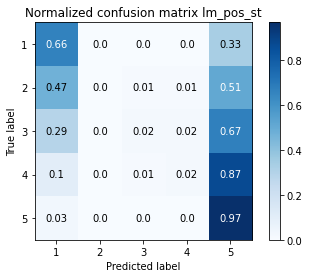

In [223]:
import scikitplot as skplt
import matplotlib.pyplot as plt
skplt.metrics.plot_confusion_matrix(y_test, predictions_lr_lm_pos_st, normalize=True, title='Normalized confusion matrix lm_pos_st')
plt.xlim(-0.5, 4.5)
plt.ylim(4.5, -0.5)
plt.show()

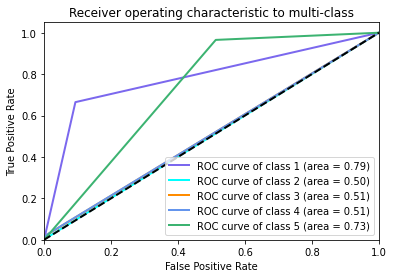

In [224]:
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt


# Binarize the output
y_lr_lm_pos_st = label_binarize(y_test, classes=[1, 2, 3, 4, 5])
predic_lr_lm_pos_st = label_binarize(predictions_lr_lm_pos_st, classes=[1, 2, 3, 4, 5]) 

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc_lm_pos_st = dict()
n_classes_lm_pos_st = y_lr_lm_pos_st.shape[1]
for i in range(n_classes_lm_pos_st):
    fpr[i], tpr[i], _ = roc_curve(y_lr_lm_pos_st[:, i], predic_lr_lm_pos_st[:, i])
    roc_auc_lm_pos_st[i] = auc(fpr[i], tpr[i])
    
# Plot all ROC curves
plt.figure()
lw=2
colors = cycle(['mediumslateblue', 'aqua', 'darkorange', 'cornflowerblue', 'mediumseagreen'])
for i, color in zip(range(n_classes_lm_pos_st), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_lm_pos_st[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

In [225]:
%matplotlib inline
import mglearn as mglearn
import matplotlib as plt

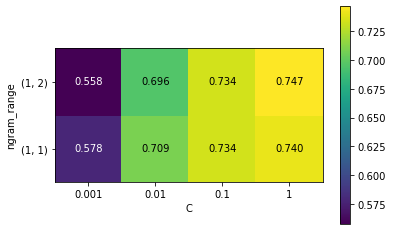

In [227]:
from matplotlib import pyplot as plt
# extract scores from grid_search
scores_lm_pos_s = grid_search_lr_lm_pos_st.cv_results_['mean_test_score'].reshape(-1, 2).T
# visualize heat map
heatmap_lm_pos_s = mglearn.tools.heatmap(
    scores_lm_pos_s, xlabel="C", ylabel="ngram_range", cmap="viridis", fmt="%.3f",
    xticklabels=param_grid_lm_pos_st['clf__C'],
    yticklabels=param_grid_lm_pos_st['vect__ngram_range'])
plt.colorbar(heatmap_lm_pos_s)

In [228]:
# save the model to disk
import joblib
joblib.dump(grid_search_lr_lm_pos_st.best_estimator_, 'finalized_model_lr_lm_pos_st.pkl')

['finalized_model_lr_lm_pos_st.pkl']

In [229]:
# load the model from disk
grid_search_lr_lm_pos_st_saved_model = joblib.load('finalized_model_lr_lm_pos_st.pkl')

In [230]:
# Running test data on saved model
result_lr_lm_pos_st = grid_search_lr_lm_pos_st_saved_model.score(text_test, y_test)
print('Accuracy of Logistic Regression lm_pos_st final model: %0.2f'%result_lr_lm_pos_st)

Accuracy of Logistic Regression lm_pos_st final model: 0.69


### Model 3: MultinomialNB classifier for saved_processed_text_lm

In [231]:
# Define a pipeline combining a text feature extractor with a MultinomialNB classifier
pipeline_nb_lm = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', OneVsRestClassifier(MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None))),
])

param_grid_nb_lm = {
    'vect__min_df': (5,10,20),
    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
}

if __name__ == "__main__":

    grid_search_nb_lm = GridSearchCV(pipeline_nb_lm, param_grid_nb_lm, cv=3, n_jobs=-1, verbose=1)
    
    print("Performing grid search...")
    print("pipeline:", [name for name, _ in pipeline_nb_lm.steps])
    print("parameters:")
    pprint(param_grid_nb_lm)
    t0 = time()
    grid_search_nb_lm.fit(saved_processed_text_lm, y_train)
    print("done in %0.3fs" % (time() - t0))
    print()

    print("Best score: %0.3f" % grid_search_nb_lm.best_score_)
    print("Best parameters set:")
    best_parameters_nb_lm = grid_search_nb_lm.best_estimator_.get_params()
    for param_name_nb_lm in sorted(param_grid_nb_lm.keys()):
        print("\t%s: %r" % (param_name_nb_lm, best_parameters_nb_lm[param_name_nb_lm]))

Performing grid search...
pipeline: ['vect', 'tfidf', 'clf']
parameters:
{'vect__min_df': (5, 10, 20), 'vect__ngram_range': ((1, 1), (1, 2))}
Fitting 3 folds for each of 6 candidates, totalling 18 fits
done in 29.725s

Best score: 0.739
Best parameters set:
	vect__min_df: 10
	vect__ngram_range: (1, 2)


In [232]:
predictions_nb_lm = grid_search_nb_lm.best_estimator_.predict(text_test)

print('Confusion Matrix nb_lm:\n',confusion_matrix(y_test, predictions_nb_lm))
print ('\nClassification Report nb_lm:\n',classification_report(y_test, predictions_nb_lm))

Confusion Matrix nb_lm:
 [[22165     1    10    52  3769]
 [ 4729     0    15    52  1507]
 [ 4100     0    30   176  3197]
 [ 2383     0    19   286  7587]
 [ 2935     2    14   192 59338]]

Classification Report nb_lm:
               precision    recall  f1-score   support

           1       0.61      0.85      0.71     25997
           2       0.00      0.00      0.00      6303
           3       0.34      0.00      0.01      7503
           4       0.38      0.03      0.05     10275
           5       0.79      0.95      0.86     62481

    accuracy                           0.73    112559
   macro avg       0.42      0.37      0.33    112559
weighted avg       0.64      0.73      0.65    112559



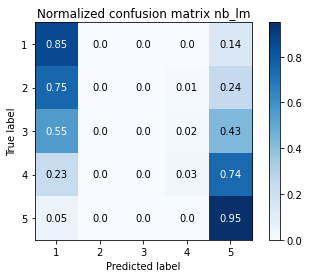

In [233]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, predictions_nb_lm, normalize=True, title='Normalized confusion matrix nb_lm')
plt.xlim(-0.5, 4.5)
plt.ylim(4.5, -0.5)
plt.show()

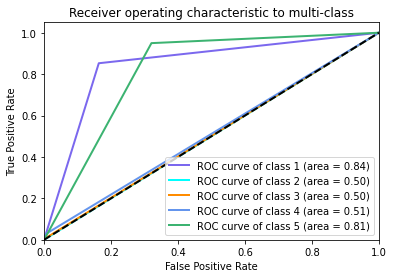

In [234]:
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt


# Binarize the output
y_nb_lm = label_binarize(y_test, classes=[1, 2, 3, 4, 5])
predic_nb_lm = label_binarize(predictions_nb_lm, classes=[1, 2, 3, 4, 5]) 

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc_nb_lm = dict()
n_classes_nb_lm = y_nb_lm.shape[1]
for i in range(n_classes_nb_lm):
    fpr[i], tpr[i], _ = roc_curve(y_nb_lm[:, i], predic_nb_lm[:, i])
    roc_auc_nb_lm[i] = auc(fpr[i], tpr[i])
    
# Plot all ROC curves
plt.figure()
lw=2
colors = cycle(['mediumslateblue', 'aqua', 'darkorange', 'cornflowerblue', 'mediumseagreen'])
for i, color in zip(range(n_classes_nb_lm), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_nb_lm[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

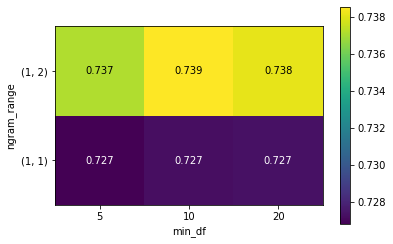

In [235]:
from matplotlib import pyplot as plt
# extract scores from grid_search
scores = grid_search_nb_lm.cv_results_['mean_test_score'].reshape(-1, 2).T
# visualize heat map
heatmap_nb_lm = mglearn.tools.heatmap(
    scores, xlabel="min_df", ylabel="ngram_range", cmap="viridis", fmt="%.3f",
    xticklabels=param_grid_nb_lm['vect__min_df'],
    yticklabels=param_grid_nb_lm['vect__ngram_range'])
plt.colorbar(heatmap_nb_lm)

In [236]:
# save the model to disk

joblib.dump(grid_search_nb_lm.best_estimator_, 'finalized_model_nb_lm.pkl')

['finalized_model_nb_lm.pkl']

In [237]:
# load the model from disk
grid_search_nb_lm_saved_model = joblib.load('finalized_model_nb_lm.pkl')

In [238]:
# Running test data on saved model
result_nb_lm = grid_search_nb_lm_saved_model.score(text_test, y_test)
print('Accuracy of Multinomial Naive Bayes lm final model: %0.2f'%result_nb_lm)

Accuracy of Multinomial Naive Bayes lm final model: 0.73


### Model 4: MultinomialNB classifier for saved_processed_text_lm_pos_st

In [239]:
# Define a pipeline combining a text feature extractor with a MultinomialNB classifier
pipeline_nb_lm_pos_st = Pipeline([
    ('vect', CountVectorizer()),
    ('tfidf', TfidfTransformer()),
    ('clf', OneVsRestClassifier(MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None))),
])

param_grid_nb_lm_pos_st = {
    'vect__min_df': (5,10,20),
    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
}

if __name__ == "__main__":

    grid_search_nb_lm_pos_st = GridSearchCV(pipeline_nb_lm_pos_st, param_grid_nb_lm_pos_st, cv=3, n_jobs=-1, verbose=1)
    
    print("Performing grid search...")
    print("pipeline:", [name for name, _ in pipeline_nb_lm_pos_st.steps])
    print("parameters:")
    pprint(param_grid_nb_lm_pos_st)
    t0 = time()
    grid_search_nb_lm_pos_st.fit(saved_processed_text_lm_pos_st, y_train)
    print("done in %0.3fs" % (time() - t0))
    print()

    print("Best score: %0.3f" % grid_search_nb_lm_pos_st.best_score_)
    print("Best parameters set:")
    best_parameters_nb_lm_pos_st = grid_search_nb_lm_pos_st.best_estimator_.get_params()
    for param_name_nb_lm_pos_st in sorted(param_grid_nb_lm_pos_st.keys()):
        print("\t%s: %r" % (param_name_nb_lm_pos_st, best_parameters_nb_lm_pos_st[param_name_nb_lm_pos_st]))

Performing grid search...
pipeline: ['vect', 'tfidf', 'clf']
parameters:
{'vect__min_df': (5, 10, 20), 'vect__ngram_range': ((1, 1), (1, 2))}
Fitting 3 folds for each of 6 candidates, totalling 18 fits
done in 28.724s

Best score: 0.738
Best parameters set:
	vect__min_df: 10
	vect__ngram_range: (1, 2)


In [240]:
predictions_nb_lm_pos_st = grid_search_nb_lm_pos_st.best_estimator_.predict(text_test)

print('Confusion Matrix nb_lm_pos_st:\n',confusion_matrix(y_test, predictions_nb_lm_pos_st))
print ('\nClassification Report nb_lm_pos_st:\n',classification_report(y_test, predictions_nb_lm_pos_st))

Confusion Matrix nb_lm_pos_st:
 [[16747     1     5    29  9215]
 [ 3177     0    10    24  3092]
 [ 2664     0    27    49  4763]
 [ 1586     0    11    80  8598]
 [ 2567     1    12    64 59837]]

Classification Report nb_lm_pos_st:
               precision    recall  f1-score   support

           1       0.63      0.64      0.64     25997
           2       0.00      0.00      0.00      6303
           3       0.42      0.00      0.01      7503
           4       0.33      0.01      0.02     10275
           5       0.70      0.96      0.81     62481

    accuracy                           0.68    112559
   macro avg       0.41      0.32      0.29    112559
weighted avg       0.59      0.68      0.60    112559



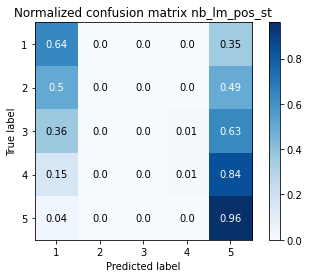

In [241]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, predictions_nb_lm_pos_st, normalize=True, title='Normalized confusion matrix nb_lm_pos_st')
plt.xlim(-0.5, 4.5)
plt.ylim(4.5, -0.5)
plt.show()

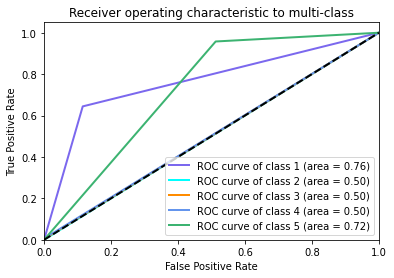

In [242]:
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt

# Binarize the output
y_nb_lm_pos_st = label_binarize(y_test, classes=[1, 2, 3, 4, 5])
predic_nb_lm_pos_st = label_binarize(predictions_nb_lm_pos_st, classes=[1, 2, 3, 4, 5]) 

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc_nb_lm_pos_st = dict()
n_classes_nb_lm_pos_st = y_nb_lm_pos_st.shape[1]
for i in range(n_classes_nb_lm_pos_st):
    fpr[i], tpr[i], _ = roc_curve(y_nb_lm_pos_st[:, i], predic_nb_lm_pos_st[:, i])
    roc_auc_nb_lm_pos_st[i] = auc(fpr[i], tpr[i])
    
# Plot all ROC curves
plt.figure()
lw=2
colors = cycle(['mediumslateblue', 'aqua', 'darkorange', 'cornflowerblue', 'mediumseagreen'])
for i, color in zip(range(n_classes_nb_lm_pos_st), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_nb_lm_pos_st[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()

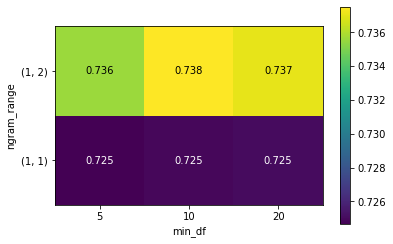

In [243]:
from matplotlib import pyplot as plt
# extract scores from grid_search
scores = grid_search_nb_lm_pos_st.cv_results_['mean_test_score'].reshape(-1, 2).T
# visualize heat map
heatmap_nb_lm_pos_st = mglearn.tools.heatmap(
    scores, xlabel="min_df", ylabel="ngram_range", cmap="viridis", fmt="%.3f",
    xticklabels=param_grid_nb_lm_pos_st['vect__min_df'],
    yticklabels=param_grid_nb_lm_pos_st['vect__ngram_range'])
plt.colorbar(heatmap_nb_lm_pos_st)

In [244]:
# save the model to disk

joblib.dump(grid_search_nb_lm_pos_st.best_estimator_, 'finalized_model_nb_lm_pos_st.pkl')

['finalized_model_nb_lm_pos_st.pkl']

In [245]:
# load the model from disk
grid_search_nb_lm_pos_st_saved_model = joblib.load('finalized_model_nb_lm_pos_st.pkl')

In [246]:
# Running test data on saved model
result_nb_lm_pos_st = grid_search_nb_lm_pos_st_saved_model.score(text_test, y_test)
print('Accuracy of Multinomial Naive Bayes lm_pos_st final model: %0.2f'%result_nb_lm_pos_st)

Accuracy of Multinomial Naive Bayes lm_pos_st final model: 0.68


### Model 5: Linear Support Vector Machine for saved_processed_text_lm

In [248]:
# Define a pipeline combining a text feature extractor with a LinearSVC classifier
pipeline_svc_lm = Pipeline([
    ('vect', CountVectorizer(min_df = 10)),
    ('tfidf', TfidfTransformer()),
    ('clf', LinearSVC(multi_class = 'ovr', dual=False)),
])
param_grid_lm = {

    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
    'clf__C': (0.01, 0.1, 10),
}

if __name__ == "__main__":

    grid_search_svc_lm = GridSearchCV(pipeline_svc_lm, param_grid_lm, cv=3, n_jobs=-1, verbose=1)
    
    print("Performing grid search...")
    print("pipeline:", [name for name, _ in pipeline_svc_lm.steps])
    print("parameters:")
    pprint(param_grid_lm)
    t0 = time()
    grid_search_svc_lm.fit(saved_processed_text_lm, y_train)
    print("done in %0.3fs" % (time() - t0))
    print()

    print("Best score: %0.3f" % grid_search_svc_lm.best_score_)
    print("Best parameters set:")
    best_parameters_lm = grid_search_svc_lm.best_estimator_.get_params()
    for param_name_lm in sorted(param_grid_lm.keys()):
        print("\t%s: %r" % (param_name_lm, best_parameters_lm[param_name_lm]))

Performing grid search...
pipeline: ['vect', 'tfidf', 'clf']
parameters:
{'clf__C': (0.01, 0.1, 10), 'vect__ngram_range': ((1, 1), (1, 2))}
Fitting 3 folds for each of 6 candidates, totalling 18 fits
done in 293.361s

Best score: 0.747
Best parameters set:
	clf__C: 0.1
	vect__ngram_range: (1, 2)


In [264]:
predictions_svc_lm = grid_search_svc_lm.best_estimator_.predict(text_test)

print('Confusion Matrix _lm:\n',confusion_matrix(y_test, predictions_svc_lm))
print ('\nClassification Report _lm:\n',classification_report(y_test, predictions_svc_lm))

Confusion Matrix _lm:
 [[22353    58   198   169  3219]
 [ 4457    52   175   206  1413]
 [ 3468    68   361   556  3050]
 [ 1757    26   217   894  7381]
 [ 2396    12   133   476 59464]]

Classification Report _lm:
               precision    recall  f1-score   support

           1       0.65      0.86      0.74     25997
           2       0.24      0.01      0.02      6303
           3       0.33      0.05      0.08      7503
           4       0.39      0.09      0.14     10275
           5       0.80      0.95      0.87     62481

    accuracy                           0.74    112559
   macro avg       0.48      0.39      0.37    112559
weighted avg       0.66      0.74      0.67    112559



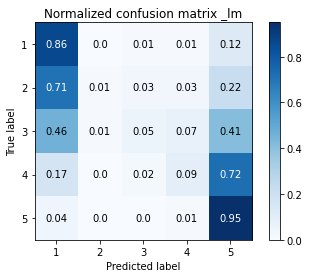

In [265]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, predictions_svc_lm, normalize=True, title='Normalized confusion matrix _lm')
plt.xlim(-0.5, 4.5)
plt.ylim(4.5, -0.5)
plt.show()

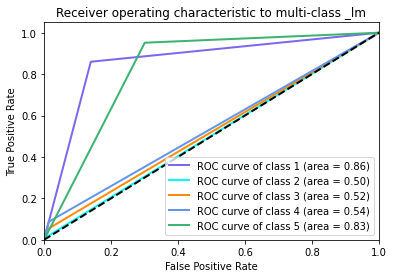

In [266]:
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt

# Binarize the output
y_svc_lm = label_binarize(y_test, classes=[1, 2, 3, 4, 5])
predic_svc_lm = label_binarize(predictions_svc_lm, classes=[1, 2, 3, 4, 5]) 

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc_lm = dict()
n_classes_lm = y_svc_lm.shape[1]
for i in range(n_classes_lm):
    fpr[i], tpr[i], _ = roc_curve(y_svc_lm[:, i], predic_svc_lm[:, i])
    roc_auc_lm[i] = auc(fpr[i], tpr[i])
    
# Plot all ROC curves
plt.figure()
lw=2
colors = cycle(['mediumslateblue', 'aqua', 'darkorange', 'cornflowerblue', 'mediumseagreen'])
for i, color in zip(range(n_classes_lm), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_lm[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class _lm')
plt.legend(loc="lower right")
plt.show()

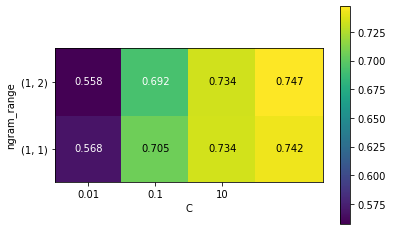

In [273]:
from matplotlib import pyplot as plt
# extract scores from grid_search
scores_svc_lm = grid_search_svc_lm.cv_results_['mean_test_score'].reshape(-1, 2).T
# visualize heat map
heatmap_svc_lm = mglearn.tools.heatmap(
    scores_lm, xlabel="C", ylabel="ngram_range", cmap="viridis", fmt="%.3f",
    xticklabels=param_grid_lm['clf__C'],
    yticklabels=param_grid_lm['vect__ngram_range'])
plt.colorbar(heatmap_svc_lm)

In [274]:
# save the model to disk
joblib.dump(grid_search_svc_lm.best_estimator_, 'finalized_model_svc_lm.pkl')

['finalized_model_svc_lm.pkl']

In [275]:
# load the model from disk
grid_search_svc_lm_saved_model = joblib.load('finalized_model_svc_lm.pkl')

In [276]:
# Running test data on saved model
result_svc_lm = grid_search_svc_lm_saved_model.score(text_test, y_test)
print('Accuracy of Linear Support Vector Machine _lm final model : %0.2f'%result_svc_lm)

Accuracy of Linear Support Vector Machine _lm final model : 0.74


### Model 6: Linear Support Vector Machine for saved_processed_text_lm_pos_st

In [278]:
# Define a pipeline combining a text feature extractor with a LinearSVC classifier
pipeline_svc_lm_pos_st = Pipeline([
    ('vect', CountVectorizer(min_df = 10)),
    ('tfidf', TfidfTransformer()),
    ('clf', LinearSVC(multi_class = 'ovr', dual=False)),
])
param_grid_lm_pos_st = {

    'vect__ngram_range': ((1, 1), (1, 2)),  # unigrams or bigrams
    'clf__C': (0.01, 0.1, 10),
}

if __name__ == "__main__":

    grid_search_svc_lm_pos_st = GridSearchCV(pipeline_svc_lm_pos_st, param_grid_lm_pos_st, cv=3, n_jobs=-1, verbose=1)
    
    print("Performing grid search...")
    print("pipeline:", [name for name, _ in pipeline_svc_lm_pos_st.steps])
    print("parameters:")
    pprint(param_grid_lm_pos_st)
    t0 = time()
    grid_search_svc_lm_pos_st.fit(saved_processed_text_lm_pos_st, y_train)
    print("done in %0.3fs" % (time() - t0))
    print()

    print("Best score: %0.3f" % grid_search_svc_lm_pos_st.best_score_)
    print("Best parameters set:")
    best_parameters_lm_pos_st = grid_search_svc_lm_pos_st.best_estimator_.get_params()
    for param_name_lm_pos_st in sorted(param_grid_lm_pos_st.keys()):
        print("\t%s: %r" % (param_name_lm_pos_st, best_parameters_lm_pos_st[param_name_lm_pos_st]))

Performing grid search...
pipeline: ['vect', 'tfidf', 'clf']
parameters:
{'clf__C': (0.01, 0.1, 10), 'vect__ngram_range': ((1, 1), (1, 2))}
Fitting 3 folds for each of 6 candidates, totalling 18 fits
done in 274.906s

Best score: 0.746
Best parameters set:
	clf__C: 0.1
	vect__ngram_range: (1, 2)


In [279]:
predictions_svc_lm_pos_st = grid_search_svc_lm_pos_st.best_estimator_.predict(text_test)

print('Confusion Matrix _lm_pos_st:\n',confusion_matrix(y_test, predictions_svc_lm_pos_st))
print ('\nClassification Report _lm_pos_st:\n',classification_report(y_test, predictions_svc_lm_pos_st))

Confusion Matrix _lm_pos_st:
 [[16980    13    47    48  8909]
 [ 2856    10    42    46  3349]
 [ 2125     7   102    85  5184]
 [ 1017     4    58   150  9046]
 [ 1886     2    48    90 60455]]

Classification Report _lm_pos_st:
               precision    recall  f1-score   support

           1       0.68      0.65      0.67     25997
           2       0.28      0.00      0.00      6303
           3       0.34      0.01      0.03      7503
           4       0.36      0.01      0.03     10275
           5       0.70      0.97      0.81     62481

    accuracy                           0.69    112559
   macro avg       0.47      0.33      0.31    112559
weighted avg       0.61      0.69      0.61    112559



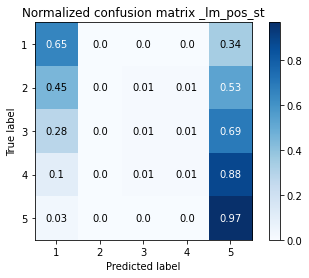

In [280]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, predictions_svc_lm_pos_st, normalize=True, title='Normalized confusion matrix _lm_pos_st')
plt.xlim(-0.5, 4.5)
plt.ylim(4.5, -0.5)
plt.show()

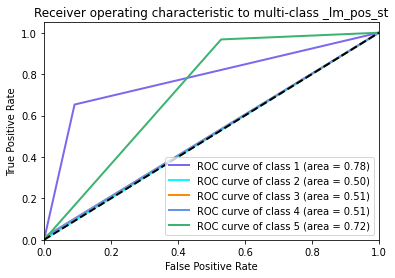

In [281]:
from sklearn.preprocessing import label_binarize
from itertools import cycle
import matplotlib.pyplot as plt

# Binarize the output
y_svc_lm_pos_st = label_binarize(y_test, classes=[1, 2, 3, 4, 5])
predic_svc_lm_pos_st = label_binarize(predictions_svc_lm_pos_st, classes=[1, 2, 3, 4, 5]) 

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc_lm_pos_st = dict()
n_classes_lm_pos_st = y_svc_lm_pos_st.shape[1]
for i in range(n_classes_lm_pos_st):
    fpr[i], tpr[i], _ = roc_curve(y_svc_lm_pos_st[:, i], predic_svc_lm_pos_st[:, i])
    roc_auc_lm_pos_st[i] = auc(fpr[i], tpr[i])
    
# Plot all ROC curves
plt.figure()
lw=2
colors = cycle(['mediumslateblue', 'aqua', 'darkorange', 'cornflowerblue', 'mediumseagreen'])
for i, color in zip(range(n_classes_lm_pos_st), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=lw,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i+1, roc_auc_lm_pos_st[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class _lm_pos_st')
plt.legend(loc="lower right")
plt.show()

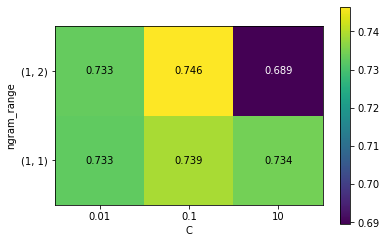

In [282]:
from matplotlib import pyplot as plt
# extract scores from grid_search
scores_svc_lm_pos_st = grid_search_svc_lm_pos_st.cv_results_['mean_test_score'].reshape(-1, 2).T
# visualize heat map
heatmap_svc_lm_pos_st = mglearn.tools.heatmap(
    scores_svc_lm_pos_st, xlabel="C", ylabel="ngram_range", cmap="viridis", fmt="%.3f",
    xticklabels=param_grid_lm_pos_st['clf__C'],
    yticklabels=param_grid_lm_pos_st['vect__ngram_range'])
plt.colorbar(heatmap_svc_lm_pos_st)

In [283]:
# save the model to disk
joblib.dump(grid_search_svc_lm_pos_st.best_estimator_, 'finalized_model_svc_lm_pos_st.pkl')

['finalized_model_svc_lm_pos_st.pkl']

In [284]:
# load the model from disk
grid_search_svc_lm_pos_st_saved_model = joblib.load('finalized_model_svc_lm_pos_st.pkl')

In [285]:
# Running test data on saved model
result_svc_lm_pos_st = grid_search_svc_lm_pos_st_saved_model.score(text_test, y_test)
print('Accuracy of Linear Support Vector Machine _lm_pos_st final model: %0.2f'%result_svc_lm_pos_st)

Accuracy of Linear Support Vector Machine _lm_pos_st final model: 0.69


## Topic Modelling of High and Low Ratings

In [202]:
#!pip install mglearn 

In [203]:
%matplotlib inline import mglearn as mglearn import matplotlib as plt

UsageError: unrecognized arguments: import mglearn as mglearn import matplotlib as plt


In [204]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\engba\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [207]:
saved_processed_text_lm
saved_processed_text_lm_pos
saved_processed_text_lm_st
saved_processed_text_lm_pos_st

['love actual bought anyth see seem legit love afford also basic get free money check app day join contest',
 'hate love spend subscript cancel refund hello love use app howev today somehow purchas year subscript would like get refund cancel subscript know get refund kind ask help small amount money student realli need back',
 'need minor improv still best opinion pleas allow user set waypoint name show someth wp etc put descript waypoint name meaningless',
 'team minecraft epic minecraft epic buy rn els u play friend alon surviv pvp server epic buy',
 'stay truth use time',
 'love rat free robux tool might work',
 'difficult spend updat good old day may call veteran game other tell get time rememb game fun play tech tree straight forward hard work dedic could get anyth lotteri littl pay win get busi perspect realli make money part wish game would anoth version set updat game would someth would will pay',
 'love god good love app',
 'love love love game think everyon download super fun

In [208]:
y_train_list = y_train.values.tolist()

In [209]:
text_train_preprocessed = X_train['overall_review'].values.tolist()

In [210]:
text_train_1_star = []
text_train_2_star = []
text_train_3_star = []
text_train_4_star = []
text_train_5_star = []

for i in range(len(y_train_list)):
    if (y_train_list[i] == 1):
        text_train_1_star.append(saved_processed_text_lm_st[i])
    elif (y_train_list[i]  == 2):
        text_train_2_star.append(saved_processed_text_lm_st[i]) 
    elif (y_train_list[i]  == 3):
        text_train_3_star.append(saved_processed_text_lm_st[i]) 
    elif (y_train_list[i]  == 4):
        text_train_4_star.append(saved_processed_text_lm_st[i]) 
    elif (y_train_list[i]  == 5):
        text_train_5_star.append(saved_processed_text_lm_st[i]) 

In [211]:
text_train_1_star = []
text_train_2_star = []
text_train_3_star = []
text_train_4_star = []
text_train_5_star = []

for i in range(len(y_train_list)):
    if (y_train_list[i] == 1):
        text_train_1_star.append(text_train_preprocessed[i])
    elif (y_train_list[i]  == 2):
        text_train_2_star.append(text_train_preprocessed[i]) 
    elif (y_train_list[i]  == 3):
        text_train_3_star.append(text_train_preprocessed[i]) 
    elif (y_train_list[i]  == 4):
        text_train_4_star.append(text_train_preprocessed[i]) 
    elif (y_train_list[i]  == 5):
        text_train_5_star.append(text_train_preprocessed[i]) 

In [212]:
print(len(text_train_1_star))
print(len(text_train_2_star))
print(len(text_train_3_star))
print(len(text_train_4_star))
print(len(text_train_5_star))

77654
18760
22722
30587
187952


### Topic Modelling for 5 Star rating reviews

In [213]:
from sklearn.decomposition import LatentDirichletAllocation

In [214]:
#vect = CountVectorizer(min_df = 1, max_df=.15)
vect = CountVectorizer(ngram_range = (1,2), min_df = 5, max_features=1000000, max_df=15)
#X = vect.fit_transform(text_train_5_star)
X = vect.fit_transform(text_train_5_star)

In [171]:
lda = LatentDirichletAllocation(n_components=10, learning_method="batch", max_iter=25, random_state=0, n_jobs = -1, verbose =1)
document_topics = lda.fit_transform(X)

iteration: 1 of max_iter: 25
iteration: 2 of max_iter: 25
iteration: 3 of max_iter: 25
iteration: 4 of max_iter: 25
iteration: 5 of max_iter: 25
iteration: 6 of max_iter: 25
iteration: 7 of max_iter: 25
iteration: 8 of max_iter: 25
iteration: 9 of max_iter: 25
iteration: 10 of max_iter: 25
iteration: 11 of max_iter: 25
iteration: 12 of max_iter: 25
iteration: 13 of max_iter: 25
iteration: 14 of max_iter: 25
iteration: 15 of max_iter: 25
iteration: 16 of max_iter: 25
iteration: 17 of max_iter: 25
iteration: 18 of max_iter: 25
iteration: 19 of max_iter: 25
iteration: 20 of max_iter: 25
iteration: 21 of max_iter: 25
iteration: 22 of max_iter: 25
iteration: 23 of max_iter: 25
iteration: 24 of max_iter: 25
iteration: 25 of max_iter: 25


In [172]:
print("lda.components_.shape: {}".format(lda.components_.shape))

lda.components_.shape: (10, 57503)


In [173]:
# for each topic (a row in the components_), sort the features (ascending).
# Invert rows with [:, ::-1] to make sorting descending
sorting = np.argsort(lda.components_, axis=1)[:, ::-1]
# get the feature names from the vectorizer:
feature_names = np.array(vect.get_feature_names())

In [215]:
import mglearn

In [189]:
# Print out the 5 topics:
mglearn.tools.print_topics(topics=range(5), feature_names=feature_names,
                           sorting=sorting, topics_per_chunk=5, n_words=10)

topic 0       topic 1       topic 2       topic 3       topic 4       
--------      --------      --------      --------      --------      
money money   bye love      sweetheart    thank love    bussin        
coole         cool fun      keywords rankingrevenue from  my diamonds   
it gud        want airship  geo keywords  more revenue  turkish language
bro it        juice wrld    google the    mommy         russian language
smartcast     dimond        it buy        thank thank   hedgehog      
visa          azan          klappt        trusted and   elon          
sonicdash     now now       different typereading eggs  orbs          
from hosting  morse         tick tok      best learning the hedgehog  
become dj     our company   hoffe         iq            rat           
hosting publicvont          sponge        terbaik       pg3d          




### Topic Modelling for 1 Star rating reviews

In [176]:
from sklearn.decomposition import LatentDirichletAllocation

In [184]:
vect_1 = CountVectorizer(ngram_range = (1,2), max_features=1000000, min_df = 5, max_df=15)
X_1 = vect_1.fit_transform(text_train_1_star)

In [185]:
lda_1 = LatentDirichletAllocation(n_components=10, learning_method="batch", max_iter=25, random_state=0, n_jobs = -1, verbose =1)
document_topics_1 = lda_1.fit_transform(X_1)

iteration: 1 of max_iter: 25
iteration: 2 of max_iter: 25
iteration: 3 of max_iter: 25
iteration: 4 of max_iter: 25
iteration: 5 of max_iter: 25
iteration: 6 of max_iter: 25
iteration: 7 of max_iter: 25
iteration: 8 of max_iter: 25
iteration: 9 of max_iter: 25
iteration: 10 of max_iter: 25
iteration: 11 of max_iter: 25
iteration: 12 of max_iter: 25
iteration: 13 of max_iter: 25
iteration: 14 of max_iter: 25
iteration: 15 of max_iter: 25
iteration: 16 of max_iter: 25
iteration: 17 of max_iter: 25
iteration: 18 of max_iter: 25
iteration: 19 of max_iter: 25
iteration: 20 of max_iter: 25
iteration: 21 of max_iter: 25
iteration: 22 of max_iter: 25
iteration: 23 of max_iter: 25
iteration: 24 of max_iter: 25
iteration: 25 of max_iter: 25


In [186]:
print("lda.components_1_.shape: {}".format(lda_1.components_.shape))

lda.components_1_.shape: (10, 52320)


In [187]:
# for each topic (a row in the components_), sort the features (ascending).
# Invert rows with [:, ::-1] to make sorting descending
sorting_1 = np.argsort(lda_1.components_, axis=1)[:, ::-1]
# get the feature names from the vectorizer:
feature_names_1 = np.array(vect_1.get_feature_names())

In [188]:
# Print out the 10 topics:
mglearn.tools.print_topics(topics=range(5), feature_names=feature_names_1,
                           sorting=sorting_1, topics_per_chunk=5, n_words=10)

topic 0       topic 1       topic 2       topic 3       topic 4       
--------      --------      --------      --------      --------      
prayer        this gif      poopy         china product scripting     
author        gif is        bla           of myanmar    bookmarks     
service fee   delete delete realms        xe pro        buzzing       
video chat    tenor         the bing      china productswaste app     
awesome free  seuss         europa league option not    wow finally   
webex         dr seuss      europa        pokemon       stupid stupid 
not catholic  pakistan      nintendo accountafter ad      simply piano  
google drive  ssn           indonesia     dng           online dating 
roblox love   bts           hotspots      bad user      manga         
of st         add card      my dark       nam           stucked       




# Clustering 

# KMeans Implementation

In [217]:
import pprint
%precision 3
np.set_printoptions(precision=3)
from sklearn.preprocessing import StandardScaler
from kmodes.kprototypes import KPrototypes

In [335]:
df_unique_out_drop.head(5)

,rating,review_date,app_name,overall_review,review_length
287401,1,2021-03,grubhub-local-food-delivery,"Addicting, Difficult, Hate it Bad Bad app. Imp...",37
440093,5,2021-03,subway-surfers,Family A Question Is it true this game is made...,44
349048,5,2021-02,coin-master,How to get the clan? Some people has their cl...,16
212537,1,2021-02,wlwt-news-5-breaking-news,Fake I have watched wlwt all my life nothing ...,73
440646,3,2021-02,free-fire-battlegrounds,"Bugs, Difficult, Feature Requests Please fix T...",60


In [336]:
df_unique_out_drop= df_unique_out_drop.drop(['review_date', 'app_name', 'overall_review'], axis=1)

In [337]:
df_unique_out_drop

,rating,review_length
287401,1,37
440093,5,44
349048,5,16
212537,1,73
440646,3,60
...,...,...
213408,5,11
30517,5,15
352924,5,7
159635,5,27


In [338]:
import category_encoders as ce

In [340]:
encoder = ce.OneHotEncoder(cols=['rating', 'review_length'])

df_drop_enc = encoder.fit_transform(df_unique_out_drop)

In [342]:
df_drop_enc.head(5)

,rating_1,rating_2,rating_3,rating_4,rating_5,review_length_1,review_length_2,review_length_3,review_length_4,review_length_5,...,review_length_150,review_length_151,review_length_152,review_length_153,review_length_154,review_length_155,review_length_156,review_length_157,review_length_158,review_length_159
287401,1,0,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
440093,0,1,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
349048,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
212537,1,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
440646,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0


In [343]:
df_drop_enc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 450234 entries, 287401 to 164617
Columns: 164 entries, rating_1 to review_length_159
dtypes: int64(164)
memory usage: 566.8 MB


In [344]:
from sklearn.preprocessing import StandardScaler
X_std = StandardScaler().fit_transform(df_drop_enc)
print (X_std[0:5])
print ("Shape of Feature Matrix is -",X_std.shape)

[[ 1.830e+00 -1.121e+00 -2.683e-01 -3.156e-01 -2.425e-01  9.771e+00
  -8.962e-02 -1.613e-01 -5.408e-02 -6.606e-02 -1.504e-01 -1.696e-01
  -5.344e-02 -1.808e-01 -1.010e-01 -8.295e-02 -1.319e-01 -2.621e-02
  -1.035e-01 -8.540e-02 -1.328e-01 -1.267e-01 -1.104e-01 -1.452e-01
  -1.015e-01 -2.569e-02 -1.770e-01 -9.131e-02 -4.639e-02 -6.496e-02
  -3.728e-02 -1.551e-01 -1.439e-01 -1.750e-01 -1.750e-01 -1.470e-01
  -9.064e-02 -1.181e-01 -1.182e-01 -1.370e-01 -4.763e-02 -1.201e-01
  -1.659e-01 -1.672e-01 -1.135e-01 -8.632e-02 -4.253e-02 -1.734e-01
  -8.064e-02 -1.142e-01 -1.293e-01 -6.216e-02 -1.781e-01 -4.448e-02
  -1.065e-01 -4.336e-02 -1.891e-02 -5.998e-02 -6.692e-02 -1.544e-01
  -1.231e-01 -7.111e-02 -5.219e-02 -3.622e-02 -1.357e-01 -7.821e-02
  -1.049e-01 -1.736e-01 -7.855e-02 -4.448e-02 -7.178e-02 -9.563e-02
  -7.430e-02 -1.014e-01 -5.787e-02 -7.128e-02 -4.853e-02 -4.005e-02
  -4.187e-02 -6.353e-02 -6.063e-02 -2.918e-02 -4.019e-02 -3.683e-02
  -7.618e-02 -2.741e-02 -2.124e-02 -4.931e-02 -6

In [345]:
X_covariance_matrix = np.cov(X_std.T)

In [346]:
X_covariance_matrix

array([[ 1.000e+00, -6.124e-01, -1.466e-01, ...,  4.318e-03,  7.242e-03,
         4.164e-03],
       [-6.124e-01,  1.000e+00, -3.007e-01, ..., -1.445e-02, -1.110e-02,
        -1.079e-02],
       [-1.466e-01, -3.007e-01,  1.000e+00, ...,  5.688e-03,  3.232e-03,
         6.995e-03],
       ...,
       [ 4.318e-03, -1.445e-02,  5.688e-03, ...,  1.000e+00, -3.562e-04,
        -3.395e-04],
       [ 7.242e-03, -1.110e-02,  3.232e-03, ..., -3.562e-04,  1.000e+00,
        -3.007e-04],
       [ 4.164e-03, -1.079e-02,  6.995e-03, ..., -3.395e-04, -3.007e-04,
         1.000e+00]])

#### Calculating the EignenValues and EigenVecotors

In [347]:
eig_vals, eig_vecs = np.linalg.eig(X_covariance_matrix)

print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

Eigenvectors 
[[-4.714e-01  5.336e-01 -3.755e-02 ...  2.029e-04 -1.867e-04  1.051e-05]
 [ 6.814e-01  6.300e-01 -4.433e-02 ... -7.334e-05  6.246e-04 -2.913e-04]
 [-1.861e-01  3.174e-01 -2.234e-02 ... -8.698e-04 -8.991e-04 -1.649e-03]
 ...
 [-1.718e-02 -5.974e-04 -2.017e-02 ...  1.166e-03 -1.819e-02  2.158e-02]
 [-1.392e-02 -5.292e-04 -1.787e-02 ...  5.899e-03 -2.818e-02  1.419e-02]
 [-1.304e-02 -5.044e-04 -1.703e-02 ... -1.894e-02 -2.297e-02 -1.511e-02]]

Eigenvalues 
[ 1.922e+00 -7.946e-15 -2.110e-15  7.513e-01  1.189e+00  1.103e+00
  1.074e+00  1.032e+00  1.032e+00  1.031e+00  1.031e+00  1.030e+00
  1.030e+00  1.029e+00  1.028e+00  1.028e+00  1.026e+00  1.025e+00
  1.024e+00  1.023e+00  1.022e+00  1.021e+00  1.021e+00  1.018e+00
  1.019e+00  1.019e+00  1.017e+00  1.017e+00  1.016e+00  1.015e+00
  1.014e+00  1.014e+00  1.014e+00  1.013e+00  1.013e+00  9.937e-01
  1.012e+00  1.011e+00  1.010e+00  1.011e+00  1.011e+00  1.011e+00
  1.010e+00  1.010e+00  9.948e-01  1.009e+00  1.009e+00  1.

In [348]:
eig_vecs = eig_vecs.real
eig_vals = eig_vals.real

In [349]:
print('Eigenvectors \n%s' %eig_vecs)
print('\nEigenvalues \n%s' %eig_vals)

Eigenvectors 
[[-4.714e-01  5.336e-01 -3.755e-02 ...  2.029e-04 -1.867e-04  1.051e-05]
 [ 6.814e-01  6.300e-01 -4.433e-02 ... -7.334e-05  6.246e-04 -2.913e-04]
 [-1.861e-01  3.174e-01 -2.234e-02 ... -8.698e-04 -8.991e-04 -1.649e-03]
 ...
 [-1.718e-02 -5.974e-04 -2.017e-02 ...  1.166e-03 -1.819e-02  2.158e-02]
 [-1.392e-02 -5.292e-04 -1.787e-02 ...  5.899e-03 -2.818e-02  1.419e-02]
 [-1.304e-02 -5.044e-04 -1.703e-02 ... -1.894e-02 -2.297e-02 -1.511e-02]]

Eigenvalues 
[ 1.922e+00 -7.946e-15 -2.110e-15  7.513e-01  1.189e+00  1.103e+00
  1.074e+00  1.032e+00  1.032e+00  1.031e+00  1.031e+00  1.030e+00
  1.030e+00  1.029e+00  1.028e+00  1.028e+00  1.026e+00  1.025e+00
  1.024e+00  1.023e+00  1.022e+00  1.021e+00  1.021e+00  1.018e+00
  1.019e+00  1.019e+00  1.017e+00  1.017e+00  1.016e+00  1.015e+00
  1.014e+00  1.014e+00  1.014e+00  1.013e+00  1.013e+00  9.937e-01
  1.012e+00  1.011e+00  1.010e+00  1.011e+00  1.011e+00  1.011e+00
  1.010e+00  1.010e+00  9.948e-01  1.009e+00  1.009e+00  1.

#### Coupling the eigenvalue and eigenvector as tuples and then sort them

In [350]:
eig_pairs = [(np.abs(eig_vals[i]), eig_vecs[:,i]) for i in range(len(eig_vals))]
eig_pairs.sort(key=lambda x: x[0], reverse=True)
print('Eigenvalues in descending order:')
for i in eig_pairs:
    print(i[0])

Eigenvalues in descending order:
1.9215389701163113
1.1890452081859726
1.102695806093851
1.0740734457422252
1.0323717507442314
1.0315078636832817
1.0310006984379505
1.0305727994352665
1.0302978765087116
1.0300091610582693
1.0289378402894789
1.0281342083850196
1.0276252268135533
1.0261824064400196
1.0246967230095756
1.0236485929295638
1.0225599429062786
1.0215588188011244
1.0210628520085712
1.0207044971073838
1.0188752098177458
1.0185504851178977
1.0179339091273198
1.016855803729259
1.0165337132426264
1.0158435903334642
1.0150206390983136
1.0141257487977438
1.0138740797410328
1.0136524430704437
1.012966104295054
1.0127310796359268
1.012079165555287
1.0112501419836077
1.0109989541537963
1.0107514172813061
1.0105442991421054
1.0102988076642445
1.0100604744216028
1.0096721104725643
1.0092618351300635
1.0089887728596065
1.0085431594885161
1.0082437136281204
1.0080044478034407
1.0076613837187052
1.0072813471656552
1.0068601395872996
1.0066464577462193
1.0064510315930983
1.0062178682304557
1.

In [391]:
total = sum(eig_vals)
var_exp = [(i / total)*100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print ("Difference captured for each component: \n",var_exp)
print(40 * '-')
print ("Cumulative difference captured for each component: \n",cum_var_exp)

Difference captured for each component: 
 [1.1716675013713425, 0.7250259556320617, 0.6723739981294453, 0.6549213781419829, 0.629493571815322, 0.6289668125822742, 0.6286575661683211, 0.6283966527218019, 0.6282290171633064, 0.6280529715479491, 0.6273997286276352, 0.6269097102620628, 0.6265993563346335, 0.6257195897682112, 0.6248136872495276, 0.6241745849616955, 0.6235107754462564, 0.6229003352745551, 0.6225979171703003, 0.6223794085695339, 0.6212639919679073, 0.6210659895419238, 0.620690029407094, 0.6200326495269011, 0.6198362533249205, 0.6194154476076322, 0.6189136491885344, 0.618367985583072, 0.6182145291820129, 0.6180793851708426, 0.6176608868470712, 0.6175175794463873, 0.6171200717435247, 0.6166145706884258, 0.6164614077177512, 0.6163104709356205, 0.6161841796678295, 0.6160344900747761, 0.6158891652496007, 0.6156523584895665, 0.6154021911534374, 0.6152356901388232, 0.6149639752721444, 0.6147813867384211, 0.6146354932669246, 0.6144263083140178, 0.6141945792231867, 0.6139377459043907, 

In [392]:
print ("Combination of all the Eigen Values along with Eigen Vectors")
pprint.pprint(eig_pairs)
print(40 * '-')
matrix_w = np.hstack((eig_pairs[0][1].reshape(164,1), eig_pairs[1][1].reshape(164,1)))

print ('Matrix W:\n', matrix_w)

Combination of all the Eigen Values along with Eigen Vectors
[(1.9215389701163113,
  array([-0.471,  0.681, -0.186, -0.186, -0.175, -0.032, -0.035,  0.043,
       -0.035, -0.037,  0.025,  0.059, -0.034,  0.112, -0.029, -0.035,
       -0.01 , -0.021, -0.031, -0.038,  0.105, -0.011, -0.026,  0.012,
       -0.03 , -0.017,  0.092, -0.036, -0.03 , -0.037, -0.025,  0.113,
        0.015,  0.082,  0.071,  0.014, -0.034, -0.023, -0.019, -0.002,
       -0.03 , -0.023,  0.116,  0.05 , -0.023, -0.039, -0.031,  0.073,
       -0.037, -0.025, -0.011, -0.037,  0.105, -0.036, -0.03 , -0.029,
       -0.017, -0.034, -0.041,  0.03 , -0.018, -0.038, -0.035, -0.026,
       -0.002, -0.035, -0.029,  0.068, -0.039, -0.031, -0.04 , -0.038,
       -0.04 ,  0.086, -0.036, -0.041, -0.035, -0.028, -0.029, -0.036,
       -0.036, -0.021, -0.028, -0.027, -0.038, -0.023, -0.016, -0.032,
       -0.037, -0.036, -0.016, -0.026, -0.035, -0.026, -0.033, -0.036,
       -0.017, -0.014, -0.039, -0.021, -0.038, -0.026, -0.034, 

       -1.011e-01, -9.511e-02,  3.986e-02, -5.145e-02])),
 (1.0007413217225503,
  array([ 1.148e-03,  4.586e-04, -3.983e-03, -3.510e-04,  1.688e-03,
        8.467e-04,  3.575e-04, -1.321e-03,  6.132e-03,  2.521e-03,
       -1.069e-03, -1.456e-03,  1.214e-02, -2.150e-03,  2.530e-03,
        5.029e-03, -8.557e-04, -2.719e-01,  2.182e-04,  4.412e-03,
       -2.360e-03, -1.723e-04,  8.488e-04, -1.187e-03,  1.235e-03,
       -9.218e-02, -1.882e-03, -1.951e-04,  8.454e-03,  4.143e-03,
        4.761e-02, -2.058e-03, -7.331e-04, -1.587e-03, -1.646e-03,
       -1.172e-03,  1.739e-03,  3.934e-04,  1.113e-03,  1.010e-04,
        9.834e-03,  1.381e-05, -2.215e-03, -8.782e-04,  1.838e-04,
        2.069e-03,  6.335e-03, -1.954e-03,  5.882e-03,  6.732e-04,
        3.969e-04,  9.427e-03, -1.732e-03,  2.214e-02,  2.394e-03,
        1.259e-02, -4.332e-02,  1.133e-02,  1.082e-02, -6.553e-04,
        3.604e-04,  5.766e-03,  8.508e-03,  1.081e-02, -2.174e-04,
        2.281e-03, -2.453e-04, -1.640e-03,  4.4

In [398]:
clusters_Y = X_std.dot(matrix_w)
print(clusters_Y[0:5])

[[-1.791 -1.455]
 [ 0.622  0.172]
 [ 1.283 -0.184]
 [-2.124 -1.481]
 [-1.667  1.813]]


#### Plotting data samples in Y which is represented as 2D array to see the clusters.

In [413]:
def plot_clusters(clusters_X, y=None):
    plt.scatter(clusters_X[:, 0], clusters_X[:, 1],c=y, s=5)
    plt.xlabel("$x_1$", fontsize=14)
    plt.ylabel("$x_2$", fontsize=14, rotation=0)

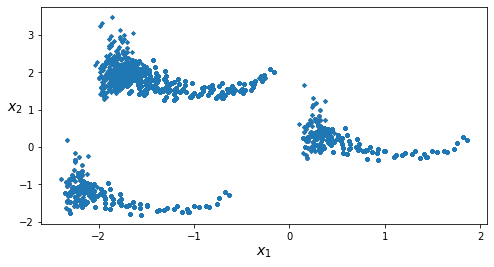

In [415]:
plt.figure(figsize=(8, 4))
plot_clusters(clusters_Y)
plt.show()

In [218]:
from sklearn.cluster import KMeans

In [409]:
k = 3
kmeans = KMeans(n_clusters=k, random_state=42)
y_pred = kmeans.fit_predict(clusters_Y)

In [410]:
y_pred

array([1, 0, 0, ..., 0, 0, 1])

In [411]:
y_pred is kmeans.labels_

True

In [405]:
kmeans.cluster_centers_

array([[ 1.168, -0.066],
       [-1.658, -1.457],
       [-1.262,  1.741]])

In [365]:
kmeans.labels_

array([1, 0, 0, ..., 0, 0, 1])

In [366]:
kmeans.predict(clusters_Y)

array([1, 0, 0, ..., 0, 0, 1])

In [367]:
def plot_data(Y):
    plt.plot(Y[:, 0], Y[:, 1], 'k.', markersize=2)

def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=110, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=10, linewidths=20,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, Y, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True,color = "white"):
    mins = Y.min(axis=0) - 0.1
    maxs = Y.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Set2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(Y)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

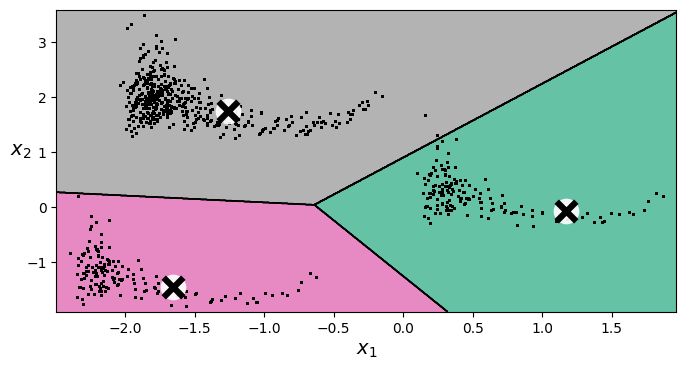

In [368]:
plt.figure(figsize=(8, 4), dpi=100)
plot_decision_boundaries(kmeans, clusters_Y)
plt.show()

## Hard Clustering vs Soft Clustering

In [369]:
kmeans.transform(clusters_Y)

array([[3.269, 0.133, 3.24 ],
       [0.596, 2.803, 2.452],
       [0.165, 3.205, 3.191],
       ...,
       [0.489, 3.57 , 3.461],
       [0.31 , 2.853, 2.828],
       [3.053, 0.195, 3.311]])

In [370]:
np.linalg.norm(np.tile(clusters_Y, (1, k)).reshape(-1, k, 2) - kmeans.cluster_centers_, axis=2)

array([[3.269, 0.133, 3.24 ],
       [0.596, 2.803, 2.452],
       [0.165, 3.205, 3.191],
       ...,
       [0.489, 3.57 , 3.461],
       [0.31 , 2.853, 2.828],
       [3.053, 0.195, 3.311]])

In [371]:
kmeans_iter1 = KMeans(n_clusters=3, init="random", n_init=1,
                     algorithm="full", max_iter=1, random_state=1)
kmeans_iter2 = KMeans(n_clusters=3, init="random", n_init=1,
                     algorithm="full", max_iter=2, random_state=1)
kmeans_iter3 = KMeans(n_clusters=3, init="random", n_init=1,
                     algorithm="full", max_iter=3, random_state=1)
kmeans_iter1.fit(clusters_Y)
kmeans_iter2.fit(clusters_Y)
kmeans_iter3.fit(clusters_Y)

KMeans(algorithm='full', init='random', max_iter=3, n_clusters=3, n_init=1,
       random_state=1)

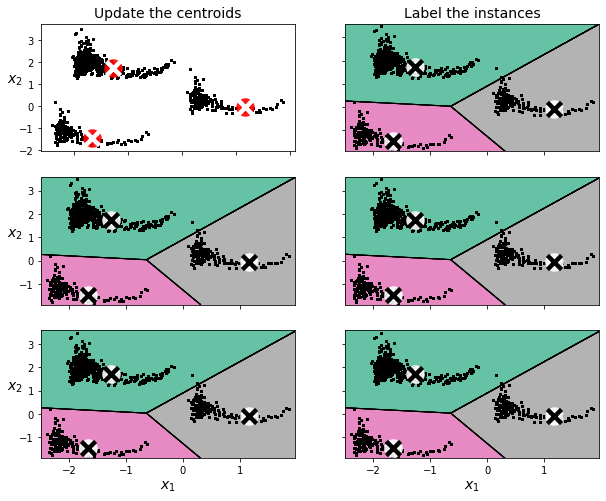

In [372]:
plt.figure(figsize=(10, 8))

plt.subplot(321)
plot_data(clusters_Y)
plot_centroids(kmeans_iter1.cluster_centers_, circle_color='r', cross_color='w')
plt.ylabel("$x_2$", fontsize=14, rotation=0)
plt.tick_params(labelbottom=False)
plt.title("Update the centroids", fontsize=14)

plt.subplot(322)
plot_decision_boundaries(kmeans_iter1, clusters_Y, show_xlabels=False, show_ylabels=False)
plt.title("Label the instances", fontsize=14)

plt.subplot(323)
plot_decision_boundaries(kmeans_iter1, clusters_Y, show_centroids=False, show_xlabels=False)
plot_centroids(kmeans_iter2.cluster_centers_)

plt.subplot(324)
plot_decision_boundaries(kmeans_iter2, clusters_Y, show_xlabels=False, show_ylabels=False)

plt.subplot(325)
plot_decision_boundaries(kmeans_iter2, clusters_Y, show_centroids=False)
plot_centroids(kmeans_iter3.cluster_centers_)

plt.subplot(326)
plot_decision_boundaries(kmeans_iter3, clusters_Y, show_ylabels=False)

plt.show()

In [373]:
def plot_clusterer_comparison(clusterer1, clusterer2,clusters_Y, title1=None, title2=None):
    clusterer1.fit(clusters_Y)
    clusterer2.fit(clusters_Y)

    plt.figure(figsize=(10, 5))

    plt.subplot(121)
    plot_decision_boundaries(clusterer1, clusters_Y)
    if title1:
        plt.title(title1, fontsize=14)

    plt.subplot(122)
    plot_decision_boundaries(clusterer2, clusters_Y, show_ylabels=False)
    if title2:
        plt.title(title2, fontsize=14)

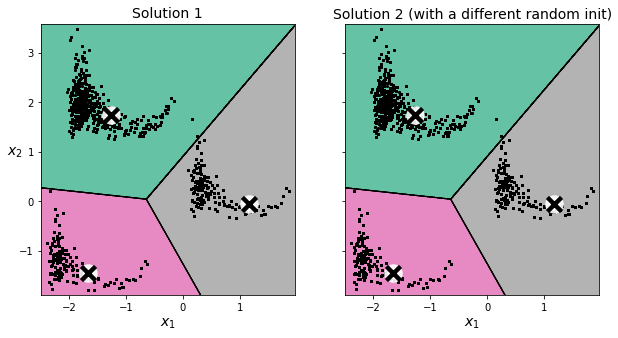

In [374]:
kmeans_rnd_init1 = KMeans(n_clusters=3, init="random", n_init=1,
                         algorithm="full", random_state=42)
kmeans_rnd_init2 = KMeans(n_clusters=3, init="random", n_init=1,
                         algorithm="full", random_state=200)

plot_clusterer_comparison(kmeans_rnd_init1, kmeans_rnd_init2, clusters_Y,
                          "Solution 1", "Solution 2 (with a different random init)")
plt.show()

### Inertia

In [375]:
kmeans.inertia_

108800.880

In [376]:
clusters_Y_dist = kmeans.transform(clusters_Y)
np.sum(clusters_Y_dist[np.arange(len(clusters_Y_dist)), kmeans.labels_]**2)

108800.87980156545

In [377]:
kmeans.score(clusters_Y)

-108800.880

### Multiple Initializations

In [378]:
kmeans_rnd_init1.inertia_

108800.880

In [379]:
kmeans_rnd_init2.inertia_

108800.880

In [416]:
kmeans_inits = KMeans(n_clusters=3, init="random", n_init=10,
                              algorithm="full", random_state=11)
kmeans_inits.fit(clusters_Y)

KMeans(algorithm='full', init='random', n_clusters=3, random_state=11)

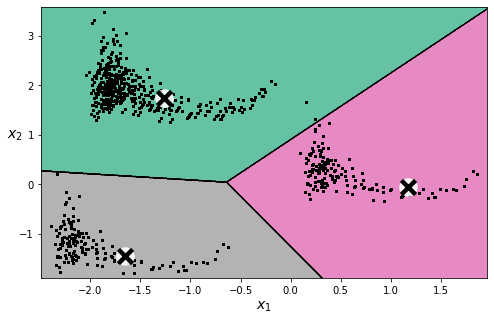

In [417]:
plt.figure(figsize=(8, 5))
plot_decision_boundaries(kmeans_inits, clusters_Y)
plt.show()

### End of Clustering Part

# Text Classification Without Natural Language Processing Techniques

# Model 1: Random Forest

In [86]:
import gensim
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
pd.set_option('display.max_colwidth', 100)

In [87]:
# We are going to use the X_train and X_test which have been split before
# X_train_text and X_test_text are equal to the 'overall_review' text in the X_train and X_test respectively
# Word2Vec from gensim is used to vectorize the text which will be the input to the Random Forest model

In [88]:
X_train_text = X_train['overall_review']
X_test_text = X_test['overall_review']

In [89]:
# Train the word2vec model
w2v_model = gensim.models.Word2Vec(X_train_text, vector_size=100, window=5, min_count=2)
#w2v_model.wv.index_to_key

In [90]:
words = set(w2v_model.wv.index_to_key )
X_train_vect = np.array([np.array([w2v_model.wv[i] for i in ls if i in words])
                         for ls in X_train_text])
X_test_vect = np.array([np.array([w2v_model.wv[i] for i in ls if i in words])
                         for ls in X_test_text])

In [91]:
# Check whether the length of the sentence is consistent with the length of the sentence vector
for i, v in enumerate(X_train_vect):
    print(len(X_train_text.iloc[i]), len(v))

32 32
54 54
19 19
57 57
70 70
36 36
257 257
135 135
84 84
239 239
96 96
167 167
240 240
176 176
37 37
68 68
22 22
98 98
59 59
136 136
316 316
229 229
22 22
17 17
613 613
122 122
69 69
101 101
102 102
257 257
95 95
414 414
45 45
66 66
54 54
325 325
83 83
116 116
40 40
36 36
30 30
157 157
420 420
118 118
331 331
99 99
353 353
379 379
36 36
90 90
147 147
88 88
86 86
102 102
108 108
391 391
41 41
57 57
109 109
612 612
59 59
377 377
74 74
693 693
406 406
129 129
86 86
184 184
65 65
72 72
268 268
160 160
70 70
100 100
38 38
72 72
121 121
86 86
47 47
79 79
155 155
621 621
40 40
28 28
217 217
172 172
456 456
245 245
118 118
44 44
169 169
439 439
104 104
238 238
162 162
15 15
56 56
315 315
70 70
28 28
44 44
62 62
224 224
53 53
73 73
83 83
116 116
169 169
238 238
65 65
42 42
84 84
203 203
94 94
115 115
239 239
36 36
53 53
111 111
90 90
44 44
251 251
206 206
234 234
408 408
57 57
261 261
164 164
246 246
118 118
365 365
49 49
216 216
41 41
27 27
668 668
267 267
160 160
465 465
829 829
122 122
129 

793 793
344 344
37 37
148 148
93 93
179 179
110 110
103 103
74 74
50 50
323 323
35 35
354 354
189 189
369 369
170 170
688 688
104 104
44 44
57 57
197 197
217 217
39 39
68 68
60 60
145 145
70 70
638 638
269 269
221 221
48 48
65 65
137 137
152 152
105 105
132 132
111 111
58 58
85 85
44 44
127 127
163 163
384 384
194 194
357 357
111 111
19 19
221 221
32 32
170 170
67 67
123 123
23 23
63 63
211 211
199 199
143 143
204 204
111 111
19 19
25 25
56 56
40 40
167 167
25 25
645 645
170 170
122 122
390 390
171 171
415 415
64 64
291 291
475 475
18 18
188 188
195 195
334 334
247 247
233 233
113 113
354 354
169 169
431 431
53 53
190 190
250 250
278 278
70 70
27 27
81 81
113 113
297 297
279 279
45 45
141 141
130 130
37 37
554 554
91 91
133 133
455 455
35 35
33 33
42 42
27 27
58 58
220 220
132 132
117 117
50 50
216 216
297 297
96 96
106 106
147 147
151 151
45 45
665 665
66 66
279 279
113 113
199 199
330 330
102 102
16 16
29 29
23 23
38 38
218 218
373 373
43 43
102 102
73 73
218 218
482 482
38 38
14 14


482 482
216 216
57 57
51 51
125 125
268 268
81 81
56 56
178 178
166 166
131 131
26 26
71 71
28 28
262 262
180 180
280 280
123 123
20 20
330 330
178 178
312 312
36 36
261 261
270 270
58 58
203 203
259 259
88 88
119 119
251 251
75 75
413 413
34 34
44 44
101 101
22 22
200 200
196 196
633 633
85 85
69 69
144 144
115 115
37 37
182 182
52 52
32 32
33 33
68 68
152 152
787 787
272 272
95 95
129 129
258 258
73 73
55 55
157 157
22 22
100 100
35 35
55 55
151 151
89 89
266 266
64 64
135 135
603 603
181 181
95 95
449 449
47 47
167 167
281 281
89 89
196 196
281 281
90 90
268 268
32 32
259 259
59 59
146 146
54 54
229 229
67 67
59 59
253 253
69 69
74 74
47 47
302 302
166 166
51 51
133 133
66 66
50 50
322 322
134 134
326 326
344 344
243 243
519 519
104 104
504 504
96 96
417 417
42 42
121 121
148 148
86 86
99 99
322 322
300 300
208 208
45 45
65 65
226 226
553 553
57 57
258 258
155 155
383 383
79 79
115 115
42 42
300 300
78 78
178 178
105 105
50 50
44 44
106 106
82 82
146 146
95 95
45 45
13 13
35 35
344 

351 351
306 306
372 372
119 119
473 473
61 61
66 66
60 60
540 540
304 304
344 344
421 421
27 27
28 28
50 50
260 260
26 26
117 117
108 108
135 135
16 16
57 57
43 43
306 306
89 89
68 68
87 87
79 79
141 141
181 181
34 34
121 121
518 518
366 366
50 50
45 45
470 470
363 363
41 41
107 107
30 30
244 244
103 103
300 300
110 110
174 174
64 64
40 40
17 17
212 212
53 53
65 65
69 69
61 61
107 107
167 167
64 64
506 506
209 209
58 58
33 33
62 62
57 57
241 241
514 514
59 59
29 29
49 49
109 109
206 206
68 68
67 67
10 10
251 251
63 63
75 75
405 405
105 105
29 29
35 35
326 326
108 108
363 363
235 235
51 51
53 53
92 92
86 86
309 309
455 455
25 25
521 521
299 299
217 217
560 560
441 441
47 47
91 91
156 156
36 36
58 58
168 168
23 23
61 61
457 457
97 97
615 615
34 34
12 12
136 136
35 35
335 335
30 30
109 109
322 322
282 282
362 362
135 135
452 452
80 80
126 126
39 39
17 17
157 157
149 149
60 60
122 122
138 138
67 67
53 53
87 87
582 582
116 116
19 19
88 88
116 116
211 211
89 89
296 296
145 145
171 171
44 44


574 574
27 27
401 401
47 47
43 43
30 30
332 332
511 511
88 88
62 62
529 529
132 132
49 49
237 237
135 135
79 79
62 62
81 81
97 97
200 200
113 113
175 175
164 164
28 28
220 220
53 53
45 45
33 33
138 138
42 42
16 16
185 185
152 152
300 300
87 87
47 47
67 67
79 79
44 44
47 47
95 95
130 130
17 17
190 190
130 130
137 137
126 126
292 292
325 325
76 76
60 60
90 90
250 250
88 88
74 74
83 83
109 109
463 461
20 20
53 53
311 311
53 53
157 157
31 31
258 258
366 366
249 249
158 158
120 120
165 165
63 63
468 468
371 371
37 37
525 525
619 619
152 152
160 160
205 205
158 156
117 117
330 330
142 142
39 39
82 82
124 124
14 14
610 610
390 390
30 30
562 562
405 405
188 188
176 176
319 319
275 275
265 265
385 385
182 182
108 108
250 250
152 152
454 454
216 216
89 89
63 63
260 260
212 212
96 96
220 220
194 194
165 165
442 442
29 29
627 627
530 530
205 205
38 38
187 187
93 93
142 142
67 67
92 92
57 57
472 472
82 82
77 77
81 81
56 56
63 63
81 81
108 108
128 128
106 106
95 95
205 205
207 207
230 230
114 114
59

125 125
211 211
124 124
324 324
152 152
107 107
82 82
50 50
48 48
29 29
106 106
326 326
444 444
376 376
32 32
127 127
194 194
44 44
37 37
41 41
281 281
107 107
51 51
260 260
45 45
20 20
22 22
120 120
227 227
295 295
53 53
39 39
27 27
79 79
94 94
41 41
231 231
50 50
528 528
27 27
64 64
150 150
116 116
449 449
182 182
62 62
100 100
49 49
43 43
55 55
33 33
107 107
130 130
74 74
555 555
245 245
108 108
316 316
142 142
12 12
25 25
48 48
155 155
97 97
222 222
100 100
428 428
108 108
211 211
708 708
98 98
169 169
113 113
229 229
106 106
92 92
74 74
350 350
85 85
129 129
247 247
43 43
118 118
141 141
359 359
62 62
210 210
475 475
71 71
129 129
113 113
61 61
488 488
56 56
106 106
96 96
462 462
149 149
579 579
60 60
297 297
225 225
47 47
78 78
44 44
38 38
45 45
96 96
735 735
145 145
967 967
122 122
252 252
166 166
467 467
247 247
59 59
838 838
210 210
87 87
68 68
57 57
238 238
193 193
77 77
238 238
66 66
625 624
36 36
64 64
75 75
62 62
76 76
31 31
203 203
295 295
436 436
198 198
144 144
47 47
23

164 164
381 381
19 19
150 150
103 103
104 104
51 51
73 73
238 238
193 193
36 36
80 80
714 714
27 27
36 36
94 94
239 239
13 13
39 39
63 63
115 115
52 52
50 50
95 95
267 267
23 23
202 202
450 450
422 422
314 314
59 59
59 59
177 177
87 87
486 486
273 273
362 362
446 446
48 48
17 17
24 24
162 162
209 209
255 255
70 70
193 193
364 364
103 103
74 74
282 282
19 19
883 883
301 301
70 70
41 41
53 53
481 481
269 269
390 390
126 126
85 85
591 591
38 38
26 26
129 129
91 91
31 31
72 72
541 541
172 172
27 27
327 327
69 69
134 134
351 351
415 415
29 29
191 191
74 74
143 143
200 200
402 402
216 216
89 89
176 176
186 186
315 315
59 59
817 817
133 133
298 298
173 173
28 28
37 37
261 261
179 179
53 53
298 298
73 73
264 264
138 138
95 95
624 624
60 60
80 80
142 142
28 28
20 20
402 402
46 46
34 34
187 187
60 60
87 87
121 121
49 49
80 80
429 429
253 253
236 236
136 136
117 117
476 476
23 23
40 40
290 290
354 354
16 16
51 51
62 62
134 134
532 532
101 101
72 72
273 273
270 270
74 74
404 404
210 210
159 159
14

108 108
75 75
25 25
162 162
100 100
255 255
48 48
78 78
170 170
223 223
240 240
45 45
66 66
24 24
152 152
276 276
181 181
58 58
194 194
264 264
56 56
300 300
35 35
153 153
107 107
336 336
157 157
166 166
353 353
206 206
74 74
283 283
28 28
44 44
236 236
52 52
78 78
107 107
35 35
520 520
485 485
406 406
187 187
57 57
86 86
283 283
15 15
63 63
132 132
59 59
105 105
214 214
81 81
119 119
38 38
180 180
42 42
236 236
303 303
234 234
36 36
102 102
370 370
175 175
553 553
28 28
169 169
196 196
73 73
246 246
125 125
77 77
38 38
222 222
91 91
37 37
312 312
446 446
79 79
79 79
303 303
74 74
104 104
35 35
166 166
89 89
403 397
15 15
104 104
44 44
423 423
24 24
214 214
73 73
28 28
38 38
63 63
53 53
121 121
130 130
106 106
107 107
80 80
146 146
91 91
29 29
26 26
98 98
12 12
450 450
30 30
68 68
213 213
57 57
61 61
137 137
215 215
149 149
11 11
100 100
49 49
354 354
222 222
97 97
24 24
76 76
140 140
56 56
86 86
230 230
50 50
28 28
161 161
37 37
92 92
47 47
188 188
142 142
135 135
193 193
147 147
108 

544 544
62 62
111 111
117 117
438 438
38 38
80 80
329 329
317 317
57 57
96 96
95 95
91 91
41 41
53 53
121 121
135 135
210 210
18 18
299 299
142 142
189 189
198 198
53 53
389 389
317 317
90 90
64 64
41 41
142 142
275 275
167 167
104 104
172 172
67 67
143 143
52 52
419 419
183 183
68 68
109 109
501 501
200 200
79 79
42 42
245 245
344 344
67 67
252 252
41 41
76 76
253 253
119 119
239 239
739 739
15 15
109 109
104 104
23 23
163 163
176 176
20 20
35 35
157 157
37 37
224 224
271 271
51 51
55 55
57 57
122 122
38 38
155 155
218 218
111 111
205 205
180 180
60 60
225 225
74 74
330 330
247 247
15 15
58 58
104 104
289 289
164 164
192 192
257 257
257 257
172 172
110 110
35 35
390 390
243 243
317 317
37 37
92 92
202 202
109 109
350 350
726 726
148 148
27 27
128 128
61 61
57 57
54 54
175 175
91 91
102 102
89 89
222 222
343 343
127 127
312 312
198 198
45 45
43 43
204 204
51 51
470 470
484 484
125 125
282 282
86 86
202 202
206 206
146 146
131 131
344 344
64 64
168 168
134 134
114 114
107 107
298 298
51

65 65
231 231
393 393
135 135
39 39
43 43
111 111
78 78
175 175
127 127
50 50
358 358
671 671
31 31
46 46
166 166
301 301
152 152
89 89
18 18
141 141
58 58
111 111
48 48
147 147
262 262
54 54
100 100
68 68
470 470
429 429
170 170
248 248
379 379
79 79
72 72
87 87
32 32
46 46
126 126
134 134
219 219
168 168
105 105
56 56
85 85
42 42
692 692
34 34
61 61
50 50
77 77
128 128
136 136
253 253
637 637
65 65
87 87
263 263
70 70
202 202
42 42
27 27
203 203
478 478
189 189
86 86
186 186
154 154
106 106
231 231
8 8
62 62
110 110
203 203
410 410
433 433
78 78
237 237
98 98
407 407
462 462
108 108
41 41
81 81
174 174
84 84
41 41
78 78
75 75
23 23
60 60
99 99
40 40
74 74
176 176
261 261
667 667
250 250
223 223
72 72
310 310
98 98
375 375
282 282
218 218
32 32
245 245
71 71
76 76
112 112
69 69
24 24
210 210
138 138
582 582
83 83
489 489
103 103
241 241
98 98
232 232
40 40
110 110
126 126
228 228
100 100
32 32
63 63
23 23
155 155
143 143
77 77
165 165
354 354
107 107
62 62
24 24
54 54
25 25
140 140
65

399 399
391 391
96 96
77 77
157 157
74 74
108 108
397 397
584 584
572 572
118 118
22 22
38 38
23 23
197 197
55 55
55 55
354 354
125 125
12 12
147 147
156 156
146 146
113 113
72 72
57 57
320 320
105 105
44 44
151 151
100 100
253 253
39 39
41 41
62 62
115 115
25 25
26 26
49 49
203 203
144 144
109 109
41 41
272 272
87 87
16 16
871 871
20 20
121 121
503 503
36 36
39 39
762 762
36 36
260 260
95 93
125 125
26 26
180 180
59 59
175 175
315 315
126 126
52 52
64 64
243 243
14 14
236 236
128 128
163 163
85 85
370 370
82 82
51 51
333 333
484 484
134 134
183 183
33 33
48 48
13 13
198 198
86 86
39 39
43 43
45 45
402 402
270 270
73 73
168 168
79 79
101 101
317 317
63 63
311 311
20 20
582 582
405 405
158 158
153 153
90 90
649 649
79 79
250 250
22 22
122 122
640 640
56 56
86 86
672 672
153 153
328 328
170 170
158 158
43 43
84 84
596 596
184 184
57 57
307 307
126 126
81 81
147 147
98 98
62 62
148 148
225 225
13 13
258 258
103 103
161 161
456 456
251 251
172 172
51 51
57 57
253 253
160 160
425 425
162 16

33 33
36 36
125 125
249 249
79 79
753 753
195 195
86 86
195 195
103 103
30 30
219 219
62 62
63 63
130 130
503 503
104 104
29 29
39 39
301 301
38 38
41 41
261 261
112 112
122 122
80 80
163 163
73 73
421 421
86 86
44 44
247 247
20 20
112 112
247 247
346 346
258 258
203 203
274 274
507 507
19 19
435 435
22 22
364 364
90 90
43 43
22 22
45 45
32 32
343 343
331 331
127 127
171 171
34 34
75 75
122 122
110 110
30 30
151 151
187 187
101 101
193 193
413 413
142 142
41 41
36 36
32 32
142 142
35 35
145 145
112 112
125 125
55 55
335 335
77 77
101 101
47 47
35 35
93 93
290 290
365 365
118 118
200 200
64 64
181 181
733 733
177 177
380 379
30 30
244 244
453 453
35 35
122 122
185 185
24 24
63 63
360 360
61 61
181 181
99 99
716 716
155 155
183 183
468 468
172 172
56 56
18 18
232 232
531 531
51 51
234 234
55 55
188 188
124 124
137 137
323 323
74 74
189 189
610 610
465 465
258 258
237 237
36 36
144 144
236 236
77 77
332 332
663 663
49 49
47 47
35 35
107 107
89 89
155 155
598 598
87 87
63 63
72 72
367 367


231 231
146 146
72 72
65 65
400 400
47 47
46 46
48 48
90 90
60 60
25 25
292 292
203 203
151 151
113 113
141 141
72 72
41 41
50 50
322 322
46 46
315 315
106 106
672 672
35 35
48 48
54 54
38 38
23 23
117 117
172 172
75 75
270 270
58 58
168 168
176 176
222 222
19 19
54 54
30 30
252 252
81 81
544 544
128 128
22 22
36 36
118 118
99 99
129 129
182 182
60 60
141 141
129 129
22 22
252 252
117 117
414 414
42 42
12 12
93 93
212 212
33 33
762 762
551 551
103 103
104 104
215 215
411 411
132 132
482 482
302 302
35 35
87 87
527 527
202 202
58 58
138 138
162 162
104 104
13 13
115 115
85 85
358 358
231 231
63 63
77 77
79 79
68 68
129 129
42 42
344 344
164 164
300 300
318 318
213 213
197 197
413 413
28 28
71 71
349 349
128 128
130 130
272 272
67 67
212 212
209 209
70 70
113 113
198 198
22 22
65 65
127 127
178 178
63 63
23 23
215 215
400 400
379 379
120 120
182 182
73 73
33 33
322 322
30 30
151 151
118 118
396 396
58 58
113 113
64 64
46 46
56 56
97 97
117 117
122 122
631 631
69 69
238 238
20 20
110 110


172 172
29 29
169 169
31 31
95 95
862 862
192 192
64 64
161 161
439 439
43 43
62 62
101 101
64 64
253 253
29 29
161 161
207 207
414 414
235 235
53 53
125 125
28 28
117 117
31 31
215 215
409 409
281 281
51 51
514 514
103 103
131 131
236 236
43 43
20 20
121 121
38 38
67 67
100 100
75 75
105 105
34 34
81 81
134 134
582 582
74 74
79 79
161 161
338 338
40 40
42 42
20 20
119 119
148 148
393 393
202 202
181 181
74 74
139 139
92 92
74 74
31 31
89 89
297 297
90 90
84 84
110 110
59 59
203 203
31 31
130 130
262 262
301 301
232 232
289 289
51 51
17 17
158 158
262 262
41 41
217 217
304 304
354 354
71 71
64 64
333 333
25 25
48 48
294 294
91 91
56 56
103 103
127 127
127 127
358 358
111 111
207 207
105 105
68 68
127 127
184 184
58 58
106 106
42 42
58 58
129 129
87 87
390 390
276 276
264 264
696 696
189 189
89 89
347 347
381 381
749 749
156 156
299 299
48 48
155 155
91 91
303 303
106 106
38 38
47 47
58 58
185 185
262 262
196 196
138 138
640 640
45 45
157 157
140 140
123 123
174 174
71 71
250 250
89 89


301 301
141 141
107 107
55 55
245 245
313 313
374 374
120 120
52 52
63 63
37 37
40 40
102 102
411 411
342 340
61 61
121 121
122 122
296 296
79 79
769 769
8 8
162 162
82 82
153 153
80 80
63 63
123 123
79 79
63 63
318 318
97 97
34 34
33 33
223 223
49 49
108 108
31 31
34 34
121 121
76 76
175 175
102 102
35 35
34 34
28 28
83 83
139 139
53 53
59 59
230 230
164 164
116 116
98 98
407 407
92 92
87 87
115 115
525 525
530 530
121 121
165 165
239 239
60 60
20 20
103 103
171 171
56 56
193 193
348 348
714 714
68 68
405 405
98 98
107 107
45 45
176 176
308 308
143 143
103 103
47 47
125 125
433 433
144 144
84 84
137 137
415 415
64 64
52 52
65 65
91 91
124 124
52 52
72 72
207 207
228 228
397 397
31 31
337 337
355 355
192 192
60 60
57 57
132 132
174 174
178 178
45 45
398 398
108 108
156 156
48 48
94 94
237 237
26 26
88 88
195 195
65 65
454 454
304 304
47 47
97 97
37 37
62 62
115 115
115 115
83 83
118 118
87 87
929 929
337 337
387 387
129 129
48 48
71 71
39 39
768 768
79 79
115 115
172 172
475 475
111 11

33 33
316 316
187 187
61 61
139 139
270 270
134 134
236 236
275 275
168 168
94 94
61 61
62 62
45 45
65 65
113 113
324 324
288 288
178 178
242 242
173 173
167 167
28 28
95 95
57 57
56 56
142 142
139 139
241 241
50 50
79 79
73 73
351 351
60 60
465 465
90 90
598 598
230 230
161 161
73 73
335 335
73 73
94 94
454 454
54 54
41 41
70 70
133 133
56 56
344 344
211 211
363 363
109 109
55 55
150 150
108 108
276 276
315 315
130 130
43 43
260 260
41 41
107 107
109 109
13 13
332 332
183 183
84 84
252 252
87 87
176 176
156 156
57 57
15 15
74 74
364 364
139 139
31 31
75 75
26 26
38 38
270 270
25 25
313 313
53 53
12 12
229 229
138 138
315 315
141 141
333 333
159 159
180 180
55 55
34 34
36 36
125 125
90 90
224 224
538 538
150 150
344 344
152 152
260 260
20 20
340 340
71 71
29 29
151 151
343 343
87 87
398 398
31 31
108 108
173 173
78 78
30 30
151 151
175 175
92 92
461 461
199 199
147 147
160 160
39 39
48 48
58 58
49 49
742 742
72 72
183 183
197 197
338 338
39 39
28 28
91 91
84 84
104 104
218 218
232 232


212 212
174 174
218 218
304 304
241 241
53 53
48 48
66 66
108 108
352 352
33 33
51 51
238 238
144 144
46 46
128 128
121 121
103 103
33 33
175 175
137 137
194 194
76 76
20 20
124 124
139 139
124 124
92 92
201 201
120 120
70 70
301 301
98 98
238 238
55 55
71 71
303 303
32 32
76 76
162 162
84 84
471 471
53 53
35 35
756 756
97 97
173 173
389 389
129 129
161 161
41 41
20 20
191 191
119 119
44 44
158 158
101 101
190 190
52 52
128 128
42 42
40 40
41 41
258 258
44 44
45 45
53 53
168 168
177 177
31 31
269 269
55 55
72 72
357 357
21 21
551 551
207 207
458 458
127 127
47 47
254 254
381 381
100 100
52 52
104 104
53 53
92 92
42 42
38 38
114 114
98 98
353 353
53 53
31 31
205 205
159 159
198 198
96 96
223 223
65 65
26 26
43 43
294 294
158 158
150 150
229 229
58 58
52 52
110 110
73 73
37 37
25 25
92 92
45 45
126 126
98 98
123 123
88 88
412 412
157 157
150 150
372 372
179 179
185 185
40 40
54 54
69 69
104 104
127 127
52 52
24 24
79 79
23 23
86 86
56 56
318 318
12 12
497 497
245 245
386 386
263 263
111 

57 57
106 106
113 113
425 425
361 361
276 276
182 182
59 59
28 28
148 148
697 697
270 270
94 94
296 296
139 139
410 410
131 131
28 28
95 95
347 347
126 126
136 136
153 153
79 79
30 30
24 24
220 220
66 66
151 151
68 68
35 35
131 131
52 52
130 130
25 25
348 348
104 104
75 75
77 77
236 236
236 236
136 136
23 23
214 214
124 124
48 48
195 195
33 33
311 311
394 394
86 86
237 237
35 35
41 41
113 113
20 20
101 101
85 85
290 290
360 360
140 140
198 198
142 142
154 154
183 183
133 133
40 40
37 37
32 32
179 179
236 236
32 32
105 105
232 232
71 71
112 112
95 95
48 48
252 252
270 270
165 165
491 491
597 597
312 312
414 414
77 77
260 260
35 35
69 69
325 325
211 211
50 50
39 39
45 45
104 104
210 210
340 340
399 399
187 187
114 114
73 73
42 42
264 264
298 298
10 10
205 205
125 125
393 393
67 67
154 154
215 215
218 218
295 295
296 296
186 186
122 122
337 337
122 122
134 134
273 273
231 231
356 356
132 132
203 203
319 319
124 124
356 356
209 209
406 406
56 56
22 22
89 89
171 171
531 531
58 58
34 34
23 2

893 893
65 65
175 175
163 163
43 43
78 78
32 32
610 610
98 98
34 34
127 127
41 41
26 26
330 330
53 53
40 40
54 54
142 142
173 173
238 238
124 124
140 140
774 774
164 164
161 161
51 51
113 113
258 258
363 363
483 483
85 85
330 330
138 138
135 135
75 75
97 97
42 42
111 111
282 282
92 92
95 95
100 100
284 284
13 13
55 55
574 574
145 145
31 31
253 253
778 778
23 23
23 23
58 58
75 75
88 88
429 429
46 46
294 294
34 34
359 359
21 21
479 479
49 49
149 149
67 67
463 463
85 85
86 86
107 107
209 209
84 84
109 109
78 78
210 210
49 49
171 171
21 21
276 276
88 88
58 58
27 27
656 656
82 82
291 291
524 524
247 247
39 39
51 51
27 27
40 40
204 204
226 226
118 118
112 112
43 43
228 228
97 97
120 120
101 101
255 255
193 193
491 491
33 33
292 292
151 151
18 18
124 124
33 33
31 31
46 46
152 152
35 35
316 316
78 78
115 115
111 111
143 143
335 335
88 88
75 75
449 449
33 33
78 78
39 39
27 27
52 52
43 43
356 356
102 102
61 61
65 65
88 88
63 63
175 175
74 74
199 199
309 309
234 234
91 91
98 98
366 366
267 267
79

519 519
38 38
429 429
48 48
220 220
116 116
500 500
159 159
36 36
174 174
138 138
299 299
211 211
80 80
22 22
168 168
68 68
191 191
179 179
53 53
118 118
47 47
198 198
362 362
253 253
52 52
123 123
193 193
498 498
216 216
74 74
72 72
405 405
429 429
302 302
131 131
773 773
204 204
170 170
31 31
66 66
283 283
73 73
112 112
58 58
41 41
213 213
85 85
552 552
95 95
84 84
148 148
341 341
95 95
33 33
120 120
336 336
70 70
113 113
47 47
59 59
111 111
267 267
39 39
105 105
227 227
42 42
113 113
334 334
75 75
106 106
463 463
187 187
68 68
449 449
30 30
32 32
52 52
247 247
225 225
46 46
408 408
23 23
39 39
116 116
71 71
223 223
143 143
179 179
233 233
293 293
341 341
407 407
105 105
225 225
250 250
109 109
27 27
306 306
205 205
69 69
99 99
101 101
342 342
92 92
274 274
92 92
311 311
42 42
45 45
71 71
97 97
178 178
483 483
73 73
121 121
7 7
45 45
43 43
25 25
510 510
105 105
46 46
135 135
49 49
334 334
509 509
28 28
337 337
270 270
189 189
255 255
39 39
134 134
61 61
163 163
110 110
70 70
112 112


348 348
416 416
151 151
108 108
98 98
377 377
78 78
96 96
96 96
382 382
189 189
97 97
340 340
325 325
183 182
105 105
228 228
407 407
107 107
73 73
48 48
53 53
54 54
254 254
37 37
769 769
366 366
31 31
154 154
36 36
178 178
26 26
37 37
304 304
24 24
227 227
31 31
88 88
73 73
60 60
275 275
466 466
373 373
103 103
120 120
82 82
49 49
245 245
722 722
217 217
45 45
436 436
110 110
44 44
176 176
78 78
50 50
125 125
58 58
176 176
151 151
140 140
330 330
60 60
111 111
201 201
658 658
76 76
158 158
112 112
54 54
228 228
103 103
115 115
592 592
49 49
22 22
381 381
86 86
384 384
112 112
134 134
165 165
74 74
33 33
145 145
15 15
101 101
33 33
71 71
66 66
376 376
100 100
417 417
39 39
423 423
69 69
26 26
496 496
184 184
25 25
29 29
119 119
53 53
444 444
121 121
235 235
86 86
188 188
207 207
733 733
13 13
510 510
86 86
94 94
31 31
215 215
385 385
19 19
37 37
566 566
204 204
58 58
36 36
180 180
71 71
314 314
159 159
581 581
152 152
240 240
41 41
135 135
438 438
27 27
59 59
80 80
30 30
125 125
164 16

19 19
136 136
49 49
504 504
23 23
123 123
115 115
463 463
105 105
187 187
274 274
52 52
223 223
399 399
77 77
150 150
79 79
34 34
431 431
148 148
80 80
46 46
417 417
204 204
322 322
133 133
149 149
242 242
143 143
40 40
21 21
63 63
320 320
99 99
189 189
91 91
97 97
244 244
124 124
393 393
174 174
208 208
416 416
59 59
187 187
204 204
507 507
293 293
465 465
57 57
45 45
42 42
107 107
104 104
151 151
44 44
62 62
168 168
109 109
60 60
146 146
95 95
18 18
153 153
111 111
27 27
127 127
397 397
196 196
359 359
219 219
668 668
278 278
194 194
46 46
678 678
470 470
67 67
112 112
20 20
236 236
18 18
455 455
163 163
336 336
134 134
543 543
96 96
294 294
349 349
68 68
52 52
285 285
135 135
46 46
236 236
57 57
276 276
179 179
101 101
92 92
305 305
112 112
149 149
64 64
194 194
113 113
199 199
104 104
152 152
243 243
55 55
65 65
372 372
233 233
140 140
43 43
104 104
128 128
478 478
133 133
170 170
162 162
69 69
79 79
49 49
64 64
329 329
113 113
341 341
183 183
42 42
69 69
31 31
42 42
27 27
18 18
64

In [92]:
# Compute sentence vectors by averaging the word vectors for the words contained in the sentence
X_train_vect_avg = []
for v in X_train_vect:
    if v.size:
        X_train_vect_avg.append(v.mean(axis=0))
    else:
        X_train_vect_avg.append(np.zeros(100, dtype=float))
        
X_test_vect_avg = []
for v in X_test_vect:
    if v.size:
        X_test_vect_avg.append(v.mean(axis=0))
    else:
        X_test_vect_avg.append(np.zeros(100, dtype=float))

In [93]:
# Check whether the length of the sentence is consistent with the length of the sentence vector after averaging
for i, v in enumerate(X_train_vect_avg):
    print(len(X_train_text.iloc[i]), len(v))

32 100
54 100
19 100
57 100
70 100
36 100
257 100
135 100
84 100
239 100
96 100
167 100
240 100
176 100
37 100
68 100
22 100
98 100
59 100
136 100
316 100
229 100
22 100
17 100
613 100
122 100
69 100
101 100
102 100
257 100
95 100
414 100
45 100
66 100
54 100
325 100
83 100
116 100
40 100
36 100
30 100
157 100
420 100
118 100
331 100
99 100
353 100
379 100
36 100
90 100
147 100
88 100
86 100
102 100
108 100
391 100
41 100
57 100
109 100
612 100
59 100
377 100
74 100
693 100
406 100
129 100
86 100
184 100
65 100
72 100
268 100
160 100
70 100
100 100
38 100
72 100
121 100
86 100
47 100
79 100
155 100
621 100
40 100
28 100
217 100
172 100
456 100
245 100
118 100
44 100
169 100
439 100
104 100
238 100
162 100
15 100
56 100
315 100
70 100
28 100
44 100
62 100
224 100
53 100
73 100
83 100
116 100
169 100
238 100
65 100
42 100
84 100
203 100
94 100
115 100
239 100
36 100
53 100
111 100
90 100
44 100
251 100
206 100
234 100
408 100
57 100
261 100
164 100
246 100
118 100
365 100
49 100
216 100


140 100
45 100
45 100
188 100
98 100
75 100
544 100
222 100
178 100
112 100
216 100
237 100
245 100
714 100
239 100
105 100
19 100
86 100
40 100
55 100
29 100
116 100
38 100
444 100
36 100
56 100
104 100
107 100
139 100
74 100
128 100
163 100
69 100
20 100
83 100
36 100
578 100
453 100
48 100
179 100
206 100
23 100
69 100
111 100
343 100
716 100
123 100
56 100
442 100
166 100
65 100
94 100
420 100
34 100
400 100
322 100
116 100
87 100
318 100
92 100
78 100
796 100
22 100
28 100
285 100
320 100
95 100
96 100
67 100
466 100
365 100
159 100
760 100
630 100
36 100
104 100
365 100
590 100
50 100
318 100
298 100
87 100
367 100
480 100
35 100
123 100
238 100
167 100
47 100
263 100
436 100
53 100
401 100
315 100
142 100
77 100
113 100
41 100
28 100
388 100
321 100
53 100
126 100
61 100
179 100
223 100
114 100
13 100
37 100
205 100
80 100
99 100
25 100
37 100
284 100
764 100
325 100
731 100
65 100
101 100
214 100
108 100
32 100
326 100
73 100
215 100
131 100
408 100
135 100
185 100
185 100
108 

603 100
71 100
261 100
57 100
42 100
191 100
27 100
200 100
204 100
32 100
134 100
119 100
38 100
237 100
313 100
157 100
21 100
241 100
121 100
133 100
48 100
400 100
46 100
63 100
109 100
23 100
255 100
228 100
241 100
108 100
262 100
110 100
14 100
65 100
145 100
65 100
182 100
134 100
121 100
185 100
164 100
193 100
172 100
753 100
201 100
37 100
32 100
64 100
202 100
260 100
344 100
43 100
249 100
36 100
410 100
212 100
64 100
216 100
56 100
734 100
228 100
77 100
88 100
119 100
29 100
64 100
371 100
121 100
101 100
57 100
535 100
31 100
336 100
24 100
234 100
43 100
61 100
109 100
35 100
29 100
56 100
64 100
662 100
456 100
831 100
338 100
366 100
169 100
33 100
53 100
249 100
98 100
46 100
65 100
144 100
42 100
98 100
161 100
161 100
8 100
218 100
99 100
143 100
57 100
190 100
315 100
544 100
41 100
403 100
127 100
54 100
564 100
109 100
51 100
70 100
377 100
91 100
177 100
134 100
214 100
93 100
133 100
175 100
81 100
52 100
584 100
49 100
364 100
211 100
231 100
22 100
478 100

273 100
465 100
559 100
93 100
163 100
185 100
595 100
59 100
197 100
62 100
46 100
341 100
41 100
423 100
309 100
46 100
140 100
30 100
89 100
126 100
387 100
87 100
27 100
282 100
222 100
73 100
53 100
302 100
257 100
155 100
30 100
170 100
88 100
186 100
610 100
80 100
177 100
130 100
65 100
87 100
205 100
124 100
241 100
36 100
37 100
130 100
181 100
30 100
236 100
148 100
64 100
84 100
74 100
90 100
61 100
237 100
60 100
361 100
162 100
129 100
66 100
111 100
61 100
366 100
25 100
8 100
121 100
263 100
188 100
163 100
134 100
64 100
88 100
43 100
316 100
313 100
66 100
140 100
174 100
215 100
46 100
325 100
116 100
77 100
208 100
337 100
349 100
355 100
108 100
130 100
161 100
443 100
154 100
257 100
190 100
349 100
295 100
264 100
122 100
95 100
238 100
48 100
31 100
96 100
37 100
189 100
52 100
18 100
109 100
201 100
698 100
57 100
255 100
33 100
481 100
134 100
570 100
194 100
81 100
58 100
59 100
347 100
44 100
258 100
366 100
88 100
86 100
149 100
202 100
310 100
134 100
43 1

53 100
190 100
250 100
278 100
70 100
27 100
81 100
113 100
297 100
279 100
45 100
141 100
130 100
37 100
554 100
91 100
133 100
455 100
35 100
33 100
42 100
27 100
58 100
220 100
132 100
117 100
50 100
216 100
297 100
96 100
106 100
147 100
151 100
45 100
665 100
66 100
279 100
113 100
199 100
330 100
102 100
16 100
29 100
23 100
38 100
218 100
373 100
43 100
102 100
73 100
218 100
482 100
38 100
14 100
85 100
53 100
135 100
270 100
38 100
102 100
32 100
127 100
43 100
60 100
10 100
149 100
168 100
290 100
504 100
251 100
203 100
153 100
39 100
78 100
106 100
224 100
475 100
401 100
57 100
44 100
257 100
63 100
39 100
299 100
232 100
62 100
43 100
264 100
145 100
90 100
233 100
79 100
611 100
184 100
74 100
31 100
157 100
125 100
127 100
34 100
57 100
91 100
135 100
267 100
355 100
74 100
109 100
42 100
79 100
172 100
199 100
46 100
136 100
49 100
150 100
170 100
261 100
54 100
402 100
110 100
99 100
305 100
131 100
158 100
19 100
278 100
164 100
31 100
77 100
233 100
50 100
122 100
2

249 100
177 100
46 100
27 100
23 100
53 100
145 100
133 100
267 100
235 100
45 100
349 100
145 100
107 100
148 100
305 100
46 100
221 100
76 100
121 100
185 100
170 100
44 100
199 100
207 100
124 100
126 100
117 100
95 100
51 100
154 100
49 100
457 100
178 100
156 100
281 100
244 100
168 100
55 100
108 100
143 100
209 100
122 100
127 100
273 100
48 100
489 100
22 100
71 100
615 100
28 100
105 100
48 100
73 100
443 100
659 100
187 100
48 100
481 100
244 100
113 100
45 100
547 100
555 100
406 100
129 100
26 100
26 100
52 100
111 100
67 100
40 100
124 100
47 100
79 100
83 100
248 100
540 100
233 100
251 100
103 100
66 100
144 100
23 100
20 100
293 100
71 100
265 100
179 100
40 100
67 100
221 100
276 100
120 100
39 100
84 100
16 100
74 100
106 100
167 100
161 100
117 100
55 100
201 100
321 100
23 100
29 100
207 100
190 100
22 100
84 100
415 100
64 100
283 100
58 100
18 100
62 100
331 100
417 100
308 100
709 100
256 100
84 100
71 100
504 100
197 100
64 100
260 100
54 100
135 100
80 100
93 1

46 100
119 100
31 100
257 100
618 100
88 100
475 100
265 100
77 100
625 100
22 100
122 100
54 100
226 100
67 100
100 100
265 100
240 100
58 100
39 100
119 100
143 100
35 100
63 100
103 100
185 100
176 100
38 100
227 100
130 100
59 100
76 100
185 100
26 100
238 100
200 100
10 100
337 100
58 100
146 100
233 100
91 100
78 100
142 100
237 100
69 100
138 100
127 100
83 100
36 100
182 100
37 100
122 100
30 100
349 100
128 100
317 100
153 100
71 100
78 100
66 100
557 100
47 100
547 100
487 100
432 100
98 100
95 100
350 100
13 100
111 100
40 100
54 100
110 100
66 100
93 100
49 100
370 100
122 100
88 100
117 100
688 100
111 100
68 100
154 100
90 100
260 100
129 100
81 100
53 100
46 100
59 100
88 100
51 100
79 100
180 100
108 100
180 100
106 100
37 100
63 100
40 100
41 100
508 100
41 100
134 100
28 100
28 100
195 100
125 100
214 100
439 100
122 100
534 100
41 100
76 100
101 100
40 100
335 100
252 100
220 100
37 100
246 100
129 100
464 100
64 100
75 100
474 100
92 100
237 100
282 100
39 100
143 1

318 100
281 100
189 100
826 100
130 100
143 100
45 100
233 100
102 100
225 100
84 100
46 100
138 100
62 100
35 100
178 100
262 100
35 100
164 100
60 100
49 100
158 100
57 100
471 100
537 100
178 100
22 100
70 100
501 100
73 100
65 100
72 100
46 100
288 100
59 100
52 100
55 100
170 100
195 100
27 100
17 100
98 100
41 100
151 100
268 100
229 100
100 100
55 100
75 100
85 100
381 100
391 100
106 100
242 100
57 100
21 100
55 100
60 100
31 100
378 100
17 100
157 100
39 100
64 100
16 100
69 100
40 100
25 100
479 100
212 100
295 100
59 100
716 100
103 100
157 100
170 100
99 100
166 100
577 100
355 100
30 100
172 100
192 100
622 100
17 100
70 100
145 100
21 100
37 100
328 100
114 100
140 100
71 100
531 100
735 100
12 100
630 100
190 100
186 100
286 100
627 100
40 100
649 100
92 100
96 100
67 100
70 100
117 100
133 100
95 100
194 100
340 100
148 100
70 100
373 100
586 100
75 100
111 100
84 100
127 100
100 100
51 100
154 100
183 100
170 100
101 100
87 100
44 100
95 100
146 100
38 100
125 100
349 

465 100
56 100
102 100
408 100
730 100
27 100
32 100
92 100
184 100
228 100
95 100
56 100
228 100
42 100
38 100
76 100
22 100
36 100
23 100
41 100
92 100
285 100
152 100
390 100
54 100
20 100
384 100
56 100
94 100
566 100
424 100
49 100
89 100
403 100
409 100
184 100
167 100
96 100
11 100
324 100
533 100
276 100
64 100
221 100
176 100
174 100
36 100
190 100
142 100
83 100
65 100
546 100
61 100
627 100
42 100
129 100
249 100
117 100
33 100
145 100
41 100
40 100
163 100
47 100
30 100
152 100
77 100
17 100
448 100
94 100
24 100
79 100
287 100
45 100
101 100
206 100
132 100
94 100
160 100
78 100
249 100
467 100
67 100
340 100
201 100
98 100
45 100
200 100
102 100
36 100
34 100
396 100
160 100
179 100
148 100
174 100
151 100
73 100
157 100
135 100
90 100
63 100
36 100
163 100
240 100
209 100
215 100
118 100
152 100
36 100
56 100
43 100
56 100
172 100
91 100
273 100
134 100
116 100
128 100
88 100
546 100
238 100
348 100
63 100
22 100
170 100
124 100
382 100
134 100
90 100
16 100
150 100
79 1

102 100
62 100
71 100
135 100
213 100
84 100
35 100
59 100
197 100
73 100
49 100
156 100
83 100
151 100
417 100
278 100
54 100
364 100
103 100
48 100
180 100
73 100
91 100
70 100
141 100
591 100
26 100
87 100
279 100
44 100
88 100
160 100
210 100
121 100
54 100
33 100
196 100
100 100
55 100
71 100
31 100
310 100
41 100
137 100
118 100
214 100
171 100
48 100
184 100
262 100
24 100
69 100
111 100
37 100
100 100
86 100
101 100
64 100
354 100
113 100
317 100
75 100
141 100
323 100
378 100
197 100
71 100
36 100
57 100
237 100
633 100
67 100
337 100
49 100
322 100
276 100
381 100
120 100
152 100
46 100
139 100
242 100
202 100
47 100
147 100
233 100
262 100
122 100
145 100
54 100
49 100
24 100
237 100
51 100
411 100
423 100
127 100
42 100
174 100
88 100
84 100
32 100
54 100
640 100
271 100
532 100
23 100
359 100
20 100
74 100
119 100
66 100
76 100
103 100
106 100
143 100
336 100
540 100
65 100
108 100
46 100
199 100
61 100
100 100
91 100
47 100
26 100
41 100
66 100
102 100
495 100
73 100
59 1

527 100
216 100
576 100
148 100
70 100
113 100
84 100
77 100
672 100
18 100
550 100
56 100
19 100
45 100
108 100
63 100
115 100
37 100
118 100
148 100
784 100
55 100
349 100
24 100
868 100
280 100
22 100
87 100
265 100
185 100
76 100
94 100
240 100
24 100
529 100
204 100
23 100
18 100
15 100
207 100
601 100
155 100
213 100
341 100
318 100
174 100
33 100
105 100
94 100
333 100
110 100
390 100
250 100
342 100
240 100
100 100
222 100
67 100
50 100
315 100
214 100
74 100
95 100
599 100
182 100
261 100
89 100
177 100
327 100
239 100
149 100
33 100
105 100
139 100
52 100
111 100
50 100
190 100
203 100
63 100
46 100
99 100
178 100
501 100
330 100
92 100
598 100
119 100
522 100
237 100
102 100
28 100
74 100
229 100
153 100
45 100
96 100
89 100
706 100
147 100
248 100
235 100
133 100
35 100
101 100
39 100
181 100
70 100
63 100
15 100
290 100
236 100
38 100
147 100
165 100
108 100
156 100
164 100
162 100
121 100
129 100
457 100
394 100
250 100
55 100
145 100
147 100
132 100
187 100
50 100
47 100

294 100
55 100
200 100
448 100
85 100
24 100
71 100
155 100
280 100
19 100
102 100
209 100
79 100
122 100
32 100
35 100
95 100
234 100
305 100
25 100
27 100
131 100
73 100
298 100
416 100
45 100
303 100
95 100
77 100
168 100
160 100
93 100
50 100
222 100
166 100
62 100
31 100
206 100
182 100
512 100
293 100
46 100
75 100
311 100
49 100
328 100
176 100
348 100
21 100
131 100
81 100
145 100
26 100
28 100
291 100
385 100
328 100
375 100
93 100
39 100
63 100
23 100
42 100
98 100
134 100
427 100
125 100
43 100
341 100
36 100
82 100
40 100
294 100
206 100
64 100
81 100
275 100
140 100
108 100
39 100
102 100
100 100
135 100
152 100
535 100
45 100
714 100
80 100
24 100
551 100
26 100
33 100
406 100
66 100
254 100
341 100
161 100
62 100
184 100
84 100
720 100
41 100
142 100
319 100
102 100
56 100
108 100
165 100
205 100
308 100
18 100
140 100
52 100
177 100
27 100
21 100
136 100
66 100
395 100
695 100
29 100
849 100
179 100
88 100
101 100
98 100
238 100
59 100
104 100
69 100
55 100
34 100
755 1

78 100
56 100
213 100
359 100
48 100
82 100
32 100
32 100
35 100
85 100
155 100
261 100
125 100
147 100
129 100
250 100
59 100
136 100
38 100
85 100
126 100
39 100
79 100
28 100
417 100
120 100
167 100
373 100
723 100
171 100
190 100
101 100
83 100
157 100
45 100
170 100
61 100
90 100
80 100
59 100
113 100
134 100
222 100
516 100
60 100
44 100
228 100
29 100
106 100
317 100
43 100
683 100
331 100
134 100
13 100
286 100
97 100
241 100
370 100
76 100
94 100
101 100
69 100
31 100
181 100
449 100
187 100
205 100
46 100
214 100
32 100
285 100
55 100
218 100
66 100
56 100
101 100
328 100
286 100
37 100
143 100
427 100
136 100
12 100
132 100
84 100
346 100
318 100
75 100
149 100
225 100
205 100
102 100
77 100
519 100
150 100
242 100
76 100
156 100
229 100
615 100
8 100
213 100
525 100
59 100
81 100
101 100
142 100
155 100
154 100
189 100
457 100
169 100
95 100
20 100
418 100
424 100
50 100
125 100
33 100
64 100
108 100
92 100
196 100
66 100
291 100
165 100
283 100
15 100
386 100
235 100
174 1

57 100
60 100
163 100
98 100
404 100
50 100
37 100
73 100
118 100
34 100
256 100
146 100
39 100
150 100
79 100
350 100
59 100
425 100
177 100
224 100
18 100
60 100
84 100
47 100
112 100
309 100
282 100
128 100
56 100
304 100
274 100
106 100
96 100
9 100
363 100
133 100
74 100
249 100
101 100
55 100
148 100
226 100
47 100
41 100
450 100
206 100
106 100
56 100
72 100
398 100
237 100
13 100
28 100
360 100
89 100
44 100
34 100
87 100
251 100
126 100
227 100
51 100
73 100
74 100
76 100
560 100
15 100
42 100
32 100
77 100
104 100
25 100
582 100
16 100
59 100
281 100
445 100
77 100
261 100
30 100
113 100
283 100
153 100
28 100
28 100
662 100
124 100
239 100
69 100
73 100
155 100
229 100
59 100
23 100
97 100
70 100
123 100
164 100
75 100
84 100
408 100
10 100
264 100
131 100
68 100
68 100
80 100
169 100
51 100
70 100
49 100
79 100
565 100
49 100
371 100
31 100
247 100
49 100
239 100
393 100
99 100
226 100
98 100
323 100
69 100
383 100
439 100
102 100
110 100
39 100
20 100
321 100
30 100
21 100

136 100
47 100
61 100
135 100
139 100
47 100
99 100
78 100
35 100
12 100
189 100
92 100
514 100
190 100
731 100
175 100
233 100
126 100
222 100
163 100
44 100
114 100
127 100
70 100
40 100
73 100
313 100
251 100
108 100
121 100
908 100
281 100
441 100
83 100
402 100
95 100
80 100
35 100
208 100
79 100
75 100
73 100
15 100
132 100
75 100
37 100
299 100
15 100
78 100
347 100
133 100
607 100
267 100
21 100
313 100
134 100
190 100
52 100
20 100
86 100
77 100
53 100
76 100
350 100
816 100
60 100
90 100
253 100
30 100
60 100
153 100
54 100
412 100
57 100
82 100
604 100
159 100
75 100
27 100
140 100
114 100
115 100
406 100
83 100
56 100
75 100
54 100
112 100
10 100
97 100
45 100
356 100
116 100
155 100
91 100
55 100
117 100
26 100
811 100
23 100
21 100
110 100
77 100
91 100
152 100
15 100
81 100
164 100
85 100
129 100
147 100
405 100
72 100
266 100
259 100
389 100
157 100
489 100
319 100
29 100
145 100
20 100
79 100
189 100
70 100
126 100
223 100
168 100
226 100
799 100
52 100
50 100
13 100
8

51 100
167 100
37 100
132 100
70 100
75 100
297 100
81 100
317 100
183 100
143 100
160 100
323 100
39 100
27 100
261 100
109 100
80 100
102 100
172 100
37 100
159 100
39 100
16 100
268 100
615 100
477 100
502 100
141 100
74 100
193 100
45 100
595 100
238 100
134 100
282 100
98 100
44 100
85 100
62 100
217 100
54 100
202 100
67 100
142 100
152 100
369 100
85 100
64 100
171 100
136 100
288 100
224 100
85 100
254 100
142 100
136 100
58 100
260 100
297 100
27 100
119 100
62 100
105 100
155 100
154 100
73 100
424 100
791 100
121 100
430 100
71 100
159 100
237 100
60 100
107 100
89 100
19 100
89 100
163 100
309 100
77 100
46 100
68 100
230 100
21 100
99 100
22 100
320 100
264 100
114 100
101 100
367 100
177 100
71 100
263 100
180 100
14 100
97 100
580 100
126 100
51 100
80 100
81 100
40 100
119 100
131 100
282 100
368 100
66 100
453 100
61 100
32 100
521 100
276 100
67 100
24 100
51 100
175 100
76 100
301 100
55 100
67 100
109 100
87 100
137 100
59 100
61 100
65 100
281 100
83 100
140 100
21

578 100
132 100
114 100
26 100
41 100
334 100
121 100
131 100
44 100
489 100
150 100
108 100
696 100
167 100
133 100
81 100
248 100
24 100
484 100
98 100
38 100
175 100
29 100
144 100
644 100
220 100
45 100
58 100
168 100
184 100
245 100
80 100
514 100
61 100
74 100
524 100
45 100
159 100
130 100
548 100
421 100
95 100
42 100
16 100
36 100
118 100
153 100
96 100
50 100
82 100
626 100
138 100
97 100
329 100
57 100
84 100
134 100
51 100
126 100
61 100
173 100
221 100
46 100
174 100
365 100
55 100
111 100
644 100
848 100
51 100
292 100
43 100
172 100
18 100
81 100
34 100
490 100
82 100
124 100
701 100
16 100
315 100
29 100
58 100
143 100
280 100
352 100
84 100
363 100
152 100
131 100
205 100
123 100
266 100
66 100
19 100
453 100
535 100
19 100
48 100
52 100
49 100
63 100
782 100
168 100
122 100
45 100
29 100
83 100
161 100
306 100
294 100
64 100
155 100
416 100
67 100
236 100
21 100
10 100
436 100
150 100
85 100
521 100
298 100
304 100
241 100
61 100
213 100
104 100
71 100
80 100
227 100


405 100
116 100
148 100
192 100
284 100
69 100
22 100
45 100
121 100
34 100
173 100
316 100
179 100
467 100
115 100
288 100
118 100
90 100
134 100
62 100
287 100
16 100
214 100
146 100
127 100
278 100
74 100
120 100
284 100
158 100
25 100
25 100
40 100
168 100
103 100
28 100
31 100
37 100
23 100
90 100
285 100
226 100
21 100
334 100
204 100
486 100
96 100
205 100
167 100
65 100
298 100
91 100
182 100
54 100
272 100
89 100
128 100
183 100
61 100
128 100
215 100
680 100
108 100
180 100
77 100
205 100
146 100
416 100
226 100
87 100
18 100
22 100
135 100
202 100
138 100
133 100
79 100
256 100
54 100
203 100
321 100
87 100
186 100
70 100
57 100
469 100
447 100
81 100
358 100
303 100
122 100
168 100
227 100
524 100
56 100
178 100
529 100
74 100
302 100
43 100
77 100
759 100
619 100
220 100
99 100
68 100
175 100
252 100
122 100
475 100
52 100
44 100
139 100
62 100
78 100
190 100
82 100
13 100
44 100
53 100
244 100
364 100
52 100
48 100
71 100
62 100
93 100
26 100
86 100
67 100
198 100
92 100


386 100
156 100
361 100
41 100
83 100
70 100
37 100
23 100
361 100
61 100
448 100
71 100
61 100
43 100
26 100
63 100
94 100
257 100
29 100
19 100
92 100
82 100
278 100
116 100
59 100
285 100
117 100
294 100
28 100
231 100
21 100
34 100
36 100
97 100
153 100
120 100
259 100
109 100
52 100
530 100
65 100
362 100
202 100
201 100
611 100
435 100
261 100
18 100
34 100
94 100
15 100
232 100
73 100
117 100
56 100
159 100
233 100
475 100
97 100
16 100
38 100
259 100
228 100
96 100
168 100
89 100
136 100
19 100
43 100
79 100
52 100
85 100
676 100
72 100
70 100
157 100
39 100
59 100
149 100
81 100
87 100
118 100
395 100
84 100
14 100
144 100
329 100
422 100
328 100
68 100
591 100
123 100
25 100
469 100
104 100
102 100
440 100
30 100
62 100
49 100
152 100
181 100
100 100
346 100
434 100
257 100
8 100
76 100
185 100
21 100
57 100
265 100
37 100
35 100
810 100
43 100
164 100
110 100
56 100
95 100
66 100
59 100
826 100
544 100
272 100
25 100
61 100
132 100
556 100
414 100
36 100
35 100
62 100
327 10

518 100
40 100
80 100
135 100
43 100
240 100
417 100
548 100
115 100
242 100
88 100
256 100
54 100
65 100
108 100
48 100
30 100
86 100
196 100
151 100
240 100
126 100
287 100
219 100
18 100
87 100
241 100
548 100
32 100
229 100
18 100
97 100
44 100
30 100
22 100
87 100
93 100
28 100
181 100
312 100
110 100
34 100
48 100
290 100
361 100
38 100
393 100
154 100
82 100
422 100
151 100
64 100
290 100
57 100
66 100
696 100
16 100
411 100
45 100
247 100
34 100
40 100
97 100
240 100
374 100
63 100
117 100
150 100
618 100
180 100
31 100
335 100
132 100
125 100
143 100
69 100
62 100
294 100
30 100
356 100
111 100
404 100
267 100
22 100
284 100
100 100
197 100
24 100
264 100
336 100
202 100
47 100
87 100
266 100
32 100
334 100
521 100
172 100
54 100
60 100
67 100
146 100
113 100
184 100
348 100
57 100
189 100
41 100
50 100
128 100
83 100
651 100
349 100
126 100
51 100
249 100
41 100
360 100
80 100
340 100
169 100
203 100
82 100
34 100
111 100
58 100
63 100
217 100
119 100
16 100
806 100
127 100
9

126 100
111 100
48 100
87 100
84 100
222 100
377 100
638 100
283 100
43 100
243 100
52 100
46 100
673 100
502 100
38 100
128 100
94 100
102 100
19 100
114 100
114 100
152 100
48 100
841 100
141 100
20 100
69 100
196 100
299 100
36 100
37 100
148 100
395 100
72 100
88 100
265 100
525 100
369 100
359 100
566 100
52 100
92 100
453 100
23 100
58 100
93 100
31 100
33 100
66 100
618 100
109 100
461 100
31 100
227 100
15 100
197 100
17 100
53 100
327 100
555 100
30 100
28 100
165 100
20 100
160 100
47 100
329 100
36 100
64 100
300 100
188 100
83 100
189 100
104 100
30 100
704 100
308 100
39 100
47 100
14 100
61 100
298 100
397 100
48 100
25 100
498 100
117 100
78 100
67 100
197 100
173 100
22 100
177 100
56 100
60 100
58 100
75 100
30 100
36 100
75 100
81 100
406 100
111 100
221 100
58 100
26 100
159 100
69 100
105 100
135 100
518 100
36 100
106 100
60 100
61 100
108 100
84 100
53 100
146 100
94 100
297 100
227 100
34 100
275 100
353 100
38 100
87 100
143 100
18 100
90 100
181 100
30 100
31 1

18 100
503 100
806 100
395 100
181 100
156 100
51 100
218 100
470 100
182 100
490 100
248 100
56 100
172 100
263 100
126 100
315 100
105 100
62 100
51 100
98 100
210 100
83 100
92 100
398 100
33 100
219 100
104 100
170 100
26 100
182 100
75 100
45 100
234 100
78 100
139 100
214 100
212 100
298 100
67 100
196 100
308 100
38 100
92 100
65 100
58 100
834 100
92 100
44 100
221 100
292 100
167 100
348 100
38 100
180 100
222 100
23 100
9 100
161 100
305 100
34 100
74 100
23 100
297 100
602 100
57 100
132 100
209 100
383 100
280 100
187 100
53 100
87 100
183 100
82 100
42 100
74 100
64 100
228 100
291 100
337 100
62 100
151 100
204 100
34 100
130 100
95 100
445 100
46 100
165 100
32 100
81 100
17 100
54 100
83 100
376 100
105 100
36 100
370 100
104 100
162 100
357 100
280 100
243 100
242 100
508 100
161 100
414 100
53 100
40 100
129 100
25 100
224 100
223 100
71 100
96 100
53 100
12 100
42 100
179 100
444 100
422 100
206 100
32 100
228 100
81 100
248 100
46 100
40 100
221 100
26 100
331 100
2

In [94]:
import sklearn.metrics as metrics
from sklearn.ensemble import RandomForestClassifier

In [95]:
from sklearn.ensemble import RandomForestClassifier
model_rf = RandomForestClassifier(n_estimators=20, random_state=0)
model_rf.fit(X_train_vect_avg, y_train)
y_pred = model_rf.predict(X_test_vect_avg)

print("Model Accuracy:",metrics.accuracy_score(y_test, y_pred)*100)

Model Accuracy: 62.304213790101194


In [96]:
# Instantiate and fit a basic Random Forest model on top of the vectors
rf = RandomForestClassifier()
rf_model = rf.fit(X_train_vect_avg, y_train.values.ravel())

In [97]:
# Use the trained model to make predictions on the test data
y_pred = rf_model.predict(X_test_vect_avg)

In [98]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.49      0.54      0.51     25787
           2       0.22      0.00      0.00      6289
           3       0.19      0.00      0.00      7620
           4       0.30      0.01      0.02     10269
           5       0.69      0.92      0.79     62594

    accuracy                           0.64    112559
   macro avg       0.38      0.29      0.26    112559
weighted avg       0.55      0.64      0.56    112559



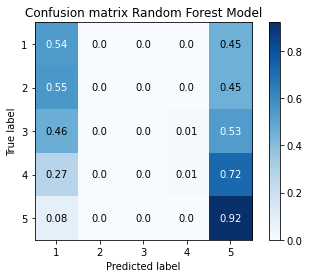

In [100]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, y_pred, normalize=True, title='Confusion matrix Random Forest Model')
plt.xlim(-0.5, 4.5)
plt.ylim(4.5, -0.5)
plt.show()

## Model 2: GaussianNB Classifier

### Feature Scaling

In [99]:
from sklearn.preprocessing import RobustScaler

scaler = RobustScaler()

X_train_vect_avg_enc = scaler.fit_transform(X_train_vect_avg)

X_test_vect_avg_enc = scaler.transform(X_test_vect_avg)

In [100]:
X_test_vect_avg_enc

array([[ 0.22094438,  0.04635041, -0.20100289, ...,  0.79985486,
        -0.20649397, -0.97275913],
       [ 0.63337794, -0.02605118, -0.64986003, ...,  0.4283798 ,
         1.17404256, -0.9327366 ],
       [ 0.13773596,  0.87037329, -0.38115364, ...,  1.55089672,
         0.50578414, -0.55240092],
       ...,
       [-0.4473163 ,  0.11165236,  0.07315791, ..., -0.29344706,
        -0.66979931,  0.66457304],
       [-0.26736397, -0.44781536,  0.70706513, ..., -0.57519384,
        -0.57205921,  0.77256286],
       [ 2.76654515,  3.27961279, -4.51279004, ...,  1.03357155,
         2.96589776, -1.382763  ]])

### Model Training

In [101]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()

gnb.fit(X_train_vect_avg_enc, y_train)

GaussianNB()

# Predict the results

In [102]:
y_pred = gnb.predict(X_test_vect_avg_enc)
y_pred_prob = gnb.predict_proba(X_test_vect_avg_enc)


y_pred

array([4, 4, 4, ..., 4, 3, 5], dtype=int64)

In [103]:
y_pred_prob

array([[3.70451854e-09, 8.88803726e-05, 6.36463807e-03, 9.93544947e-01,
        1.53086581e-06],
       [3.74925772e-03, 1.22445118e-01, 1.07168381e-01, 7.58293678e-01,
        8.34356431e-03],
       [9.25212219e-06, 5.23990827e-05, 1.03830850e-03, 9.52882459e-01,
        4.60175812e-02],
       ...,
       [7.74508872e-11, 1.56423123e-02, 4.82973053e-01, 5.01384634e-01,
        6.28670263e-13],
       [1.40178191e-11, 1.32700783e-01, 8.15992861e-01, 5.13063554e-02,
        1.24839217e-15],
       [1.35970656e-01, 1.06913575e-31, 8.25210391e-37, 1.14047356e-35,
        8.64029344e-01]])

In [109]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.45      0.04      0.07     25782
           2       0.11      0.01      0.02      6251
           3       0.10      0.73      0.18      7589
           4       0.08      0.26      0.12     10258
           5       0.82      0.29      0.43     62679

    accuracy                           0.24    112559
   macro avg       0.31      0.27      0.16    112559
weighted avg       0.58      0.24      0.28    112559



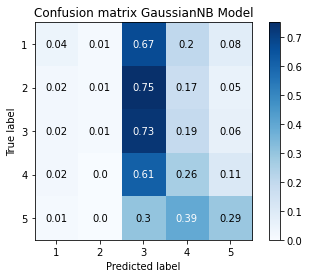

In [108]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, y_pred, normalize=True, title='Confusion matrix GaussianNB Model')
plt.xlim(-0.5, 4.5)
plt.ylim(4.5, -0.5)
plt.show()

# Confusion matrix and Heat Map

In [105]:
# Print the Confusion Matrix along with each part seperately

from sklearn.metrics import confusion_matrix

con_mat = confusion_matrix(y_test, y_pred)

print('Confusion matrix\n\n', con_mat)

print('\nTrue Positives(TP) = ', con_mat[0,0])

print('\nTrue Negatives(TN) = ', con_mat[1,1])

print('\nFalse Positives(FP) = ', con_mat[0,1])

print('\nFalse Negatives(FN) = ', con_mat[1,0])

Confusion matrix

 [[ 1001   342 17292  5051  2096]
 [  125    72  4702  1039   313]
 [  133    58  5522  1409   467]
 [  161    44  6242  2668  1143]
 [  816   136 19060 24492 18175]]

True Positives(TP) =  1001

True Negatives(TN) =  72

False Positives(FP) =  342

False Negatives(FN) =  125


# Classification metrices

In [106]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           1       0.45      0.04      0.07     25782
           2       0.11      0.01      0.02      6251
           3       0.10      0.73      0.18      7589
           4       0.08      0.26      0.12     10258
           5       0.82      0.29      0.43     62679

    accuracy                           0.24    112559
   macro avg       0.31      0.27      0.16    112559
weighted avg       0.58      0.24      0.28    112559



### Input prepreation for the ANN Models

### Dataset  Shuffling 

In [84]:
df_unique_out_drop = df_unique_out_drop.sample(frac = 1)

### Declare the target attribute

In [85]:
X = df_unique_out_drop.drop(['rating'], axis=1)

y = df_unique_out_drop['rating']

In [86]:
df_unique_out_drop

,rating,review_date,app_name,overall_review,review_length
312227,2,2021-03,linkedin,"Addicting, Bugs Can’t see Active status Has a ...",33
178669,5,2021-03,shazam-discover-music-artists,Excellent Great App!!! I use it all the time....,32
206945,5,2021-03,robux-spin-wheel-for-roblox,Rate I like this free robux tool because when...,21
220927,5,2021-02,puppy-town,Lele citty It’s so good I think you earn real...,12
182623,5,2021-02,duckduckgo-search-stories,"Came from Brave, Loved the Switch Before usin...",115
...,...,...,...,...,...
226138,5,2021-03,robux-spin-wheel-for-roblox,Amaizing Just too good,5
320403,5,2021-03,docusign-upload-sign-docs,"Docusign Easy to use, no problems at all.",9
213784,5,2021-02,magic-eraser-remove-photo-background-create-tr...,Camera Power at your finger tips! Such an east...,41
140390,5,2021-02,hotel-story-resort-simulation-game,"Family, Love it game is the best literally my ...",13


In [87]:
df_unique_out_drop = df_unique_out_drop.drop(['review_date', 'app_name', 'review_length'], axis=1)

In [88]:
df_unique_out_drop

,rating,overall_review
312227,2,"Addicting, Bugs Can’t see Active status Has a ..."
178669,5,Excellent Great App!!! I use it all the time....
206945,5,Rate I like this free robux tool because when...
220927,5,Lele citty It’s so good I think you earn real...
182623,5,"Came from Brave, Loved the Switch Before usin..."
...,...,...
226138,5,Amaizing Just too good
320403,5,"Docusign Easy to use, no problems at all."
213784,5,Camera Power at your finger tips! Such an east...
140390,5,"Family, Love it game is the best literally my ..."


In [89]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

def remove_stop_words(text):
    text = word_tokenize(text.lower())
    stop_words = set(stopwords.words('english'))
    text = [word for word in text if word.isalpha() and not word in stop_words]
    return ' '.join(text)
    
x = X.apply(lambda row: remove_stop_words(row['overall_review']), axis=1)

In [90]:
x

312227    addicting bugs see active status serious bug s...
178669    excellent great app use time invaluable identi...
206945    rate like free robux tool enough robux roblox ...
220927                lele citty good think earn reall cash
182623    came brave loved switch using app used brave d...
                                ...                        
226138                                        amaizing good
320403                           docusign easy use problems
213784    camera power finger tips east use great little...
140390    family love game best literally childhood game...
417379    hate spending purchase showed proof paid money...
Length: 450234, dtype: object

In [91]:
y

312227    2
178669    5
206945    5
220927    5
182623    5
         ..
226138    5
320403    5
213784    5
140390    5
417379    1
Name: rating, Length: 450234, dtype: int64

In [92]:
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences

#max_words = 1500
#max_length = 10
max_words = 20000
max_length = 500

tokenizer = Tokenizer(num_words=max_words)
tokenizer.fit_on_texts(x)
sequences = tokenizer.texts_to_sequences(x)
x = pad_sequences(sequences, maxlen=max_length)

In [93]:
from keras.models import Sequential
from keras.layers import Dense, Flatten
import tensorflow as tf
from tensorflow.python import keras
from keras.layers import Embedding

# Text Classification Using Artificial Neural Network

In [105]:
model_1 = Sequential() 
model_1.add(Embedding(max_words, 32, input_length=500)) 
model_1.add(Flatten(data_format=None))
model_1.add(Dense(128, activation='sigmoid'))
model_1.add(Dense(6, activation='softmax'))
#model_1.add(tf.keras.layers.Dense(6, activation='softmax'))
model_1.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model_1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 32)           640000    
                                                                 
 flatten (Flatten)           (None, 16000)             0         
                                                                 
 dense (Dense)               (None, 128)               2048128   
                                                                 
 dense_1 (Dense)             (None, 6)                 774       
                                                                 
Total params: 2,688,902
Trainable params: 2,688,902
Non-trainable params: 0
_________________________________________________________________


In [264]:
#pip install pydot
#pip install graphviz

In [265]:
import keras.utils.vis_utils
from importlib import reload
import graphviz
reload(keras.utils.vis_utils)

<module 'keras.utils.vis_utils' from 'C:\\Users\\engba\\.conda\\envs\\tensorflow\\lib\\site-packages\\keras\\utils\\vis_utils.py'>

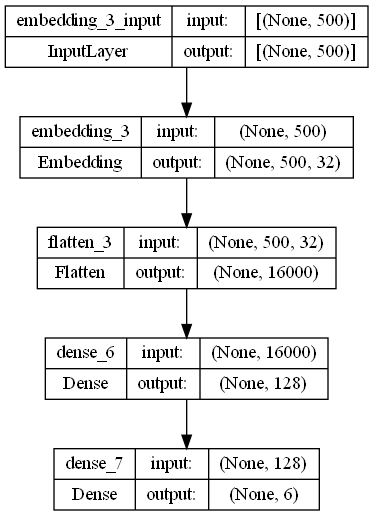

In [266]:
#from keras.layers import Dense
from keras.utils.vis_utils import plot_model
dot_img_file = 'model_plot.png'
plot_model(model_1, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [267]:
hist1 = model_1.fit(x, y, validation_split=0.20, epochs=10, batch_size=2500, shuffle= True, verbose=2)

Epoch 1/10
145/145 - 8s - loss: 0.9888 - accuracy: 0.6554 - val_loss: 0.7800 - val_accuracy: 0.7285 - 8s/epoch - 54ms/step
Epoch 2/10
145/145 - 2s - loss: 0.7372 - accuracy: 0.7404 - val_loss: 0.7285 - val_accuracy: 0.7419 - 2s/epoch - 11ms/step
Epoch 3/10
145/145 - 2s - loss: 0.7021 - accuracy: 0.7502 - val_loss: 0.7205 - val_accuracy: 0.7427 - 2s/epoch - 11ms/step
Epoch 4/10
145/145 - 2s - loss: 0.6862 - accuracy: 0.7551 - val_loss: 0.7226 - val_accuracy: 0.7407 - 2s/epoch - 11ms/step
Epoch 5/10
145/145 - 2s - loss: 0.6735 - accuracy: 0.7590 - val_loss: 0.7245 - val_accuracy: 0.7422 - 2s/epoch - 11ms/step
Epoch 6/10
145/145 - 2s - loss: 0.6605 - accuracy: 0.7634 - val_loss: 0.7253 - val_accuracy: 0.7432 - 2s/epoch - 11ms/step
Epoch 7/10
145/145 - 2s - loss: 0.6449 - accuracy: 0.7689 - val_loss: 0.7325 - val_accuracy: 0.7408 - 2s/epoch - 11ms/step
Epoch 8/10
145/145 - 2s - loss: 0.6248 - accuracy: 0.7763 - val_loss: 0.7454 - val_accuracy: 0.7379 - 2s/epoch - 11ms/step
Epoch 9/10
145/1

[]

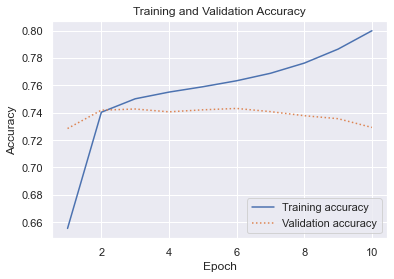

In [268]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set()

acc = hist1.history['accuracy']
val = hist1.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, '-', label='Training accuracy')
plt.plot(epochs, val, ':', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.plot()

# Text Classification Using Convolutional Neural Network

In [97]:
from keras.preprocessing.text import Tokenizer
from keras_preprocessing.sequence import pad_sequences
from keras.layers import Conv1D, MaxPooling1D, GlobalMaxPooling1D

model_2 = Sequential() 
model_2.add(Embedding(max_words, 32, input_length=max_length)) 
model_2.add(Conv1D(32, 7, activation='sigmoid'))
model_2.add(MaxPooling1D(5))
model_2.add(Conv1D(32, 7, activation='relu'))
model_2.add(GlobalMaxPooling1D())
model_2.add(Dense(1, activation='sigmoid'))
model_2.add(tf.keras.layers.Dense(6, activation='softmax'))
model_2.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy']) 
model_2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 500, 32)           640000    
                                                                 
 conv1d_1 (Conv1D)           (None, 494, 32)           7200      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 98, 32)           0         
 1D)                                                             
                                                                 
 conv1d_2 (Conv1D)           (None, 92, 32)            7200      
                                                                 
 global_max_pooling1d (Globa  (None, 32)               0         
 lMaxPooling1D)                                                  
                                                                 
 dense_2 (Dense)             (None, 1)                

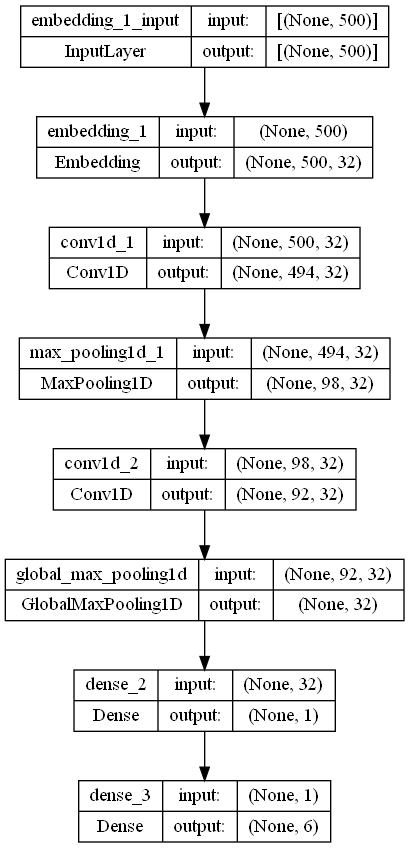

In [98]:
#from keras.layers import Dense
from keras.utils.vis_utils import plot_model
dot_img_file = 'model_plot.png'
plot_model(model_2, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [99]:
hist2 = model_2.fit(x, y, validation_split=0.2, epochs=5, batch_size=1000)

Epoch 1/5
361/361 [==============================] - 90s 249ms/step - loss: 1.5286 - accuracy: 0.5957 - val_loss: 1.2575 - val_accuracy: 0.7065
Epoch 2/5
361/361 [==============================] - 90s 251ms/step - loss: 1.1508 - accuracy: 0.7159 - val_loss: 1.0801 - val_accuracy: 0.7150
Epoch 3/5
361/361 [==============================] - 89s 246ms/step - loss: 1.0346 - accuracy: 0.7222 - val_loss: 1.0116 - val_accuracy: 0.7161
Epoch 4/5
361/361 [==============================] - 90s 250ms/step - loss: 0.9796 - accuracy: 0.7248 - val_loss: 0.9753 - val_accuracy: 0.7172
Epoch 5/5
361/361 [==============================] - 89s 248ms/step - loss: 0.9450 - accuracy: 0.7270 - val_loss: 0.9517 - val_accuracy: 0.7171


[]

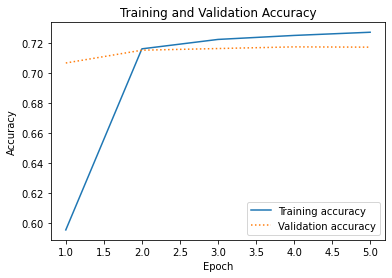

In [100]:
acc = hist2.history['accuracy']
val = hist2.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, '-', label='Training accuracy')
plt.plot(epochs, val, ':', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.plot()

# Text Classification Using Deep Learning with Token based text embedding trained on English Google News 200B corpus.

In [615]:
df_unique_out_drop

,rating,review_date,app_name,overall_review,review_length
177065,1,2021-02,breadwallet-bitcoin-wallet,Spending Fee’s are way too high It cost me $15...,33
224763,5,2021-02,td-ameritrade-mobile,Great app. I find this informative and easy t...,13
404086,2,2021-02,jigsaw-puzzle,"Ads, Spending Can’t get rid of pop up ads I pa...",40
226052,5,2021-03,robux-spin-wheel-for-roblox,Recommendation This free robux app is very go...,16
276355,5,2021-02,minecraft,Feature Requests It’s good Hi I think you guys...,56
...,...,...,...,...,...
341993,3,2021-02,gardenscapes,"Difficult, Spending Wants you to spend, spend,...",18
318652,1,2021-03,toy-blast,"Difficult, Hate it, Level Waste of time While ...",79
281618,1,2021-02,google-classroom,Trash app trasher then my trash can Hate it i...,25
26913,1,2021-02,taco-bell,TERRIBLE THE AMOUNT OF TIMES I HAVE TRIED TO ...,58


In [617]:
df_unique_out_drop = df_unique_out_drop.drop(['review_date', 'app_name', 'review_length'], axis=1)

In [618]:
df_unique_out_drop

,rating,overall_review
177065,1,Spending Fee’s are way too high It cost me $15...
224763,5,Great app. I find this informative and easy t...
404086,2,"Ads, Spending Can’t get rid of pop up ads I pa..."
226052,5,Recommendation This free robux app is very go...
276355,5,Feature Requests It’s good Hi I think you guys...
...,...,...
341993,3,"Difficult, Spending Wants you to spend, spend,..."
318652,1,"Difficult, Hate it, Level Waste of time While ..."
281618,1,Trash app trasher then my trash can Hate it i...
26913,1,TERRIBLE THE AMOUNT OF TIMES I HAVE TRIED TO ...


In [619]:
df_unique_out_drop['rating'] = pd.to_numeric(df_unique_out_drop['rating'], errors="coerce").astype('int32')

In [620]:
from __future__ import absolute_import, division, print_function, unicode_literals

import tensorflow as tf

import os
import datetime
import tensorflow_hub as hub
import numpy as np
    
import pandas as pd
from sklearn.model_selection import train_test_split

In [621]:
df_unique_out_drop.columns

Index(['rating', 'overall_review'], dtype='object')

In [622]:
# Distribution of the reviews rating in the dataset
print('Rating Distribution:\n',df_unique_out_drop['rating'].value_counts())

Rating Distribution:
 5    250727
1    103488
4     40788
3     30228
2     25003
Name: rating, dtype: int64


In [623]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

def remove_stop_words(text):
    text = word_tokenize(text.lower())
    stop_words = set(stopwords.words('english'))
    text = [word for word in text if word.isalpha() and not word in stop_words]
    return ' '.join(text)
    
df_unique_out_drop['overall_review'] = df_unique_out_drop.apply(lambda row: remove_stop_words(row['overall_review']), axis=1)

In [624]:
X_train, X_test = train_test_split(df_unique_out_drop, test_size=0.2, random_state=111)

In [625]:
X_train, X_test

(        rating                                     overall_review
 292297       2  device notifications amzfit bip ca get message...
 387574       5  color issue great app unfortunately messes col...
 397972       4  love great one request realy love game one req...
 128871       5  love bingo bash lot fun every room playing awh...
 155674       4                         good app good app fun play
 ...        ...                                                ...
 14008        5  camera device app ios devices app far ahead ap...
 54663        5  revenue increase test every one skype amp what...
 226127       4  feature requests love notes section measuremen...
 45543        1  hate level erratic game play logic way ball pl...
 255261       2  covid never luck cmb thought give another try ...
 
 [360187 rows x 2 columns],
         rating                                     overall_review
 360395       5  review easy going improving careem crew creati...
 178606       5          love ro

#### Use the Class_Weight method to set and adjust wiehts for the the classes since the dataset is not balanced

In [795]:
from sklearn.utils import class_weight

In [796]:
from sklearn.utils.class_weight import compute_class_weight
class_weights = compute_class_weight(class_weight = "balanced", classes= np.unique(df_unique_out_drop['rating']), y= df_unique_out_drop['rating'])

In [797]:
df_unique_out_drop['rating'].value_counts()

5    250727
1    103488
4     40788
3     30228
2     25003
Name: rating, dtype: int64

In [798]:
class_weights.sort()

In [799]:
class_weights

array([0.35914281, 0.87011827, 2.20767873, 2.97892021, 3.60143983])

In [800]:
weights={}

In [801]:
for index, weight in enumerate(class_weights) :
    weights[index]=weight

In [802]:
weights

{0: 0.35914281270066645,
 1: 0.8701182745825603,
 2: 2.2076787290379523,
 3: 2.9789202064311233,
 4: 3.6014398272207333}

In [803]:
dataset_train = tf.data.Dataset.from_tensor_slices((X_train['overall_review'].values, X_train['rating'].values))
dataset_test = tf.data.Dataset.from_tensor_slices((X_test['overall_review'].values, X_test['rating'].values))

In [804]:
for text, target in dataset_train.take(5):
  print ('rating: {}, overall_review: {}'.format(target, text))

rating: 2, overall_review: b'device notifications amzfit bip ca get messages notifications even though settings correct zepp app ios bought iphone japan get call notifications'
rating: 5, overall_review: b'color issue great app unfortunately messes colors videos look desaturated without filters'
rating: 4, overall_review: b'love great one request realy love game one request could pls add ability one hundred players game'
rating: 5, overall_review: b'love bingo bash lot fun every room playing awhile love bb mixes things every'
rating: 4, overall_review: b'good app good app fun play'


In [805]:
for text, target in dataset_test.take(5):
  print ('rating: {}, overall_review: {}'.format(target, text))

rating: 5, overall_review: b'review easy going improving careem crew creative best'
rating: 5, overall_review: b'love roger broome love app read every day'
rating: 5, overall_review: b'love notifications easy make money app makes easy receive notifications bids makes making money easy love app'
rating: 5, overall_review: b'spending fun game definitely fun game also pay money pocket play'
rating: 5, overall_review: b'really good online removed see gon na lie game almost perfect becoming pro like minutes bad pretty sure another real player match point used online mode see please bring back really cool going friends eating park eating eating review please share'


In [806]:
table = tf.lookup.StaticHashTable(
    initializer=tf.lookup.KeyValueTensorInitializer(
        keys=tf.constant([1, 2, 3, 4, 5]),
        values=tf.constant([1, 2, 3, 4, 5]),
    ),
    default_value=tf.constant(-1),
    name="target_encoding"
)

@tf.function
def target(x):
    return table.lookup(x)

In [807]:
def show_batch(dataset, size=5):
    for batch, label in dataset.take(size):
        print(batch.numpy())
        print(target(label).numpy())

In [808]:
show_batch(dataset_test,5)

b'review easy going improving careem crew creative best'
5
b'love roger broome love app read every day'
5
b'love notifications easy make money app makes easy receive notifications bids makes making money easy love app'
5
b'spending fun game definitely fun game also pay money pocket play'
5
b'really good online removed see gon na lie game almost perfect becoming pro like minutes bad pretty sure another real player match point used online mode see please bring back really cool going friends eating park eating eating review please share'
5


In [809]:
def fetch(text, labels):
        return text, tf.one_hot(target(labels),5)

In [810]:
train_data_f=dataset_train.map(fetch)
test_data_f=dataset_test.map(fetch)

In [811]:
next(iter(train_data_f))

(<tf.Tensor: shape=(), dtype=string, numpy=b'device notifications amzfit bip ca get messages notifications even though settings correct zepp app ios bought iphone japan get call notifications'>,
 <tf.Tensor: shape=(5,), dtype=float32, numpy=array([0., 0., 1., 0., 0.], dtype=float32)>)

In [812]:
train_data, train_labels = next(iter(train_data_f.batch(5)))
train_data, train_labels

(<tf.Tensor: shape=(5,), dtype=string, numpy=
 array([b'device notifications amzfit bip ca get messages notifications even though settings correct zepp app ios bought iphone japan get call notifications',
        b'color issue great app unfortunately messes colors videos look desaturated without filters',
        b'love great one request realy love game one request could pls add ability one hundred players game',
        b'love bingo bash lot fun every room playing awhile love bb mixes things every',
        b'good app good app fun play'], dtype=object)>,
 <tf.Tensor: shape=(5, 5), dtype=float32, numpy=
 array([[0., 0., 1., 0., 0.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1.],
        [0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 1.]], dtype=float32)>)

In [813]:
#https://tfhub.dev/google/tf2-preview/nnlm-en-dim50/1
#https://tfhub.dev/google/tf2-preview/nnlm-en-dim128/1
#https://tfhub.dev/google/nnlm-en-dim128/2

In [814]:
embedding = "https://tfhub.dev/google/tf2-preview/nnlm-en-dim50/1"
hub_layer = hub.KerasLayer(embedding, output_shape=[50], input_shape=[], 
                           dtype=tf.string, trainable=True)
hub_layer(train_data[:1])

<tf.Tensor: shape=(1, 50), dtype=float32, numpy=
array([[ 0.00141332, -0.37997913, -0.3201769 , -0.02017455, -0.09334317,
         0.20827235,  0.57224894,  0.17547038, -0.1366852 ,  0.01963026,
         0.29177758,  0.40072238, -0.06693631, -0.17896223, -0.3370361 ,
         0.17918828, -0.01551427,  0.16410922,  0.29672238,  0.2926596 ,
        -0.34331828,  0.03278448,  0.5213035 ,  0.05563954, -0.4477673 ,
        -0.29178482, -0.33759522,  0.25096443,  0.17543891,  0.18205209,
        -0.05448628,  0.31262326, -0.11001664, -0.1826836 ,  0.08308525,
        -0.51339304,  0.12951961,  0.07614487,  0.12584072,  0.52368355,
         0.3923772 ,  0.3537853 ,  0.24509695,  0.11430766, -0.3660883 ,
         0.0339701 , -0.64749473, -0.02651557,  0.5969114 ,  0.3126895 ]],
      dtype=float32)>

In [815]:
model_3 = tf.keras.Sequential()
model_3.add(hub_layer)
for units in [5]:
    model_3.add(tf.keras.layers.Dense(units, activation='sigmoid'))
    model_3.add(tf.keras.layers.Dropout(0.2))
    model_3.add(tf.keras.layers.Dense(5, activation='softmax'))
model_3.summary()

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_16 (KerasLayer)  (None, 50)               48190600  
                                                                 
 dense_97 (Dense)            (None, 5)                 255       
                                                                 
 dropout_40 (Dropout)        (None, 5)                 0         
                                                                 
 dense_98 (Dense)            (None, 5)                 30        
                                                                 
Total params: 48,190,885
Trainable params: 48,190,885
Non-trainable params: 0
_________________________________________________________________


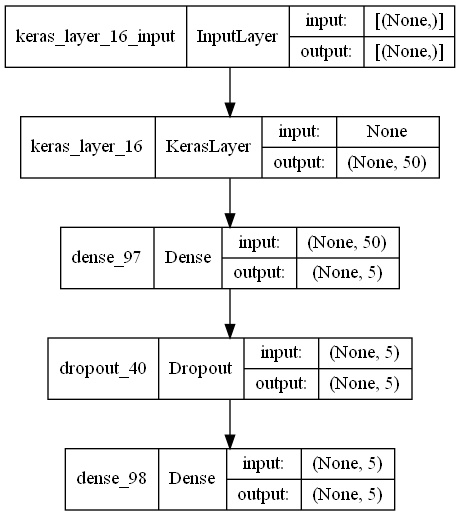

In [816]:
#from keras.layers import Dense
from keras.utils.vis_utils import plot_model
dot_img_file = 'model_plot.png'
plot_model(model_3, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [817]:
model_3.compile(optimizer='adam',
              loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [818]:
#.shuffle(10000)
#class_weight=weights
#, batch_size=20

In [819]:
#train_data_f=train_data_f.shuffle(1000).batch(1000)
#test_data_f=test_data_f.shuffle(500).batch(500)

In [820]:
train_data_f=train_data_f.batch(10000)
test_data_f=test_data_f.batch(1000)

In [821]:
history = model_3.fit(train_data_f,
                    epochs=5,
                    validation_data=test_data_f)

Epoch 1/5
37/37 [==============================] - 9s 227ms/step - loss: 0.7251 - accuracy: 0.1519 - val_loss: 0.6891 - val_accuracy: 0.0880
Epoch 2/5
37/37 [==============================] - 8s 226ms/step - loss: 0.6809 - accuracy: 0.2112 - val_loss: 0.6618 - val_accuracy: 0.2551
Epoch 3/5
37/37 [==============================] - 8s 220ms/step - loss: 0.6542 - accuracy: 0.3223 - val_loss: 0.6374 - val_accuracy: 0.4397
Epoch 4/5
37/37 [==============================] - 8s 225ms/step - loss: 0.6290 - accuracy: 0.4431 - val_loss: 0.6125 - val_accuracy: 0.5929
Epoch 5/5
37/37 [==============================] - 8s 227ms/step - loss: 0.6066 - accuracy: 0.5358 - val_loss: 0.5898 - val_accuracy: 0.6621


In [822]:
len(list(dataset_test))

90047

In [823]:
results = model_3.evaluate(dataset_test.map(fetch).batch(90047), verbose=2)

print(results)

1/1 - 2s - loss: 0.5898 - accuracy: 0.6621 - 2s/epoch - 2s/step
[0.5898398756980896, 0.6620987057685852]


In [824]:
test_data, test_labels = next(iter(dataset_test.map(fetch).batch(100000)))

In [825]:
y_pred=model_3.predict(test_data)

In [826]:
from sklearn.metrics import classification_report

In [827]:
print(classification_report(test_labels.numpy().argmax(axis=1), y_pred.argmax(axis=1)))

              precision    recall  f1-score   support

           0       0.86      0.79      0.82     50146
           1       0.50      0.95      0.65     20652
           2       0.03      0.02      0.02      5018
           3       0.00      0.00      0.00      6018
           4       0.00      0.00      0.00      8213

    accuracy                           0.66     90047
   macro avg       0.28      0.35      0.30     90047
weighted avg       0.59      0.66      0.61     90047



[]

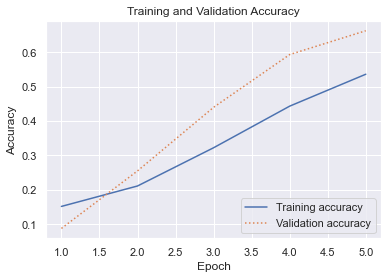

In [828]:
acc = history.history['accuracy']
val = history.history['val_accuracy']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, '-', label='Training accuracy')
plt.plot(epochs, val, ':', label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.plot()